# Getting dataframe and it all set up

In [1]:
import pandas as pd
import matplotlib.pyplot as plt
import numpy as np
import math
import seaborn as sns

ImportError: this version of pandas is incompatible with numpy < 1.17.3
your numpy version is 1.16.5.
Please upgrade numpy to >= 1.17.3 to use this pandas version

In [2]:
import os

In [3]:
os.getcwd()

'C:\\Users\\NORRIKA'

In [4]:
os.chdir(r'C:\Users\NORRIKA\OneDrive - Key Corp\Documents\Project')

In [5]:
pd.read_csv('BondSignalData.csv')

,request_time,cusip,quantity_bonds,liq_score,mat_bucket,industrySector,ticker,move_1D,move_3D,signal1,signal2,signal3,cparty_id
0,1/4/2021 8:32,594918BY9,3000,170,B05,Technology,MSFT,0.139226,-1.705008,0.000000,-0.255871,1.000000,0
1,1/4/2021 12:58,37331NAK7,50,558,B10,Basic Materials,GP,0.169077,0.622054,0.790123,0.842762,-0.208001,0
2,1/4/2021 12:58,37331NAK7,50,558,B10,Basic Materials,GP,0.169077,0.622054,0.790123,0.820288,-0.469933,1
3,1/4/2021 13:07,500255AU8,50,347,B05,Consumer Cyclical,KSS,-1.917058,-2.578685,0.085106,0.506236,-1.000000,0
4,1/4/2021 13:14,594918BY9,80,170,B05,Technology,MSFT,0.190731,-1.134894,-0.708861,-0.751947,-0.260192,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...
12494,4/1/2021 19:39,031162CR9,1340,47,B30,Consumer Non-cyclical,AMGN,0.232550,1.455575,0.238095,-0.961889,-0.247929,120
12495,4/1/2021 19:39,126650CX6,118,13,B10,Consumer Non-cyclical,CVS,1.419900,3.291750,-0.618182,0.641902,1.000000,120
12496,4/1/2021 19:49,260543DD2,10,49,B30,Basic Materials,DOW,0.314750,2.243250,-0.777778,0.875334,0.091794,190
12497,4/1/2021 20:36,378272AY4,130,181,B10,Basic Materials,GLENLN,0.071282,0.770356,-0.996364,0.658985,0.541421,176


In [6]:
data = pd.read_csv('BondSignalData.csv')

In [7]:
data.dtypes

request_time       object
cusip              object
quantity_bonds      int64
liq_score           int64
mat_bucket         object
industrySector     object
ticker             object
move_1D           float64
move_3D           float64
signal1           float64
signal2           float64
signal3           float64
cparty_id           int64
dtype: object

# turning request time into date time

In [8]:
data.request_time

0         1/4/2021 8:32
1        1/4/2021 12:58
2        1/4/2021 12:58
3        1/4/2021 13:07
4        1/4/2021 13:14
              ...      
12494    4/1/2021 19:39
12495    4/1/2021 19:39
12496    4/1/2021 19:49
12497    4/1/2021 20:36
12498    4/1/2021 20:51
Name: request_time, Length: 12499, dtype: object

In [9]:
type(data['request_time'][0])

str

In [10]:
data['request_time'][0]

'1/4/2021 8:32'

In [11]:
import dateutil.parser as dparser
dparser.parse('1/4/21 8:32 AM')
dparser.parse('1/4/21 8:32 AM').date()

datetime.date(2021, 1, 4)

In [12]:
data.request_time.apply(dparser.parse().date())

TypeError: parse() missing 1 required positional argument: 'timestr'

In [13]:
data['rqdatetime'] = pd.to_datetime(data.request_time)

In [14]:
data.head()

,request_time,cusip,quantity_bonds,liq_score,mat_bucket,industrySector,ticker,move_1D,move_3D,signal1,signal2,signal3,cparty_id,rqdatetime
0,1/4/2021 8:32,594918BY9,3000,170,B05,Technology,MSFT,0.139226,-1.705008,0.000000,-0.255871,1.000000,0,2021-01-04 08:32:00
1,1/4/2021 12:58,37331NAK7,50,558,B10,Basic Materials,GP,0.169077,0.622054,0.790123,0.842762,-0.208001,0,2021-01-04 12:58:00
2,1/4/2021 12:58,37331NAK7,50,558,B10,Basic Materials,GP,0.169077,0.622054,0.790123,0.820288,-0.469933,1,2021-01-04 12:58:00
3,1/4/2021 13:07,500255AU8,50,347,B05,Consumer Cyclical,KSS,-1.917058,-2.578685,0.085106,0.506236,-1.000000,0,2021-01-04 13:07:00
4,1/4/2021 13:14,594918BY9,80,170,B05,Technology,MSFT,0.190731,-1.134894,-0.708861,-0.751947,-0.260192,0,2021-01-04 13:14:00


In [15]:
data.dtypes

request_time              object
cusip                     object
quantity_bonds             int64
liq_score                  int64
mat_bucket                object
industrySector            object
ticker                    object
move_1D                  float64
move_3D                  float64
signal1                  float64
signal2                  float64
signal3                  float64
cparty_id                  int64
rqdatetime        datetime64[ns]
dtype: object

In [15]:
import datetime as dt

In [16]:
data['rqdatetime'].dt.date

0        2021-01-04
1        2021-01-04
2        2021-01-04
3        2021-01-04
4        2021-01-04
            ...    
12494    2021-04-01
12495    2021-04-01
12496    2021-04-01
12497    2021-04-01
12498    2021-04-01
Name: rqdatetime, Length: 12499, dtype: object

In [17]:
data['rfqdate']=data['rqdatetime'].dt.date

In [18]:
data.head()

,request_time,cusip,quantity_bonds,liq_score,mat_bucket,industrySector,ticker,move_1D,move_3D,signal1,signal2,signal3,cparty_id,rqdatetime,rfqdate
0,1/4/2021 8:32,594918BY9,3000,170,B05,Technology,MSFT,0.139226,-1.705008,0.000000,-0.255871,1.000000,0,2021-01-04 08:32:00,2021-01-04
1,1/4/2021 12:58,37331NAK7,50,558,B10,Basic Materials,GP,0.169077,0.622054,0.790123,0.842762,-0.208001,0,2021-01-04 12:58:00,2021-01-04
2,1/4/2021 12:58,37331NAK7,50,558,B10,Basic Materials,GP,0.169077,0.622054,0.790123,0.820288,-0.469933,1,2021-01-04 12:58:00,2021-01-04
3,1/4/2021 13:07,500255AU8,50,347,B05,Consumer Cyclical,KSS,-1.917058,-2.578685,0.085106,0.506236,-1.000000,0,2021-01-04 13:07:00,2021-01-04
4,1/4/2021 13:14,594918BY9,80,170,B05,Technology,MSFT,0.190731,-1.134894,-0.708861,-0.751947,-0.260192,0,2021-01-04 13:14:00,2021-01-04


In [19]:
#plt.scatter(data['rfqdate'], data['signal1'])

In [20]:
data.groupby(['rfqdate']).signal1.mean()

rfqdate
2021-01-04    0.387550
2021-01-05    0.503837
2021-01-06   -0.025972
2021-01-07   -0.535579
2021-01-08   -0.214067
                ...   
2021-03-26   -0.528217
2021-03-29   -0.223414
2021-03-30   -0.455331
2021-03-31   -0.813733
2021-04-01   -0.550131
Name: signal1, Length: 62, dtype: float64

In [21]:
data['signal1dailyavg'] = data.groupby(['rfqdate'])['signal1'].transform('mean')
data['signal2dailyavg'] = data.groupby(['rfqdate'])['signal2'].transform('mean')
data['signal3dailyavg'] = data.groupby(['rfqdate'])['signal3'].transform('mean')

In [22]:
data.head()

,request_time,cusip,quantity_bonds,liq_score,mat_bucket,industrySector,ticker,move_1D,move_3D,signal1,signal2,signal3,cparty_id,rqdatetime,rfqdate,signal1dailyavg,signal2dailyavg,signal3dailyavg
0,1/4/2021 8:32,594918BY9,3000,170,B05,Technology,MSFT,0.139226,-1.705008,0.000000,-0.255871,1.000000,0,2021-01-04 08:32:00,2021-01-04,0.38755,0.079645,0.513054
1,1/4/2021 12:58,37331NAK7,50,558,B10,Basic Materials,GP,0.169077,0.622054,0.790123,0.842762,-0.208001,0,2021-01-04 12:58:00,2021-01-04,0.38755,0.079645,0.513054
2,1/4/2021 12:58,37331NAK7,50,558,B10,Basic Materials,GP,0.169077,0.622054,0.790123,0.820288,-0.469933,1,2021-01-04 12:58:00,2021-01-04,0.38755,0.079645,0.513054
3,1/4/2021 13:07,500255AU8,50,347,B05,Consumer Cyclical,KSS,-1.917058,-2.578685,0.085106,0.506236,-1.000000,0,2021-01-04 13:07:00,2021-01-04,0.38755,0.079645,0.513054
4,1/4/2021 13:14,594918BY9,80,170,B05,Technology,MSFT,0.190731,-1.134894,-0.708861,-0.751947,-0.260192,0,2021-01-04 13:14:00,2021-01-04,0.38755,0.079645,0.513054


C:\ProgramData\Anaconda3\lib\site-packages\pandas\plotting\_matplotlib\converter.py:103: FutureWarning: Using an implicitly registered datetime converter for a matplotlib plotting method. The converter was registered by pandas on import. Future versions of pandas will require you to explicitly register matplotlib converters.

To register the converters:
	>>> from pandas.plotting import register_matplotlib_converters
	>>> register_matplotlib_converters()
  warnings.warn(msg, FutureWarning)


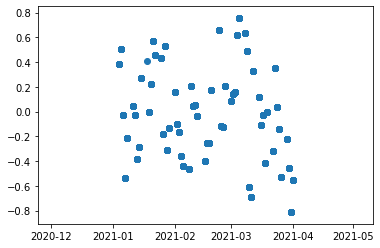

In [23]:
plt.scatter(data['rfqdate'], data['signal1dailyavg'])

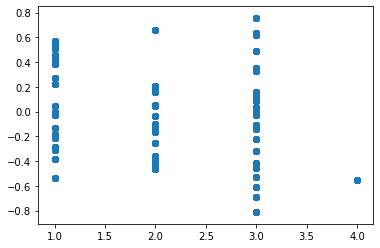

In [28]:
plt.scatter(data['month'], data['signal1dailyavg'])

In [26]:
#days_sorted = sorted(data.rfqdate, key=lambda day: datetime.strptime(day, "%d-%b-%Y"))

In [27]:
data.dtypes

request_time               object
cusip                      object
quantity_bonds              int64
liq_score                   int64
mat_bucket                 object
industrySector             object
ticker                     object
move_1D                   float64
move_3D                   float64
signal1                   float64
signal2                   float64
signal3                   float64
cparty_id                   int64
rqdatetime         datetime64[ns]
rfqdate                    object
signal1dailyavg           float64
signal2dailyavg           float64
signal3dailyavg           float64
dtype: object

In [25]:
data['year']=pd.to_datetime(data.request_time).dt.year
data['month']=data.rqdatetime.dt.month
data['day']=pd.to_datetime(data.request_time).dt.day
data['hour']=pd.to_datetime(data.request_time).dt.hour
data['minute']=pd.to_datetime(data.request_time).dt.minute

In [26]:
data['day']= data['day'].apply(lambda x: '{0:0>2}'.format(x)) #turning day to two digits so 1-04 comes before 1-11

In [27]:
data.head()

,request_time,cusip,quantity_bonds,liq_score,mat_bucket,industrySector,ticker,move_1D,move_3D,signal1,...,rqdatetime,rfqdate,signal1dailyavg,signal2dailyavg,signal3dailyavg,year,month,day,hour,minute
0,1/4/2021 8:32,594918BY9,3000,170,B05,Technology,MSFT,0.139226,-1.705008,0.000000,...,2021-01-04 08:32:00,2021-01-04,0.38755,0.079645,0.513054,2021,1,04,8,32
1,1/4/2021 12:58,37331NAK7,50,558,B10,Basic Materials,GP,0.169077,0.622054,0.790123,...,2021-01-04 12:58:00,2021-01-04,0.38755,0.079645,0.513054,2021,1,04,12,58
2,1/4/2021 12:58,37331NAK7,50,558,B10,Basic Materials,GP,0.169077,0.622054,0.790123,...,2021-01-04 12:58:00,2021-01-04,0.38755,0.079645,0.513054,2021,1,04,12,58
3,1/4/2021 13:07,500255AU8,50,347,B05,Consumer Cyclical,KSS,-1.917058,-2.578685,0.085106,...,2021-01-04 13:07:00,2021-01-04,0.38755,0.079645,0.513054,2021,1,04,13,7
4,1/4/2021 13:14,594918BY9,80,170,B05,Technology,MSFT,0.190731,-1.134894,-0.708861,...,2021-01-04 13:14:00,2021-01-04,0.38755,0.079645,0.513054,2021,1,04,13,14


In [31]:
data.dtypes

request_time               object
cusip                      object
quantity_bonds              int64
liq_score                   int64
mat_bucket                 object
industrySector             object
ticker                     object
move_1D                   float64
move_3D                   float64
signal1                   float64
signal2                   float64
signal3                   float64
cparty_id                   int64
rqdatetime         datetime64[ns]
rfqdate                    object
signal1dailyavg           float64
signal2dailyavg           float64
signal3dailyavg           float64
year                        int64
month                       int64
day                        object
hour                        int64
minute                      int64
dtype: object

In [29]:
data['month_day']= (data['month'].astype(str) + "-" + data['day'].astype(str)) #putting month & day together

In [33]:
data.head()

,request_time,cusip,quantity_bonds,liq_score,mat_bucket,industrySector,ticker,move_1D,move_3D,signal1,...,rfqdate,signal1dailyavg,signal2dailyavg,signal3dailyavg,year,month,day,hour,minute,month_day
0,1/4/2021 8:32,594918BY9,3000,170,B05,Technology,MSFT,0.139226,-1.705008,0.000000,...,2021-01-04,0.38755,0.079645,0.513054,2021,1,04,8,32,1-04
1,1/4/2021 12:58,37331NAK7,50,558,B10,Basic Materials,GP,0.169077,0.622054,0.790123,...,2021-01-04,0.38755,0.079645,0.513054,2021,1,04,12,58,1-04
2,1/4/2021 12:58,37331NAK7,50,558,B10,Basic Materials,GP,0.169077,0.622054,0.790123,...,2021-01-04,0.38755,0.079645,0.513054,2021,1,04,12,58,1-04
3,1/4/2021 13:07,500255AU8,50,347,B05,Consumer Cyclical,KSS,-1.917058,-2.578685,0.085106,...,2021-01-04,0.38755,0.079645,0.513054,2021,1,04,13,7,1-04
4,1/4/2021 13:14,594918BY9,80,170,B05,Technology,MSFT,0.190731,-1.134894,-0.708861,...,2021-01-04,0.38755,0.079645,0.513054,2021,1,04,13,14,1-04


# combining month 4 w 3 

In [30]:
data['month'] = data['month'].replace(4, 3)

In [31]:
data[(data['month'] == 3)] 

,request_time,cusip,quantity_bonds,liq_score,mat_bucket,industrySector,ticker,move_1D,move_3D,signal1,...,rfqdate,signal1dailyavg,signal2dailyavg,signal3dailyavg,year,month,day,hour,minute,month_day
2034,3/5/2021 17:04,91913YAX8,4,1195,B02,Energy,VLO,1.125387,2.118695,0.931559,...,2021-03-05,0.756983,0.031630,0.766772,2021,3,05,17,4,3-05
7412,3/1/2021 12:45,500255AU8,15,477,B05,Consumer Cyclical,KSS,-0.476040,-1.535271,-0.086957,...,2021-03-01,0.087532,0.040851,0.088963,2021,3,01,12,45,3-01
7413,3/1/2021 12:45,594918BY9,24,133,B05,Technology,MSFT,-0.112000,-0.116575,-0.188525,...,2021-03-01,0.087532,0.040851,0.088963,2021,3,01,12,45,3-01
7414,3/1/2021 13:39,37045XBW5,80,1535,B03,Consumer Cyclical,GM,0.519769,1.261303,-0.032374,...,2021-03-01,0.087532,0.040851,0.088963,2021,3,01,13,39,3-01
7415,3/1/2021 13:41,594918BY9,17,133,B05,Technology,MSFT,0.173478,0.417741,0.286290,...,2021-03-01,0.087532,0.040851,0.088963,2021,3,01,13,41,3-01
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
12494,4/1/2021 19:39,031162CR9,1340,47,B30,Consumer Non-cyclical,AMGN,0.232550,1.455575,0.238095,...,2021-04-01,-0.550131,-0.013671,-0.134084,2021,3,01,19,39,4-01
12495,4/1/2021 19:39,126650CX6,118,13,B10,Consumer Non-cyclical,CVS,1.419900,3.291750,-0.618182,...,2021-04-01,-0.550131,-0.013671,-0.134084,2021,3,01,19,39,4-01
12496,4/1/2021 19:49,260543DD2,10,49,B30,Basic Materials,DOW,0.314750,2.243250,-0.777778,...,2021-04-01,-0.550131,-0.013671,-0.134084,2021,3,01,19,49,4-01
12497,4/1/2021 20:36,378272AY4,130,181,B10,Basic Materials,GLENLN,0.071282,0.770356,-0.996364,...,2021-04-01,-0.550131,-0.013671,-0.134084,2021,3,01,20,36,4-01


# Box plots (month & hour vs. signal[1,2,3])

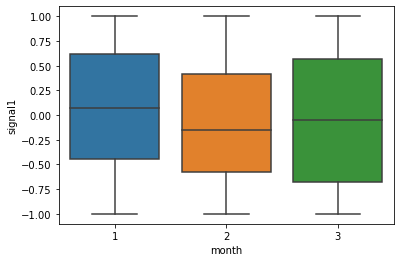

In [36]:
sns.boxplot(x=data['month'], y=data['signal1'])

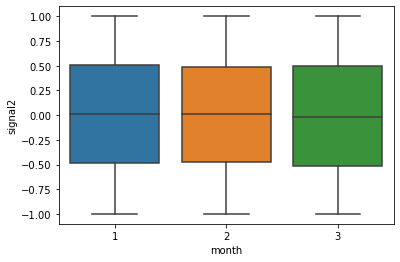

In [37]:
sns.boxplot(x=data['month'], y=data['signal2'])

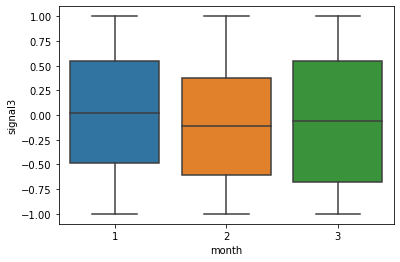

In [38]:
sns.boxplot(x=data['month'], y=data['signal3'])

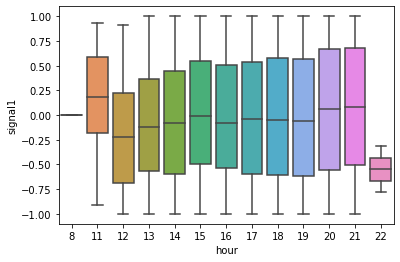

In [39]:
sns.boxplot(x=data['hour'], y=data['signal1'])

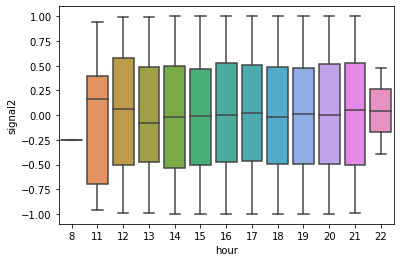

In [40]:
sns.boxplot(x=data['hour'], y=data['signal2'])

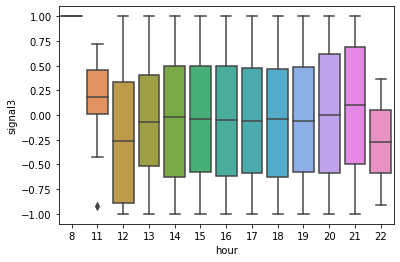

In [41]:
sns.boxplot(x=data['hour'], y=data['signal3'])

In [42]:
hour=[8,11,12,13,14,15,16,17,18,19,20,21,22]
for h in hour:
    print(h, data[data['hour']== h]['move_1D'].corr(data[data['hour']== h]['signal3']))

8 nan
11 0.9289018809161744
12 0.8504812771538128
13 0.8269174631191307
14 0.8603803872239674
15 0.8105081217760758
16 0.8397067814733502
17 0.8355279952669387
18 0.8407821802953628
19 0.8408643413273719
20 0.8519556476440596
21 0.837919946184179
22 1.0


C:\ProgramData\Anaconda3\lib\site-packages\numpy\lib\function_base.py:2522: RuntimeWarning: Degrees of freedom <= 0 for slice
  c = cov(x, y, rowvar)
C:\ProgramData\Anaconda3\lib\site-packages\numpy\lib\function_base.py:2451: RuntimeWarning: divide by zero encountered in true_divide
  c *= np.true_divide(1, fact)


# Trying to look @ industry sectors

In [43]:
data.groupby('industrySector').mean()

,quantity_bonds,liq_score,move_1D,move_3D,signal1,signal2,signal3,cparty_id,signal1dailyavg,signal2dailyavg,signal3dailyavg,year,month,hour,minute
industrySector,,,,,,,,,,,,,,,
Basic Materials,568.178368,308.571157,-0.237256,-0.500395,-0.093324,0.005001,-0.137181,82.508539,-0.036298,0.000180,-0.073274,2021.0,2.113852,16.516129,28.994307
Consumer Cyclical,333.248201,613.442446,0.026058,0.073053,0.018888,0.021216,-0.003193,95.803957,0.013782,0.000139,0.020032,2021.0,2.132194,16.790468,29.499101
Consumer Non-cyclical,397.203179,529.102281,-0.102503,-0.286708,-0.032112,-0.006509,-0.080822,106.158950,-0.020885,-0.002416,-0.043623,2021.0,2.095830,16.986178,28.823313
Energy,320.658960,1519.141618,0.032729,0.200144,0.054195,-0.039633,0.023841,119.196532,0.014478,-0.000196,0.011677,2021.0,1.933526,17.112717,28.835260
Financial,257.656839,1134.936937,0.051930,0.158692,-0.010757,-0.004791,0.023178,119.538903,-0.008156,-0.000772,-0.025800,2021.0,2.067158,17.285831,29.110975
Industrial,343.114208,1625.449354,-0.091933,-0.218115,-0.044732,0.010007,-0.062531,96.974847,-0.058123,-0.003018,-0.075313,2021.0,2.108090,16.857240,29.227736
Technology,295.322421,1102.251390,0.006341,0.011912,0.010204,-0.006501,0.007750,105.423718,-0.008536,-0.000057,-0.038322,2021.0,2.067943,17.127857,28.594812
Utilities,398.014041,1097.299532,-0.006559,-0.111992,0.020301,0.005235,-0.012169,104.063963,-0.004168,-0.004936,-0.018076,2021.0,2.210608,16.920437,28.691108


In [44]:
data.groupby('industrySector').count()

,request_time,cusip,quantity_bonds,liq_score,mat_bucket,ticker,move_1D,move_3D,signal1,signal2,...,rfqdate,signal1dailyavg,signal2dailyavg,signal3dailyavg,year,month,day,hour,minute,month_day
industrySector,,,,,,,,,,,,,,,,,,,,,
Basic Materials,527,527,527,527,527,527,527,527,527,527,...,527,527,527,527,527,527,527,527,527,527
Consumer Cyclical,1112,1112,1112,1112,1112,1112,1112,1112,1112,1112,...,1112,1112,1112,1112,1112,1112,1112,1112,1112,1112
Consumer Non-cyclical,4341,4341,4341,4341,4341,4341,4341,4341,4341,4341,...,4341,4341,4341,4341,4341,4341,4341,4341,4341,4341
Energy,346,346,346,346,346,346,346,346,346,346,...,346,346,346,346,346,346,346,346,346,346
Financial,2442,2442,2442,2442,2442,2442,2442,2442,2442,2442,...,2442,2442,2442,2442,2442,2442,2442,2442,2442,2442
Industrial,1471,1471,1471,1471,1471,1471,1471,1471,1471,1471,...,1471,1471,1471,1471,1471,1471,1471,1471,1471,1471
Technology,1619,1619,1619,1619,1619,1619,1619,1619,1619,1619,...,1619,1619,1619,1619,1619,1619,1619,1619,1619,1619
Utilities,641,641,641,641,641,641,641,641,641,641,...,641,641,641,641,641,641,641,641,641,641


In [45]:
data.groupby(['industrySector'])['move_1D'].describe()

,count,mean,std,min,25%,50%,75%,max
industrySector,,,,,,,,
Basic Materials,527.0,-0.237256,1.176910,-3.916250,-0.950125,-0.106750,0.393886,3.444750
Consumer Cyclical,1112.0,0.026058,0.946148,-2.983750,-0.530572,-0.015820,0.542894,6.196359
Consumer Non-cyclical,4341.0,-0.102503,1.186517,-3.649625,-0.756973,-0.123640,0.516100,6.483256
Energy,346.0,0.032729,0.666841,-1.600259,-0.438508,-0.006145,0.392190,2.579072
Financial,2442.0,0.051930,0.766908,-3.931705,-0.338073,0.002671,0.335459,7.652850
Industrial,1471.0,-0.091933,0.803769,-4.418720,-0.510248,-0.056631,0.349470,4.156250
Technology,1619.0,0.006341,0.808444,-3.081678,-0.418719,0.012122,0.450462,3.298471
Utilities,641.0,-0.006559,0.884619,-3.289175,-0.431856,-0.008850,0.431440,4.247750


In [46]:
data.groupby(['industrySector'])['signal1'].describe()

,count,mean,std,min,25%,50%,75%,max
industrySector,,,,,,,,
Basic Materials,527.0,-0.093324,0.622823,-1.0,-0.661392,-0.141667,0.489502,1.0
Consumer Cyclical,1112.0,0.018888,0.598509,-1.0,-0.488825,-0.003610,0.542945,1.0
Consumer Non-cyclical,4341.0,-0.032112,0.630680,-1.0,-0.608392,-0.062706,0.560345,1.0
Energy,346.0,0.054195,0.632837,-1.0,-0.479987,0.029176,0.631818,1.0
Financial,2442.0,-0.010757,0.606367,-1.0,-0.522375,-0.028226,0.535270,1.0
Industrial,1471.0,-0.044732,0.607266,-1.0,-0.588235,-0.093385,0.507327,1.0
Technology,1619.0,0.010204,0.616683,-1.0,-0.538462,0.007117,0.570053,1.0
Utilities,641.0,0.020301,0.643128,-1.0,-0.539419,0.024590,0.607143,1.0


# come back to these. not done with 

In [47]:
data[['industrySector','month_day','signal1','signal2','signal3','move_1D','move_3D']]

,industrySector,month_day,signal1,signal2,signal3,move_1D,move_3D
0,Technology,1-04,0.000000,-0.255871,1.000000,0.139226,-1.705008
1,Basic Materials,1-04,0.790123,0.842762,-0.208001,0.169077,0.622054
2,Basic Materials,1-04,0.790123,0.820288,-0.469933,0.169077,0.622054
3,Consumer Cyclical,1-04,0.085106,0.506236,-1.000000,-1.917058,-2.578685
4,Technology,1-04,-0.708861,-0.751947,-0.260192,0.190731,-1.134894
...,...,...,...,...,...,...,...
12494,Consumer Non-cyclical,4-01,0.238095,-0.961889,-0.247929,0.232550,1.455575
12495,Consumer Non-cyclical,4-01,-0.618182,0.641902,1.000000,1.419900,3.291750
12496,Basic Materials,4-01,-0.777778,0.875334,0.091794,0.314750,2.243250
12497,Basic Materials,4-01,-0.996364,0.658985,0.541421,0.071282,0.770356


In [48]:
deeperindustrysector=data[['industrySector','month_day','signal1','signal2','signal3','move_1D','move_3D']]

In [49]:
deeperindustrysector.groupby(['industrySector']).max()

,month_day,signal1,signal2,signal3,move_1D,move_3D
industrySector,,,,,,
Basic Materials,4-01,1.0,0.998003,1.0,3.444750,6.795250
Consumer Cyclical,4-01,1.0,0.999882,1.0,6.196359,9.480775
Consumer Non-cyclical,4-01,1.0,0.999911,1.0,6.483256,9.688825
Energy,4-01,1.0,0.978481,1.0,2.579072,7.619375
Financial,4-01,1.0,0.999975,1.0,7.652850,7.924175
Industrial,4-01,1.0,0.999598,1.0,4.156250,5.780000
Technology,4-01,1.0,0.999897,1.0,3.298471,5.526103
Utilities,4-01,1.0,0.997962,1.0,4.247750,6.032272


In [50]:
deeperindustrysector.groupby(['industrySector']).describe()

signal1                                               \
                        count      mean       std  min       25%       50%   
industrySector                                                               
Basic Materials         527.0 -0.093324  0.622823 -1.0 -0.661392 -0.141667   
Consumer Cyclical      1112.0  0.018888  0.598509 -1.0 -0.488825 -0.003610   
Consumer Non-cyclical  4341.0 -0.032112  0.630680 -1.0 -0.608392 -0.062706   
Energy                  346.0  0.054195  0.632837 -1.0 -0.479987  0.029176   
Financial              2442.0 -0.010757  0.606367 -1.0 -0.522375 -0.028226   
Industrial             1471.0 -0.044732  0.607266 -1.0 -0.588235 -0.093385   
Technology             1619.0  0.010204  0.616683 -1.0 -0.538462  0.007117   
Utilities               641.0  0.020301  0.643128 -1.0 -0.539419  0.024590   

                                     signal2            ...   move_1D  \
                            75%  max   count      mean  ...       75%   
industrySector                                          ...             
Basic Materials        0.489502  1.0   527.0  0.005001  ...  0.393886   
Consumer Cyclical      0.542945  1.0  1112.0  0.021216  ...  0.542894   
Consumer Non-cyclical  0.560345  1.0  4341.0 -0.006509  ...  0.516100   
Energy                 0.631818  1.0   346.0 -0.039633  ...  0.392190   
Financial              0.535270  1.0  2442.0 -0.004791  ...  0.335459   
Industrial             0.507327  1.0  1471.0  0.010007  ...  0.349470   
Technology             0.570053  1.0  1619.0 -0.006501  ...  0.450462   
Utilities              0.607143  1.0   641.0  0.005235  ...  0.431440   

                                move_3D                                \
                            max   count      mean       std       min   
industrySector                                                          
Basic Materials        3.444750   527.0 -0.500395  2.546329 -7.188000   
Consumer Cyclical      6.196359  1112.0  0.073053  1.888647 -8.926451   
Consumer Non-cyclical  6.483256  4341.0 -0.286708  2.318601 -6.983025   
Energy                 2.579072   346.0  0.200144  1.481144 -3.141650   
Financial              7.652850  2442.0  0.158692  1.312066 -4.757700   
Industrial             4.156250  1471.0 -0.218115  1.514880 -8.030499   
Technology             3.298471  1619.0  0.011912  1.363932 -6.580200   
Utilities              4.247750   641.0 -0.111992  1.473642 -5.367000   

                                                               
                            25%       50%       75%       max  
industrySector                                                 
Basic Materials       -1.669000 -0.312250  0.768678  6.795250  
Consumer Cyclical     -0.893101 -0.040645  0.963344  9.480775  
Consumer Non-cyclical -1.750055 -0.238722  1.011275  9.688825  
Energy                -0.719311 -0.046776  0.662224  7.619375  
Financial             -0.588487  0.024219  0.706575  7.924175  
Industrial            -0.898940 -0.108321  0.642335  5.780000  
Technology            -0.862231 -0.085043  0.751924  5.526103  
Utilities             -0.990987 -0.088638  0.730125  6.032272  

[8 rows x 40 columns]

# looking at corr between sectors and move_1D and signals
###can use deeperindustrysector or data; same info in each dataframe

## signal3 sector corr

In [53]:
industrySector=['Technology', 'Basic Materials', 'Consumer Cyclical', 'Financial',
       'Consumer Non-cyclical', 'Industrial', 'Utilities', 'Energy']
for sector in industrySector:
       print(sector, data[data['industrySector']== sector]['move_1D'].corr(data[data['industrySector']== sector]['signal3']))

Technology 0.863411640938526
Basic Materials 0.8614915910012315
Consumer Cyclical 0.8340054624177463
Financial 0.7374369054049094
Consumer Non-cyclical 0.8683997921541552
Industrial 0.8379156618415927
Utilities 0.8345644736999595
Energy 0.8554225272790689


## signal1 sector corr

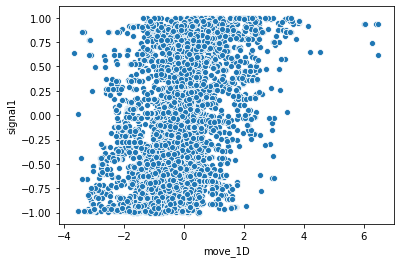

In [202]:
sns.scatterplot(data[data['industrySector']=='Consumer Non-cyclical']['move_1D'],data[data['industrySector']=='Consumer Non-cyclical']['signal1'] )

In [54]:
industrySector=['Technology', 'Basic Materials', 'Consumer Cyclical', 'Financial',
       'Consumer Non-cyclical', 'Industrial', 'Utilities', 'Energy']
for sector in industrySector:
       print(sector, data[data['industrySector']== sector]['move_1D'].corr(data[data['industrySector']== sector]['signal1']))

Technology 0.02036523885371043
Basic Materials 0.3400170389764945
Consumer Cyclical 0.2300097110573187
Financial 0.09803624940931684
Consumer Non-cyclical 0.3810737524555877
Industrial 0.17819593045486318
Utilities 0.2529362868009678
Energy 0.1433704659753429


In [36]:
data[(data['industrySector'] == 'Consumer Non-cyclical')]

,request_time,cusip,quantity_bonds,liq_score,mat_bucket,industrySector,ticker,move_1D,move_3D,signal1,...,rfqdate,signal1dailyavg,signal2dailyavg,signal3dailyavg,year,month,day,hour,minute,month_day
11,1/4/2021 14:08,126650CX6,11,3,B10,Consumer Non-cyclical,CVS,3.169975,0.786500,0.473684,...,2021-01-04,0.387550,0.079645,0.513054,2021,1,04,14,8,1-04
15,1/4/2021 14:08,126650CX6,11,3,B10,Consumer Non-cyclical,CVS,3.169975,0.786500,0.473684,...,2021-01-04,0.387550,0.079645,0.513054,2021,1,04,14,8,1-04
19,1/4/2021 14:14,126650CX6,57,3,B10,Consumer Non-cyclical,CVS,2.727575,0.714875,0.473684,...,2021-01-04,0.387550,0.079645,0.513054,2021,1,04,14,14,1-04
20,1/4/2021 14:14,126650CX6,57,3,B10,Consumer Non-cyclical,CVS,2.727575,0.714875,0.473684,...,2021-01-04,0.387550,0.079645,0.513054,2021,1,04,14,14,1-04
23,1/4/2021 14:33,031162CR9,250,82,B30,Consumer Non-cyclical,AMGN,2.558652,3.166020,0.697297,...,2021-01-04,0.387550,0.079645,0.513054,2021,1,04,14,33,1-04
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
12487,4/1/2021 19:09,126650CX6,300,13,B10,Consumer Non-cyclical,CVS,1.049852,3.023215,-0.618182,...,2021-04-01,-0.550131,-0.013671,-0.134084,2021,3,01,19,9,4-01
12491,4/1/2021 19:28,126650CX6,20,13,B10,Consumer Non-cyclical,CVS,1.300825,3.196100,-0.618182,...,2021-04-01,-0.550131,-0.013671,-0.134084,2021,3,01,19,28,4-01
12493,4/1/2021 19:38,126650CX6,2,13,B10,Consumer Non-cyclical,CVS,1.419900,3.291750,-0.618182,...,2021-04-01,-0.550131,-0.013671,-0.134084,2021,3,01,19,38,4-01
12494,4/1/2021 19:39,031162CR9,1340,47,B30,Consumer Non-cyclical,AMGN,0.232550,1.455575,0.238095,...,2021-04-01,-0.550131,-0.013671,-0.134084,2021,3,01,19,39,4-01


In [37]:
data[(data['industrySector'] == 'Consumer Cyclical')]

,request_time,cusip,quantity_bonds,liq_score,mat_bucket,industrySector,ticker,move_1D,move_3D,signal1,...,rfqdate,signal1dailyavg,signal2dailyavg,signal3dailyavg,year,month,day,hour,minute,month_day
3,1/4/2021 13:07,500255AU8,50,347,B05,Consumer Cyclical,KSS,-1.917058,-2.578685,0.085106,...,2021-01-04,0.387550,0.079645,0.513054,2021,1,04,13,7,1-04
8,1/4/2021 13:53,22160KAP0,200,297,B10,Consumer Cyclical,COST,1.020260,0.809400,0.221622,...,2021-01-04,0.387550,0.079645,0.513054,2021,1,04,13,53,1-04
9,1/4/2021 13:53,22160KAP0,200,297,B10,Consumer Cyclical,COST,1.020260,0.809400,0.221622,...,2021-01-04,0.387550,0.079645,0.513054,2021,1,04,13,53,1-04
31,1/4/2021 14:51,37045XBW5,45,1074,B03,Consumer Cyclical,GM,-0.062816,-0.493620,0.767123,...,2021-01-04,0.387550,0.079645,0.513054,2021,1,04,14,51,1-04
36,1/4/2021 15:00,37045XBW5,250,1074,B03,Consumer Cyclical,GM,-0.172685,-0.731323,0.496599,...,2021-01-04,0.387550,0.079645,0.513054,2021,1,04,15,0,1-04
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
12442,4/1/2021 17:50,22160KAP0,22,93,B10,Consumer Cyclical,COST,-1.011100,0.041900,0.400000,...,2021-04-01,-0.550131,-0.013671,-0.134084,2021,3,01,17,50,4-01
12446,4/1/2021 17:57,37045XBW5,2,1575,B03,Consumer Cyclical,GM,-2.387475,-2.598700,-0.904930,...,2021-04-01,-0.550131,-0.013671,-0.134084,2021,3,01,17,57,4-01
12449,4/1/2021 18:02,22160KAP0,1500,93,B10,Consumer Cyclical,COST,-0.878125,0.352650,0.056911,...,2021-04-01,-0.550131,-0.013671,-0.134084,2021,3,01,18,2,4-01
12472,4/1/2021 18:30,500255AU8,27,500,B05,Consumer Cyclical,KSS,2.551750,3.416500,-0.557491,...,2021-04-01,-0.550131,-0.013671,-0.134084,2021,3,01,18,30,4-01


# month

In [272]:
data[(data['month'] == 2)]

,request_time,cusip,quantity_bonds,liq_score,mat_bucket,industrySector,ticker,move_1D,move_3D,signal1,...,month,year,day,hour,minute,month_day,signal2dailyavg,signal3dailyavg,move1Ddailyavg,move3Ddailyavg
1580,2/11/21 4:12 PM,91913YAX8,105,1222,B02,Energy,VLO,-0.279662,-0.430350,0.063415,...,2,2021,11,16,12,2-11,0.004616,-0.015473,-0.011079,-0.748052
1977,2/12/21 4:40 PM,91913YAX8,105,1212,B02,Energy,VLO,-1.083436,-1.126864,-0.493631,...,2,2021,12,16,40,2-12,-0.006826,-0.260612,-0.368688,-1.097363
3923,2/1/21 12:50 PM,594918BY9,40,219,B05,Technology,MSFT,-2.485697,-3.020649,0.245902,...,2,2021,01,12,50,2-01,-0.030355,0.021805,0.026952,-0.713961
3924,2/1/21 1:26 PM,260543DD2,400,61,B30,Basic Materials,DOW,0.937000,-1.252000,0.254386,...,2,2021,01,13,26,2-01,-0.030355,0.021805,0.026952,-0.713961
3925,2/1/21 1:30 PM,70450YAD5,49,1009,B05,Consumer Non-cyclical,PYPL,0.078173,-1.440400,0.654008,...,2,2021,01,13,30,2-01,-0.030355,0.021805,0.026952,-0.713961
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
7407,2/26/21 1:24 PM,61746BDJ2,1000,560,B02,Financial,MS,0.162635,0.481250,0.844262,...,2,2021,26,13,24,2-26,0.103349,-0.009625,0.191418,0.195743
7408,2/26/21 1:24 PM,46625HJH4,1000,432,B02,Financial,JPM,0.121495,0.651771,0.735294,...,2,2021,26,13,24,2-26,0.103349,-0.009625,0.191418,0.195743
7409,2/26/21 1:35 PM,58933YAT2,110,1178,B30,Consumer Non-cyclical,MRK,0.143511,-0.521567,-0.958333,...,2,2021,26,13,35,2-26,0.103349,-0.009625,0.191418,0.195743
7410,2/26/21 1:44 PM,126650CN8,800,167,B30,Consumer Non-cyclical,CVS,-0.131750,-0.403000,0.298165,...,2,2021,26,13,44,2-26,0.103349,-0.009625,0.191418,0.195743


In [127]:
data.groupby('month').count() #month 4 has significantly less than all the other months so combined month 4 with 3

,request_time,cusip,quantity_bonds,liq_score,mat_bucket,industrySector,ticker,move_1D,move_3D,signal1,...,signal3,cparty_id,rqdatetime,rfqdate,signal1dailyavg,year,day,hour,minute,month_day
month,,,,,,,,,,,,,,,,,,,,,
1,3920,3920,3920,3920,3920,3920,3920,3920,3920,3920,...,3920,3920,3920,3920,3920,3920,3920,3920,3920,3920
2,3491,3491,3491,3491,3491,3491,3491,3491,3491,3491,...,3491,3491,3491,3491,3491,3491,3491,3491,3491,3491
3,4909,4909,4909,4909,4909,4909,4909,4909,4909,4909,...,4909,4909,4909,4909,4909,4909,4909,4909,4909,4909
4,179,179,179,179,179,179,179,179,179,179,...,179,179,179,179,179,179,179,179,179,179


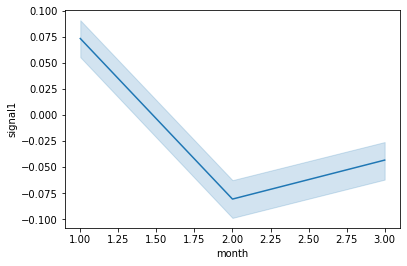

In [56]:
 sns.lineplot(x=data['month'], y=data['signal1'])

# joint plots

In [54]:
data.groupby('hour').count()  #2-8pm is the bueist time to ask for an RFQ

,request_time,cusip,quantity_bonds,liq_score,mat_bucket,industrySector,ticker,move_1D,move_3D,signal1,...,rqdatetime,rfqdate,signal1dailyavg,signal2dailyavg,signal3dailyavg,year,month,day,minute,month_day
hour,,,,,,,,,,,,,,,,,,,,,
8,1,1,1,1,1,1,1,1,1,1,...,1,1,1,1,1,1,1,1,1,1
11,8,8,8,8,8,8,8,8,8,8,...,8,8,8,8,8,8,8,8,8,8
12,195,195,195,195,195,195,195,195,195,195,...,195,195,195,195,195,195,195,195,195,195
13,584,584,584,584,584,584,584,584,584,584,...,584,584,584,584,584,584,584,584,584,584
14,1169,1169,1169,1169,1169,1169,1169,1169,1169,1169,...,1169,1169,1169,1169,1169,1169,1169,1169,1169,1169
15,1682,1682,1682,1682,1682,1682,1682,1682,1682,1682,...,1682,1682,1682,1682,1682,1682,1682,1682,1682,1682
16,1648,1648,1648,1648,1648,1648,1648,1648,1648,1648,...,1648,1648,1648,1648,1648,1648,1648,1648,1648,1648
17,1435,1435,1435,1435,1435,1435,1435,1435,1435,1435,...,1435,1435,1435,1435,1435,1435,1435,1435,1435,1435
18,1653,1653,1653,1653,1653,1653,1653,1653,1653,1653,...,1653,1653,1653,1653,1653,1653,1653,1653,1653,1653


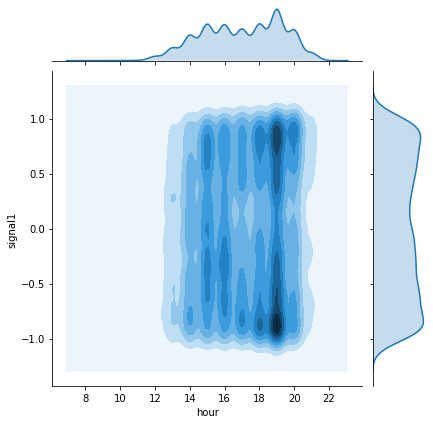

In [155]:
sns.jointplot(x=data['hour'], y= data['signal1'], kind ='kde') #7:00pm is the busiest rfq hour, most dense at hour 19

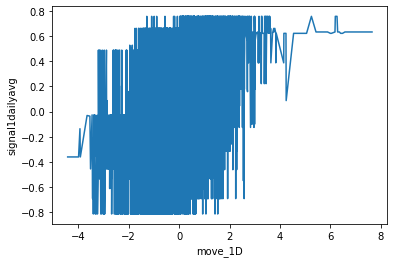

In [159]:
 sns.lineplot(x=data['move_1D'], y=data['signal1dailyavg'])

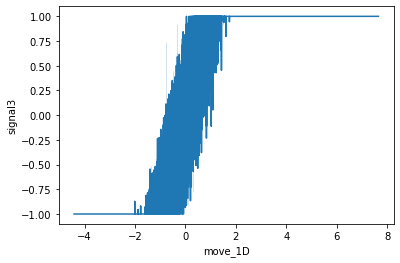

In [55]:
 sns.lineplot(x=data['move_1D'], y=data['signal3']) #showcasing relationship below

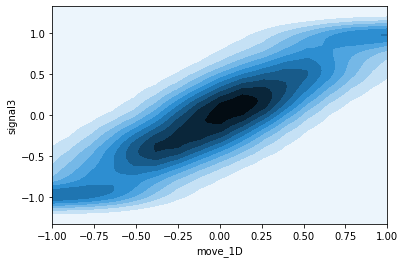

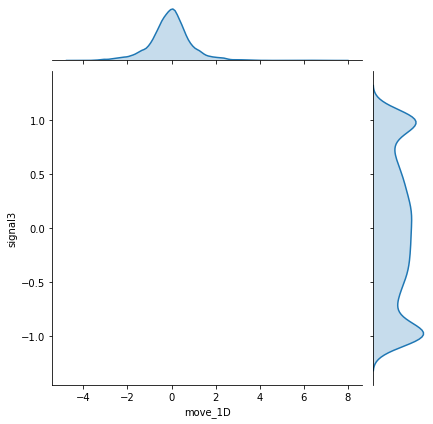

In [174]:
fig, ax = plt.subplots()
sns.jointplot(x=data['move_1D'], y= data['signal3'], kind ='kde', ax=ax)
ax.set_xlim(-1,1)
ax.set_ylabel('signal3')
ax.set_xlabel('move_1D')
plt.show()

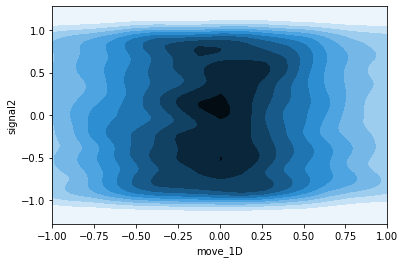

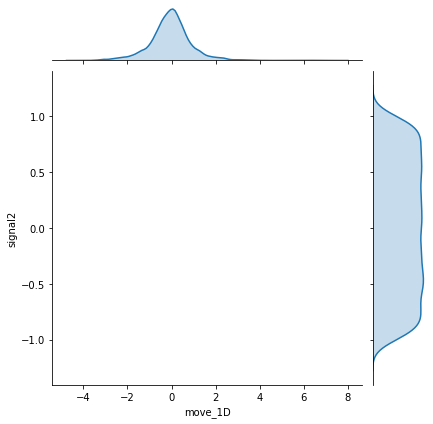

In [180]:
fig, ax = plt.subplots()
sns.jointplot(x=data['move_1D'], y= data['signal2'], kind ='kde', ax=ax)
ax.set_xlim(-1,1)
ax.set_ylabel('signal2')
ax.set_xlabel('move_1D')
plt.show()

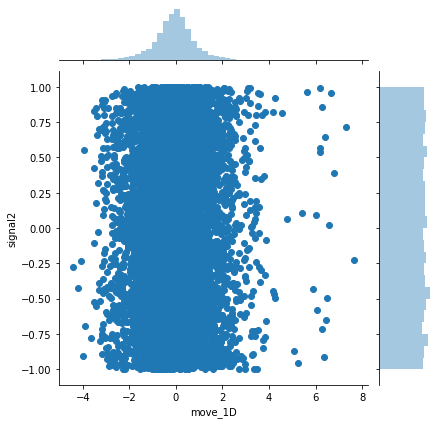

In [62]:
sns.jointplot(x=data['move_1D'], y= data['signal2'])
ax.set_xlim(-1,1)
ax.set_ylabel('signal2')
ax.set_xlabel('move_1D')
plt.show() #another way of looking at graph above, scatter plot instead of heat/density map

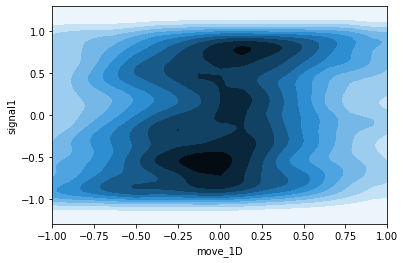

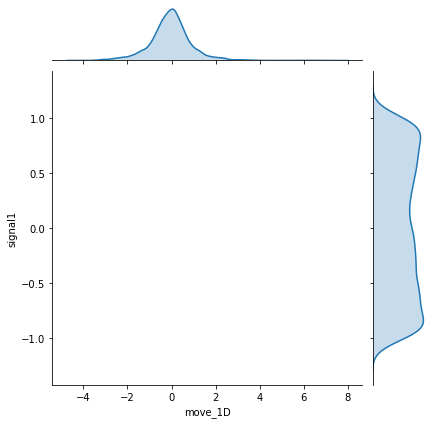

In [181]:
fig, ax = plt.subplots()
sns.jointplot(x=data['move_1D'], y= data['signal1'], kind ='kde', ax=ax)
ax.set_xlim(-1,1)
ax.set_ylabel('signal1')
ax.set_xlabel('move_1D')
plt.show()

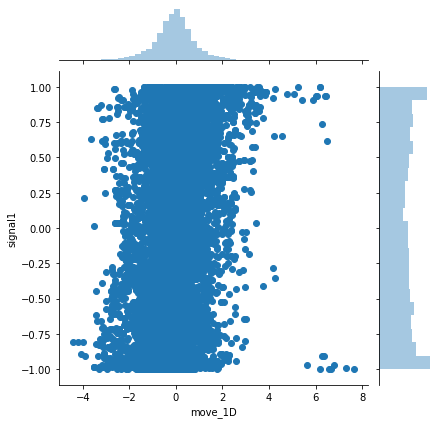

In [61]:
sns.jointplot(x=data['move_1D'], y= data['signal1'])
ax.set_xlim(-1,1)
ax.set_ylabel('signal1')
ax.set_xlabel('move_1D')
plt.show()

In [62]:
data.describe()

,quantity_bonds,liq_score,move_1D,move_3D,signal1,signal2,signal3,cparty_id,signal1dailyavg
count,12499.000000,12499.000000,12499.000000,12499.000000,12499.000000,12499.000000,12499.000000,12499.000000,12499.000000
mean,349.818545,905.487399,-0.042568,-0.107500,-0.016910,-0.001591,-0.035930,105.931995,-0.016910
std,518.562719,824.095690,0.979999,1.875060,0.619511,0.575759,0.666160,81.006842,0.378158
min,1.000000,3.000000,-4.418720,-8.926451,-1.000000,-0.999964,-1.000000,0.000000,-0.813733
25%,20.000000,182.000000,-0.531227,-1.012344,-0.576923,-0.495285,-0.596170,0.000000,-0.307739
50%,100.000000,719.000000,-0.037750,-0.085350,-0.041667,-0.001055,-0.045061,120.000000,-0.028962
75%,500.000000,1394.000000,0.438625,0.811188,0.550491,0.498869,0.499475,144.000000,0.221843
max,3000.000000,3000.000000,7.652850,9.688825,1.000000,0.999975,1.000000,372.000000,0.756983


In [63]:
#plt.scatter(data['request_time'], data['signal1'])

In [150]:
#sns.distplot(data.signal1, kde=True, color="g")

In [65]:
 #sns.lineplot(x=data.request_time, y=data.signal1)

# looking at when the move_1D is >1 or <1

In [68]:
data[(data['move_1D'] > 0)]

,request_time,cusip,quantity_bonds,liq_score,mat_bucket,industrySector,ticker,move_1D,move_3D,signal1,...,rfqdate,signal1dailyavg,signal2dailyavg,signal3dailyavg,year,month,day,hour,minute,month_day
0,1/4/2021 8:32,594918BY9,3000,170,B05,Technology,MSFT,0.139226,-1.705008,0.000000,...,2021-01-04,0.387550,0.079645,0.513054,2021,1,04,8,32,1-04
1,1/4/2021 12:58,37331NAK7,50,558,B10,Basic Materials,GP,0.169077,0.622054,0.790123,...,2021-01-04,0.387550,0.079645,0.513054,2021,1,04,12,58,1-04
2,1/4/2021 12:58,37331NAK7,50,558,B10,Basic Materials,GP,0.169077,0.622054,0.790123,...,2021-01-04,0.387550,0.079645,0.513054,2021,1,04,12,58,1-04
4,1/4/2021 13:14,594918BY9,80,170,B05,Technology,MSFT,0.190731,-1.134894,-0.708861,...,2021-01-04,0.387550,0.079645,0.513054,2021,1,04,13,14,1-04
5,1/4/2021 13:41,260543DD2,100,71,B30,Basic Materials,DOW,2.591040,1.853324,-0.430464,...,2021-01-04,0.387550,0.079645,0.513054,2021,1,04,13,41,1-04
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
12493,4/1/2021 19:38,126650CX6,2,13,B10,Consumer Non-cyclical,CVS,1.419900,3.291750,-0.618182,...,2021-04-01,-0.550131,-0.013671,-0.134084,2021,3,01,19,38,4-01
12494,4/1/2021 19:39,031162CR9,1340,47,B30,Consumer Non-cyclical,AMGN,0.232550,1.455575,0.238095,...,2021-04-01,-0.550131,-0.013671,-0.134084,2021,3,01,19,39,4-01
12495,4/1/2021 19:39,126650CX6,118,13,B10,Consumer Non-cyclical,CVS,1.419900,3.291750,-0.618182,...,2021-04-01,-0.550131,-0.013671,-0.134084,2021,3,01,19,39,4-01
12496,4/1/2021 19:49,260543DD2,10,49,B30,Basic Materials,DOW,0.314750,2.243250,-0.777778,...,2021-04-01,-0.550131,-0.013671,-0.134084,2021,3,01,19,49,4-01


In [75]:
data[(data['move_1D'] < 0)]

,request_time,cusip,quantity_bonds,liq_score,mat_bucket,industrySector,ticker,move_1D,move_3D,signal1,...,rfqdate,signal1dailyavg,signal2dailyavg,signal3dailyavg,year,month,day,hour,minute,month_day
3,1/4/2021 13:07,500255AU8,50,347,B05,Consumer Cyclical,KSS,-1.917058,-2.578685,0.085106,...,2021-01-04,0.387550,0.079645,0.513054,2021,1,04,13,7,1-04
6,1/4/2021 13:52,46625HJH4,300,548,B02,Financial,JPM,-0.220722,-0.515511,0.250000,...,2021-01-04,0.387550,0.079645,0.513054,2021,1,04,13,52,1-04
7,1/4/2021 13:52,46625HJH4,300,548,B02,Financial,JPM,-0.220722,-0.515511,0.250000,...,2021-01-04,0.387550,0.079645,0.513054,2021,1,04,13,52,1-04
12,1/4/2021 14:08,05531FBH5,16,2515,B03,Financial,TFC,-0.090260,-1.249386,0.516908,...,2021-01-04,0.387550,0.079645,0.513054,2021,1,04,14,8,1-04
14,1/4/2021 14:08,05531FBH5,16,2515,B03,Financial,TFC,-0.090260,-1.249386,0.516908,...,2021-01-04,0.387550,0.079645,0.513054,2021,1,04,14,8,1-04
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
12483,4/1/2021 18:58,05531FBH5,25,1676,B03,Financial,TFC,-0.852348,-1.446599,-0.501742,...,2021-04-01,-0.550131,-0.013671,-0.134084,2021,3,01,18,58,4-01
12485,4/1/2021 19:03,61746BDJ2,18,417,B02,Financial,MS,-1.556978,-2.036486,-0.962825,...,2021-04-01,-0.550131,-0.013671,-0.134084,2021,3,01,19,3,4-01
12490,4/1/2021 19:19,594918BY9,5,156,B05,Technology,MSFT,-0.109675,-0.012402,-0.358650,...,2021-04-01,-0.550131,-0.013671,-0.134084,2021,3,01,19,19,4-01
12492,4/1/2021 19:33,61746BDJ2,9,417,B02,Financial,MS,-1.314145,-1.992645,-0.962825,...,2021-04-01,-0.550131,-0.013671,-0.134084,2021,3,01,19,33,4-01


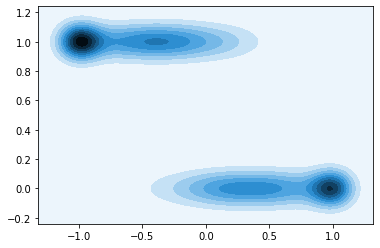

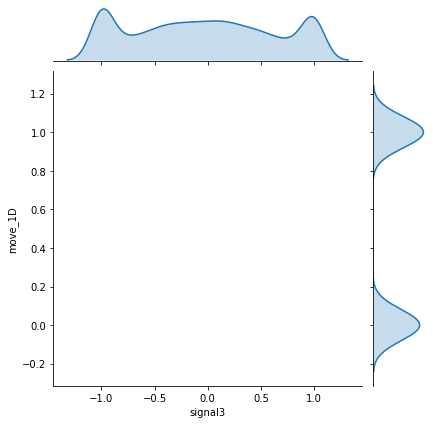

In [90]:
fig, ax = plt.subplots()
sns.jointplot(x= data['signal3'], y=(data['move_1D'] < 0), kind ='kde', ax=ax)
#DON'T KNOW IF THIS SHOWS ANYTHING as move_1D is supposd to be less than 0

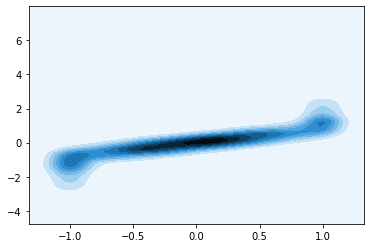

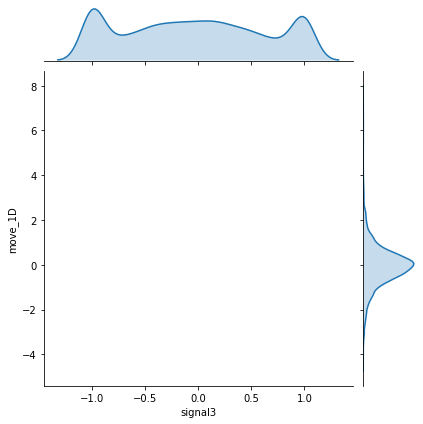

In [93]:
fig, ax = plt.subplots()
sns.jointplot(x=data['signal3'], y=(data['move_1D']), kind ='kde', ax=ax)

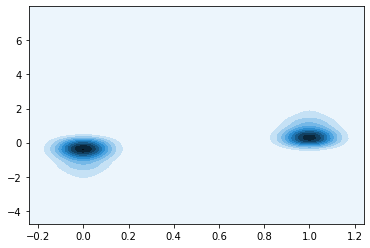

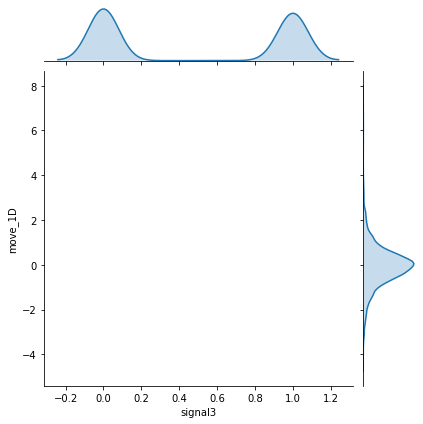

In [92]:
fig, ax = plt.subplots()
sns.jointplot(x= (data['signal3']>0), y=(data['move_1D']), kind ='kde', ax=ax)

In [271]:
data[(data['move_1D'] < 1) & (data['move_1D'] > -1)]

,request_time,cusip,quantity_bonds,liq_score,mat_bucket,industrySector,ticker,move_1D,move_3D,signal1,...,month,year,day,hour,minute,month_day,signal2dailyavg,signal3dailyavg,move1Ddailyavg,move3Ddailyavg
0,1/4/21 8:32 AM,594918BY9,3000,170,B05,Technology,MSFT,0.139226,-1.705008,0.000000,...,1,2021,04,8,32,1-04,0.079645,0.513054,0.906754,-0.052968
1,1/4/21 12:58 PM,37331NAK7,50,558,B10,Basic Materials,GP,0.169077,0.622054,0.790123,...,1,2021,04,12,58,1-04,0.079645,0.513054,0.906754,-0.052968
2,1/4/21 12:58 PM,37331NAK7,50,558,B10,Basic Materials,GP,0.169077,0.622054,0.790123,...,1,2021,04,12,58,1-04,0.079645,0.513054,0.906754,-0.052968
4,1/4/21 1:14 PM,594918BY9,80,170,B05,Technology,MSFT,0.190731,-1.134894,-0.708861,...,1,2021,04,13,14,1-04,0.079645,0.513054,0.906754,-0.052968
6,1/4/21 1:52 PM,46625HJH4,300,548,B02,Financial,JPM,-0.220722,-0.515511,0.250000,...,1,2021,04,13,52,1-04,0.079645,0.513054,0.906754,-0.052968
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
12490,4/1/21 7:19 PM,594918BY9,5,156,B05,Technology,MSFT,-0.109675,-0.012402,-0.358650,...,4,2021,01,19,19,4-01,-0.013671,-0.134084,-0.184403,0.407363
12494,4/1/21 7:39 PM,031162CR9,1340,47,B30,Consumer Non-cyclical,AMGN,0.232550,1.455575,0.238095,...,4,2021,01,19,39,4-01,-0.013671,-0.134084,-0.184403,0.407363
12496,4/1/21 7:49 PM,260543DD2,10,49,B30,Basic Materials,DOW,0.314750,2.243250,-0.777778,...,4,2021,01,19,49,4-01,-0.013671,-0.134084,-0.184403,0.407363
12497,4/1/21 8:36 PM,378272AY4,130,181,B10,Basic Materials,GLENLN,0.071282,0.770356,-0.996364,...,4,2021,01,20,36,4-01,-0.013671,-0.134084,-0.184403,0.407363


In [76]:
posmove_1D=data[(data['move_1D'] > 0)]

In [77]:
possignal1= data[(data['signal1'] > 0)]

In [83]:
sns.lineplot(x=posmove_1D, y=possignal1) #i want to somehow see when signal one is poitive is move_1D pos too?

In [194]:
data.groupby(['move_1D'])['signal1'].transform('mean')

0        0.000000
1        0.790123
2        0.790123
3        0.085106
4       -0.708861
           ...   
12494    0.238095
12495   -0.618182
12496   -0.777778
12497   -0.996364
12498   -0.923875
Name: signal1, Length: 12499, dtype: float64

# correlations

In [101]:
data.corr()

,quantity_bonds,liq_score,move_1D,move_3D,signal1,signal2,signal3,cparty_id,signal1dailyavg,signal2dailyavg,signal3dailyavg,year,month,hour,minute,bondlength
quantity_bonds,1.000000,-0.008980,-0.008773,-0.006839,-0.002547,0.019368,-0.000418,-0.107733,0.011172,-0.006292,0.010490,NaN,0.036166,-0.048045,-0.017721,0.164093
liq_score,-0.008980,1.000000,0.038583,0.070908,0.003921,-0.004713,0.043908,-0.006321,-0.029454,-0.032644,-0.012879,NaN,0.025743,-0.019796,0.000966,-0.219010
move_1D,-0.008773,0.038583,1.000000,0.632001,0.251032,0.010462,0.838313,-0.018254,0.355403,0.077414,0.610014,NaN,-0.037000,0.033398,-0.009793,-0.086678
move_3D,-0.006839,0.070908,0.632001,1.000000,0.125685,-0.002943,0.536652,0.018053,0.212728,0.038298,0.491533,NaN,-0.028875,0.071109,0.009454,-0.115108
signal1,-0.002547,0.003921,0.251032,0.125685,1.000000,0.005255,0.223244,-0.036731,0.610413,0.089003,0.330171,NaN,-0.074694,0.045550,-0.014567,-0.058467
signal2,0.019368,-0.004713,0.010462,-0.002943,0.005255,1.000000,0.008928,-0.002650,0.009113,0.062502,0.007420,NaN,-0.011116,0.006261,0.006958,0.003192
signal3,-0.000418,0.043908,0.838313,0.536652,0.223244,0.008928,1.000000,-0.026358,0.304599,0.066852,0.563135,NaN,-0.037381,0.022920,-0.008418,-0.075809
cparty_id,-0.107733,-0.006321,-0.018254,0.018053,-0.036731,-0.002650,-0.026358,1.000000,-0.061936,-0.048734,-0.055058,NaN,0.079748,0.063614,-0.021502,-0.133979
signal1dailyavg,0.011172,-0.029454,0.355403,0.212728,0.610413,0.009113,0.304599,-0.061936,1.000000,0.145807,0.540898,NaN,-0.122367,0.050217,-0.002929,-0.013661
signal2dailyavg,-0.006292,-0.032644,0.077414,0.038298,0.089003,0.062502,0.066852,-0.048734,0.145807,1.000000,0.118714,NaN,-0.177858,0.038690,-0.009052,-0.027759


In [102]:
data['move_1D'].corr(data['signal3'])

0.838312881593288

### looking for correlations between categorical variables

In [136]:
# Cross tabulation between industrySector and ticker
CrosstabResult=pd.crosstab(index=data['industrySector'],columns=data['ticker'])
print(CrosstabResult)
 
# importing the required function
from scipy.stats import chi2_contingency
 
# Performing Chi-sq test
ChiSqResult = chi2_contingency(CrosstabResult)
 
# P-Value is the Probability of H0 being True
# If P-Value&gt;0.05 then only we Accept the assumption(H0)
 
print('The P-Value of the ChiSq Test is:', ChiSqResult[1])
#0-0.5 = variables related; greater than 0.05 = not correlated, did for dun as knew these would be correlated

ticker                 AIG  AMGN   BA  BAYNGR   BK  BNSF  CAG  CAT  COST  CSX  \
industrySector                                                                  
Basic Materials          0     0    0       0    0     0    0    0     0    0   
Consumer Cyclical        0     0    0       0    0     0    0    0   485    0   
Consumer Non-cyclical    0   396    0      51    0     0  289    0     0    0   
Energy                   0     0    0       0    0     0    0    0     0    0   
Financial               35     0    0       0  354     0    0    0     0    0   
Industrial               0     0  329       0    0    16    0   39     0  219   
Technology               0     0    0       0    0     0    0    0     0    0   
Utilities                0     0    0       0    0     0    0    0     0    0   

ticker                 ...   RY  SRC  TFC  TSN  UDR  VLO  VMW  VST  WMB  XEL  
industrySector         ...                                                    
Basic Materials        ...    0

In [138]:
# Cross tabulation between industrySector and mat_bucket
CrosstabResult=pd.crosstab(index=data['industrySector'],columns=data['mat_bucket'])
print(CrosstabResult)
 
# importing the required function
from scipy.stats import chi2_contingency
 
# Performing Chi-sq test
ChiSqResult = chi2_contingency(CrosstabResult)
 
# P-Value is the Probability of H0 being True
# If P-Value>0.05 then only we Accept the assumption(H0)
 
print('The P-Value of the ChiSq Test is:', ChiSqResult[1])
#0-0.5 = variables related; greater than 0.05 = not correlated

mat_bucket              B02  B03   B05   B10   B30
industrySector                                    
Basic Materials          14    0     0   237   276
Consumer Cyclical       154  231   242   485     0
Consumer Non-cyclical   121   51   498  1951  1720
Energy                  346    0     0     0     0
Financial              1895  377     0   170     0
Industrial              226    0   336   678   231
Technology               73  102  1299   145     0
Utilities                 0    0   296    18   327
The P-Value of the ChiSq Test is: 0.0


# change maturity bond to number only

In [60]:
data['bondlength'] = data.mat_bucket.str.strip("B")

In [61]:
data['bondlength']=data.bondlength.astype(int)

In [62]:
data[['bondlength','month_day','signal1','signal2','signal3','move_1D','move_3D']]

,bondlength,month_day,signal1,signal2,signal3,move_1D,move_3D
0,5,1-04,0.000000,-0.255871,1.000000,0.139226,-1.705008
1,10,1-04,0.790123,0.842762,-0.208001,0.169077,0.622054
2,10,1-04,0.790123,0.820288,-0.469933,0.169077,0.622054
3,5,1-04,0.085106,0.506236,-1.000000,-1.917058,-2.578685
4,5,1-04,-0.708861,-0.751947,-0.260192,0.190731,-1.134894
...,...,...,...,...,...,...,...
12494,30,4-01,0.238095,-0.961889,-0.247929,0.232550,1.455575
12495,10,4-01,-0.618182,0.641902,1.000000,1.419900,3.291750
12496,30,4-01,-0.777778,0.875334,0.091794,0.314750,2.243250
12497,10,4-01,-0.996364,0.658985,0.541421,0.071282,0.770356


### looking at graphs with bondlength to find any correlations

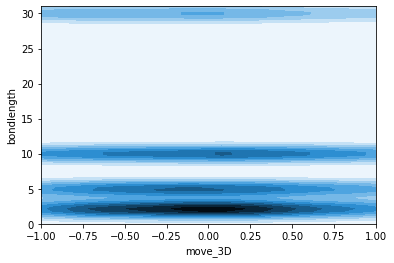

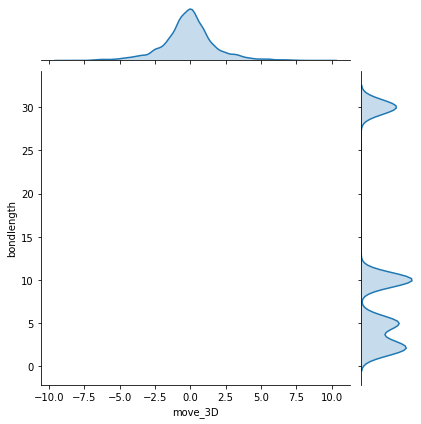

In [99]:
fig, ax = plt.subplots()
sns.jointplot(x=data['move_3D'], y= data['bondlength'], kind ='kde', ax=ax)
ax.set_xlim(-1,1)
ax.set_ylim(0,31)
ax.set_ylabel('bondlength')
ax.set_xlabel('move_3D')
plt.show() #did with signal1 and signal2 and these mean nothing, no relationship 

In [183]:
data.bondlength.unique()

array([ 5, 10, 30,  2,  3], dtype=int64)

In [195]:
data.groupby('bondlength').count()

,request_time,cusip,quantity_bonds,liq_score,mat_bucket,industrySector,ticker,move_1D,move_3D,signal1,...,rfqdate,signal1dailyavg,signal2dailyavg,signal3dailyavg,year,month,day,hour,minute,month_day
bondlength,,,,,,,,,,,,,,,,,,,,,
2,2829,2829,2829,2829,2829,2829,2829,2829,2829,2829,...,2829,2829,2829,2829,2829,2829,2829,2829,2829,2829
3,761,761,761,761,761,761,761,761,761,761,...,761,761,761,761,761,761,761,761,761,761
5,2671,2671,2671,2671,2671,2671,2671,2671,2671,2671,...,2671,2671,2671,2671,2671,2671,2671,2671,2671,2671
10,3684,3684,3684,3684,3684,3684,3684,3684,3684,3684,...,3684,3684,3684,3684,3684,3684,3684,3684,3684,3684
30,2554,2554,2554,2554,2554,2554,2554,2554,2554,2554,...,2554,2554,2554,2554,2554,2554,2554,2554,2554,2554


## looking at each bondlength compared to signal3 

In [340]:
bondlength= [2,3,5,10,30]
for bond in bondlength:
    print(bond, data[data['bondlength']== bond]['move_1D'].corr(data[data['bondlength']== bond]['signal3']))

2 0.7517171236656588
3 0.8014770694751802
5 0.8561985882902724
10 0.8473424637196804
30 0.8810715076031818


In [278]:
X = data[data['bondlength']== 30]['signal3']
Y = data[data['bondlength']== 30]['move_1D']

X = sm.add_constant(X)

model30 = sm.OLS(Y, X).fit()
predictions30 = model30.predict(X) 

print_model30 = model30.summary()
print(print_model30) #the variation of move_1D is explained 70.3% of the time by signal3

                            OLS Regression Results                            
Dep. Variable:                move_1D   R-squared:                       0.776
Model:                            OLS   Adj. R-squared:                  0.776
Method:                 Least Squares   F-statistic:                     8855.
Date:                Fri, 24 Jun 2022   Prob (F-statistic):               0.00
Time:                        11:59:02   Log-Likelihood:                -2146.6
No. Observations:                2554   AIC:                             4297.
Df Residuals:                    2552   BIC:                             4309.
Df Model:                           1                                         
Covariance Type:            nonrobust                                         
                 coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------
const         -0.0170      0.011     -1.507      0.1

C:\ProgramData\Anaconda3\lib\site-packages\numpy\core\fromnumeric.py:2389: FutureWarning: Method .ptp is deprecated and will be removed in a future version. Use numpy.ptp instead.
  return ptp(axis=axis, out=out, **kwargs)


In [280]:
np.sqrt(model30.resid_mse)

AttributeError: 'OLSResults' object has no attribute 'resid_mse'

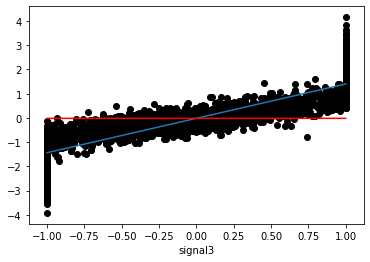

In [299]:
sns.lineplot(x=data[data['bondlength']== 30]['signal3'], y=predictions30)
sns.lineplot(x=data[data['bondlength']== 30]['signal3'], y=-0.0170, color = 'red')
plt.scatter(data[data['bondlength']== 30]['signal3'], data[data['bondlength']== 30]['move_1D'], color = 'black')

In [ ]:
#looking at LinReg of best bondlength=30 compared to worst=2 for signal3

In [300]:
X = data[data['bondlength']== 2]['signal3']
Y = data[data['bondlength']== 2]['move_1D']

X = sm.add_constant(X)

modelB2 = sm.OLS(Y, X).fit()
predictionsB2 = modelB2.predict(X) 

print_modelB2 = modelB2.summary()
print(print_modelB2) #the variation of move_1D is explained 70.3% of the time by signal3

                            OLS Regression Results                            
Dep. Variable:                move_1D   R-squared:                       0.565
Model:                            OLS   Adj. R-squared:                  0.565
Method:                 Least Squares   F-statistic:                     3673.
Date:                Thu, 23 Jun 2022   Prob (F-statistic):               0.00
Time:                        14:46:09   Log-Likelihood:                -2059.1
No. Observations:                2829   AIC:                             4122.
Df Residuals:                    2827   BIC:                             4134.
Df Model:                           1                                         
Covariance Type:            nonrobust                                         
                 coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------
const          0.0315      0.009      3.344      0.0

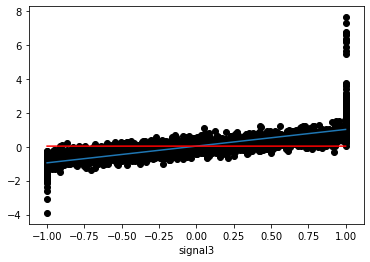

In [302]:
sns.lineplot(x=data[data['bondlength']== 2]['signal3'], y=predictionsB2)
sns.lineplot(x=data[data['bondlength']== 2]['signal3'], y=.0315, color = 'red')
plt.scatter(data[data['bondlength']== 2]['signal3'], data[data['bondlength']== 2]['move_1D'], color = 'black')

## looking at each bondlength compared to signal1 

In [341]:
bondlength= [2,3,5,10,30]
for bond in bondlength:
    print(bond, data[data['bondlength']== bond]['move_1D'].corr(data[data['bondlength']== bond]['signal1']))

2 0.06582845600555516
3 0.33196119522115936
5 0.1008172446906718
10 0.3061990466212708
30 0.39556737109428347


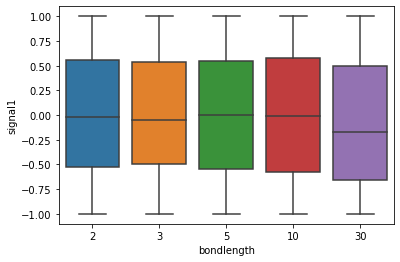

In [192]:
sns.boxplot(x=data['bondlength'], y=data['signal1'])

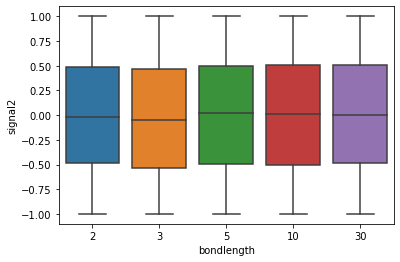

In [193]:
sns.boxplot(x=data['bondlength'], y=data['signal2'])

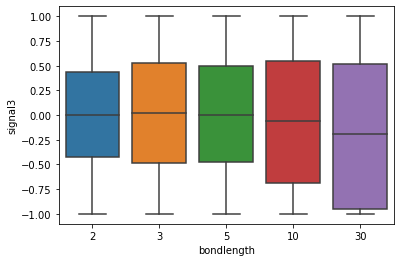

In [194]:
sns.boxplot(x=data['bondlength'], y=data['signal3'])

see below with the following two graphs but i do not think bondlength has anything to do with how they move after 1 and 3 days. seem like the same graphs

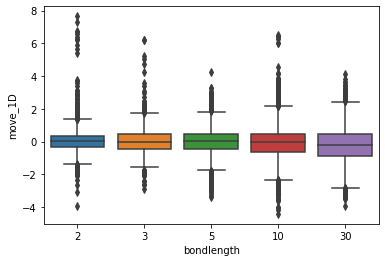

In [195]:
sns.boxplot(x=data['bondlength'], y=data['move_1D'])

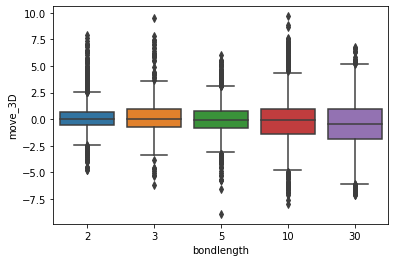

In [206]:
sns.boxplot(x=data['bondlength'], y=data['move_3D'])

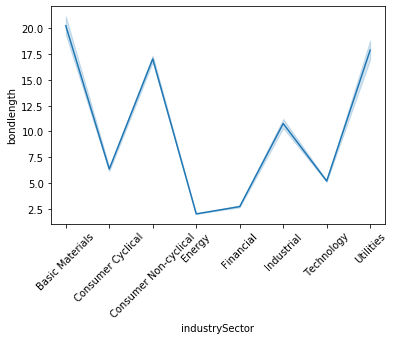

In [352]:
 sns.lineplot(x=data['industrySector'], y=data['bondlength']) #does the bond maturity have anything to do with the sector??
plt.tick_params(axis='x', which='major', labelsize=10, rotation=45)

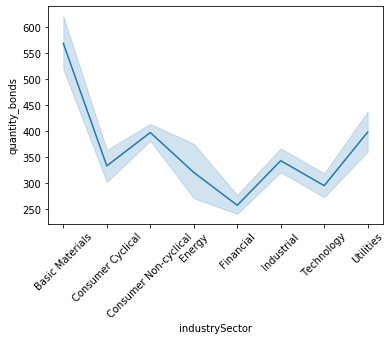

In [58]:
sns.lineplot(x=data['industrySector'], y=data['quantity_bonds']) #does the bond maturity have anything to do with the sector??
plt.tick_params(axis='x', which='major', labelsize=10, rotation=45)

# look at quantity of bonds

In [347]:
data.quantity_bonds.sort_values().unique()

array([   1,    2,    3, ..., 2987, 2999, 3000], dtype=int64)

In [230]:
 #sns.boxplot(x=data['month_day'], y=data['quantity_bonds']) #does quantity have anything to do with time of time? signal?

In [208]:
data.groupby('quantity_bonds').count()

,request_time,cusip,liq_score,mat_bucket,industrySector,ticker,move_1D,move_3D,signal1,signal2,...,signal3dailyavg,year,month,day,hour,minute,move1Ddailyavg,move3Ddailyavg,month_day,bondlength
quantity_bonds,,,,,,,,,,,,,,,,,,,,,
1,83,83,83,83,83,83,83,83,83,83,...,83,83,83,83,83,83,83,83,83,83
2,324,324,324,324,324,324,324,324,324,324,...,324,324,324,324,324,324,324,324,324,324
3,257,257,257,257,257,257,257,257,257,257,...,257,257,257,257,257,257,257,257,257,257
4,206,206,206,206,206,206,206,206,206,206,...,206,206,206,206,206,206,206,206,206,206
5,484,484,484,484,484,484,484,484,484,484,...,484,484,484,484,484,484,484,484,484,484
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2962,1,1,1,1,1,1,1,1,1,1,...,1,1,1,1,1,1,1,1,1,1
2975,6,6,6,6,6,6,6,6,6,6,...,6,6,6,6,6,6,6,6,6,6
2987,1,1,1,1,1,1,1,1,1,1,...,1,1,1,1,1,1,1,1,1,1


### binning as the dist is right skewed

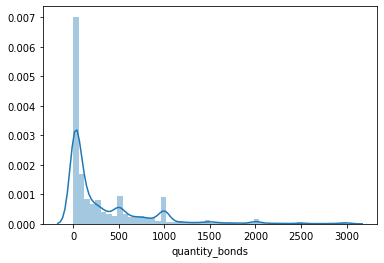

In [255]:
sns.distplot(data['quantity_bonds'])

In [61]:
bins = [-250, 250, 750, 1250,3000]
data['binned_quantity'] = pd.cut(data['quantity_bonds'], bins, labels = [1,2,3,4])
print (data)
data.head()

         request_time      cusip  quantity_bonds  liq_score mat_bucket  \
0       1/4/2021 8:32  594918BY9            3000        170        B05   
1      1/4/2021 12:58  37331NAK7              50        558        B10   
2      1/4/2021 12:58  37331NAK7              50        558        B10   
3      1/4/2021 13:07  500255AU8              50        347        B05   
4      1/4/2021 13:14  594918BY9              80        170        B05   
...               ...        ...             ...        ...        ...   
12494  4/1/2021 19:39  031162CR9            1340         47        B30   
12495  4/1/2021 19:39  126650CX6             118         13        B10   
12496  4/1/2021 19:49  260543DD2              10         49        B30   
12497  4/1/2021 20:36  378272AY4             130        181        B10   
12498  4/1/2021 20:51  05531FBH5             160       1676        B03   

              industrySector  ticker   move_1D   move_3D   signal1  ...  \
0                 Technology    MSFT

,request_time,cusip,quantity_bonds,liq_score,mat_bucket,industrySector,ticker,move_1D,move_3D,signal1,...,signal2dailyavg,signal3dailyavg,year,month,day,hour,minute,month_day,bondlength,binned_quantity
0,1/4/2021 8:32,594918BY9,3000,170,B05,Technology,MSFT,0.139226,-1.705008,0.000000,...,0.079645,0.513054,2021,1,04,8,32,1-04,5,4
1,1/4/2021 12:58,37331NAK7,50,558,B10,Basic Materials,GP,0.169077,0.622054,0.790123,...,0.079645,0.513054,2021,1,04,12,58,1-04,10,1
2,1/4/2021 12:58,37331NAK7,50,558,B10,Basic Materials,GP,0.169077,0.622054,0.790123,...,0.079645,0.513054,2021,1,04,12,58,1-04,10,1
3,1/4/2021 13:07,500255AU8,50,347,B05,Consumer Cyclical,KSS,-1.917058,-2.578685,0.085106,...,0.079645,0.513054,2021,1,04,13,7,1-04,5,1
4,1/4/2021 13:14,594918BY9,80,170,B05,Technology,MSFT,0.190731,-1.134894,-0.708861,...,0.079645,0.513054,2021,1,04,13,14,1-04,5,1


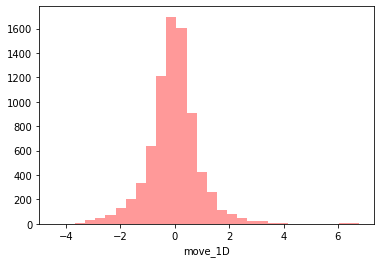

In [47]:
sns.distplot(data[(data['binned_quantity'] == 1)]['move_1D'], kde = False, color ='red', bins = 30) 

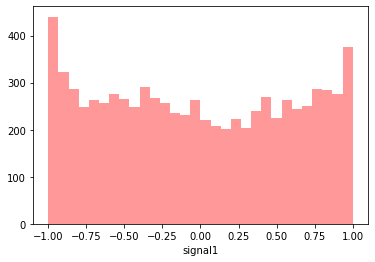

In [48]:
sns.distplot(data[(data['binned_quantity'] == 1)]['signal1'], kde = False, color ='red', bins = 30) 

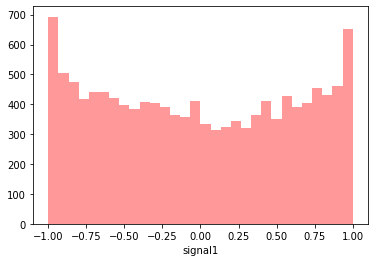

In [52]:
sns.distplot(data['signal1'], kde = False, color ='red', bins = 30) 

In [258]:
data['move_1D'].corr(data['binned_quantity']==1)

0.005998264562297492

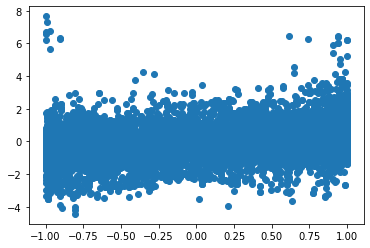

In [67]:
plt.scatter(data['signal1'],data['move_1D'])

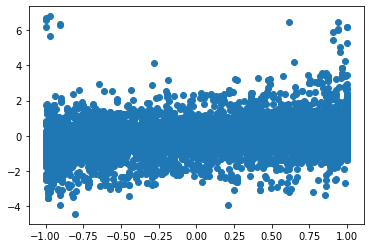

In [66]:
plt.scatter(data[(data['binned_quantity'] == 1)]['signal1'],data[(data['binned_quantity'] == 1)]['move_1D'])

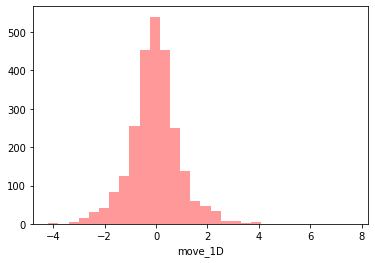

In [262]:
sns.distplot(data[(data['binned_quantity'] == 2)]['move_1D'], kde = False, color ='red', bins = 30) 

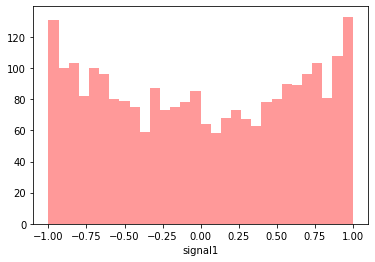

In [53]:
sns.distplot(data[(data['binned_quantity'] == 2)]['signal1'], kde = False, color ='red', bins = 30) 

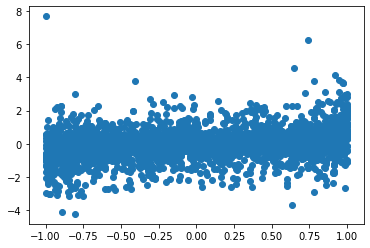

In [65]:
plt.scatter(data[(data['binned_quantity'] == 2)]['signal1'],data[(data['binned_quantity'] == 2)]['move_1D'])

In [350]:
binned_quantity= [1,2,3,4] #1=(-250,250) 2=(250,750) 3=(750,1250) 4=(1250,3000)
for q in binned_quantity:
    print(q, data[data['binned_quantity']== q]['move_1D'].corr(data[data['binned_quantity']== q]['signal3']))

1 0.8309147614701244
2 0.8475256156645352
3 0.8507649083515746
4 0.858997778853357


In [349]:
binned_quantity= [1,2,3,4] #1=(-250,250) 2=(250,750) 3=(750,1250) 4=(1250,3000)
for q in binned_quantity:
    print(q, data[data['binned_quantity']== q]['move_1D'].corr(data[data['binned_quantity']== q]['signal1']))

1 0.22701751818988805
2 0.25656096914489745
3 0.3169561353605172
4 0.34015256134730026


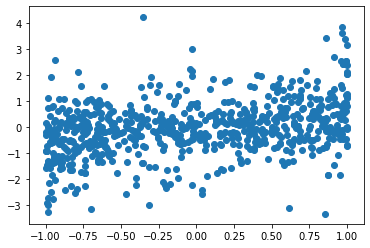

In [166]:
plt.scatter(data[(data['binned_quantity'] == 4)]['signal1'],data[(data['binned_quantity'] == 4)]['move_1D'])

# 	looking at ticker

In [110]:
data.ticker.unique()

array(['MSFT', 'GP', 'KSS', 'DOW', 'JPM', 'COST', 'RY', 'CVS', 'TFC',
       'RSG', 'BA', 'PNC', 'AMGN', 'PCG', 'GM', 'GLENLN', 'MRK', 'PYPL',
       'MS', 'PKI', 'VLO', 'BK', 'LMT', 'CAG', 'VMW', 'HUM', 'NEE',
       'KEYS', 'DE', 'CSX', 'ROP', 'MKL', 'UDR', 'PFE', 'WMB', 'KDP',
       'DXC', 'VST', 'TSN', 'NSC', 'GE', 'DUK', 'BAYNGR', 'SRC', 'KMI',
       'O', 'FBHS', 'QCOM', 'AIG', 'XEL', 'CAT', 'MCO', 'BNSF'],
      dtype=object)

In [111]:
data.groupby('ticker').describe()

quantity_bonds                                                         \
                count        mean         std    min     25%    50%      75%   
ticker                                                                         
AIG              35.0  621.114286  635.072658   25.0  189.50  345.0   935.00   
AMGN            396.0  585.032828  583.024299    3.0  125.00  417.0  1000.00   
BA              329.0  397.677812  521.177027    2.0   40.00  139.0   600.00   
BAYNGR           51.0  904.705882  825.963251   10.0  345.00  622.0  1027.00   
BK              354.0  132.932203  410.305201    1.0    7.00   20.0    75.00   
BNSF             16.0  477.937500  702.267040    5.0   93.75  140.0   542.25   
CAG             289.0  601.961938  622.557239    2.0   95.00  448.0  1000.00   
CAT              39.0  159.923077  208.086696    2.0   22.00   95.0   224.00   
COST            485.0  383.261856  562.673378    2.0   20.00  103.0   551.00   
CSX             219.0  256.625571  485.697566    1.0    8.00   45.0   252.00   
CVS            2044.0  262.566536  465.059498    1.0   10.00   50.0   300.00   
DE              219.0  320.885845  467.394104    2.0   10.50   95.0   500.00   
DOW             276.0  585.916667  651.016964    2.0  100.00  400.0  1000.00   
DUK              67.0  300.910448  329.249640    2.0   90.00  212.0   401.00   
DXC              73.0  448.164384  674.497838    2.0   30.00  185.0   535.00   
FBHS            104.0   87.538462  187.451219    2.0    8.00   10.0    53.00   
GE              101.0  339.623762  444.258728   10.0   40.00  120.0   500.00   
GLENLN          173.0  528.127168  496.803499   15.0  127.00  440.0   736.00   
GM              385.0  343.522078  515.335818    2.0   26.00  100.0   500.00   
GP               78.0  594.243590  582.984645   29.0  225.00  475.0   775.00   
HUM             183.0  750.814208  704.229895    5.0  105.00  500.0  1000.00   
JPM             615.0  203.560976  426.847243    1.0   10.00   30.0   165.00   
KDP             140.0  408.578571  553.915079    5.0   82.75  192.5   500.00   
KEYS             26.0  223.461538  331.494342    4.0   41.25   88.0   290.00   
KMI              58.0  161.965517  295.757189    1.0    9.00   31.5   200.00   
KSS             242.0  216.669421  368.677887    2.0   26.25  100.0   250.00   
LMT             198.0  525.631313  525.918477    2.0  102.00  444.5   798.50   
MCO              41.0  299.000000  420.873437    3.0   54.00  175.0   400.00   
MKL              39.0  186.846154  331.497125   14.0   50.00   50.0   112.50   
MRK             468.0  490.920940  520.904053    4.0   69.25  365.0   700.00   
MS              691.0  169.901592  430.834689    1.0    5.00   15.0    73.00   
MSFT           1106.0  288.704340  462.384252    1.0   15.00   77.0   400.00   
NEE             419.0  381.861575  503.095846    1.0   30.00  175.0   600.00   
NSC               6.0  209.666667  234.978013    3.0   51.25  120.0   312.50   
O                 6.0  628.333333  324.371187  300.0  425.00  500.0   875.00   
PCG              73.0  390.095890  382.915721   40.0  131.00  250.0   426.00   
PFE              80.0  347.937500  613.686729    2.0   14.75   62.5   340.00   
PKI             136.0  659.485294  656.326601    4.0  103.75  500.0  1000.00   
PNC             135.0  579.214815  566.909301    5.0  100.00  500.0   841.50   
PYPL            315.0  322.853968  515.988320    2.0   18.00   75.0   449.00   
QCOM            102.0  251.431373  445.823401    2.0   19.00   93.0   249.75   
ROP             192.0  256.958333  401.913692    3.0   10.75   50.5   412.50   
RSG             214.0  369.051402  419.792976    2.0   50.00  262.5   548.00   
RY              161.0  350.900621  553.634076    4.0   25.00  100.0   500.00   
SRC               2.0   20.000000   22.627417    4.0   12.00   20.0    28.00   
TFC             242.0  302.285124  483.106009    1.0   12.00  100.0   427.75   
TSN             198.0  403.833333  441.366978    2.0   54.00  277.5   629.00   
UDR    

In [112]:
data.groupby(['ticker'])['move_1D'].describe() #looking at the move_1D data for each individual ticker

,count,mean,std,min,25%,50%,75%,max
ticker,,,,,,,,
AIG,35.0,0.274194,0.821906,-1.451421,-0.122484,0.122780,0.355192,3.164213
AMGN,396.0,-0.147286,1.317218,-3.536925,-1.053987,-0.110200,0.665312,3.014975
BA,329.0,-0.209481,1.029275,-4.418720,-0.810524,-0.082619,0.441485,4.156250
BAYNGR,51.0,0.150148,0.838262,-1.232700,-0.371769,-0.025230,0.354825,2.285323
BK,354.0,-0.060845,0.514596,-2.114560,-0.338073,-0.056776,0.204269,1.411591
BNSF,16.0,-0.374144,0.484579,-1.190071,-0.624364,-0.375202,0.102568,0.230148
CAG,289.0,-0.217502,1.057606,-3.423250,-0.787837,-0.309499,0.373750,2.514000
CAT,39.0,-0.555977,0.501093,-1.767370,-0.863259,-0.674900,-0.127587,0.313800
COST,485.0,0.025258,0.830132,-2.761775,-0.501550,0.044750,0.571725,2.025700


In [237]:
data[(data['ticker'] == 'XEL')] 

,request_time,cusip,quantity_bonds,liq_score,mat_bucket,industrySector,ticker,move_1D,move_3D,signal1,...,signal3dailyavg,year,month,day,hour,minute,move1Ddailyavg,move3Ddailyavg,month_day,bondlength
8006,3/3/2021 19:43,845743BU6,1000,2828,B30,Utilities,XEL,0.797014,2.164284,-0.901818,...,0.502769,2021,3,03,19,43,0.666132,3.155690,3-03,30
8069,3/4/2021 14:42,845743BU6,250,2797,B30,Utilities,XEL,0.508287,1.698500,0.853556,...,0.760588,2021,3,04,14,42,1.667653,3.915046,3-04,30
8077,3/4/2021 14:52,845743BU6,500,2797,B30,Utilities,XEL,0.579586,1.757738,0.853556,...,0.760588,2021,3,04,14,52,1.667653,3.915046,3-04,30
8087,3/4/2021 15:05,845743BU6,250,2797,B30,Utilities,XEL,0.284000,2.163275,0.945833,...,0.760588,2021,3,04,15,5,1.667653,3.915046,3-04,30
8354,3/5/2021 16:43,845743BU6,12,2796,B30,Utilities,XEL,1.036335,1.549270,0.402439,...,0.766772,2021,3,05,16,43,1.443490,1.514040,3-05,30
8547,3/8/2021 15:02,845743BU6,463,2772,B30,Utilities,XEL,1.185607,1.389701,0.890295,...,0.643118,2021,3,08,15,2,1.147793,-0.478708,3-08,30
8680,3/8/2021 19:28,845743BU6,25,2772,B30,Utilities,XEL,0.541361,0.337355,0.966805,...,0.643118,2021,3,08,19,28,1.147793,-0.478708,3-08,30
8817,3/9/2021 15:38,845743BU6,879,2761,B30,Utilities,XEL,0.189153,0.038326,0.889344,...,-0.503163,2021,3,09,15,38,-0.751100,-1.493690,3-09,30
8961,3/9/2021 20:32,845743BU6,60,2761,B30,Utilities,XEL,-0.084357,-0.325030,0.902834,...,-0.503163,2021,3,09,20,32,-0.751100,-1.493690,3-09,30
9172,3/10/2021 19:53,845743BU6,150,2863,B30,Utilities,XEL,-0.037575,-0.097279,-0.634241,...,-0.594449,2021,3,10,19,53,-0.880253,-0.435819,3-10,30


### grouping tickers with their sectors and looking at each signal

In [240]:
data.groupby(['ticker'])['industrySector'].describe() #what sector each ticker is

,count,unique,top,freq
ticker,,,,
AIG,35,1,Financial,35
AMGN,396,1,Consumer Non-cyclical,396
BA,329,1,Industrial,329
BAYNGR,51,1,Consumer Non-cyclical,51
BK,354,1,Financial,354
BNSF,16,1,Industrial,16
CAG,289,1,Consumer Non-cyclical,289
CAT,39,1,Industrial,39
COST,485,1,Consumer Cyclical,485


In [271]:
tickersig1df= data.groupby(['ticker','industrySector'])['signal1'].describe() 

In [272]:
tickersig1df

,,count,mean,std,min,25%,50%,75%,max
ticker,industrySector,,,,,,,,
AIG,Financial,35.0,0.105517,0.672757,-0.901818,-0.515199,-0.019305,0.718144,1.000000
AMGN,Consumer Non-cyclical,396.0,-0.104172,0.617429,-1.000000,-0.652928,-0.175586,0.431923,1.000000
BA,Industrial,329.0,-0.087514,0.579536,-0.996785,-0.603175,-0.149007,0.419913,1.000000
BAYNGR,Consumer Non-cyclical,51.0,0.050087,0.648579,-1.000000,-0.569667,-0.052632,0.620301,1.000000
BK,Financial,354.0,-0.106801,0.635075,-1.000000,-0.663105,-0.260504,0.453704,1.000000
BNSF,Industrial,16.0,-0.376339,0.524394,-0.949367,-0.647449,-0.526122,-0.232452,0.666667
CAG,Consumer Non-cyclical,289.0,-0.140449,0.611406,-0.996139,-0.649007,-0.282230,0.440367,1.000000
CAT,Industrial,39.0,-0.514877,0.452947,-0.992424,-0.832650,-0.638462,-0.458214,0.916388
COST,Consumer Cyclical,485.0,0.023055,0.605419,-1.000000,-0.507407,0.081301,0.539683,1.000000


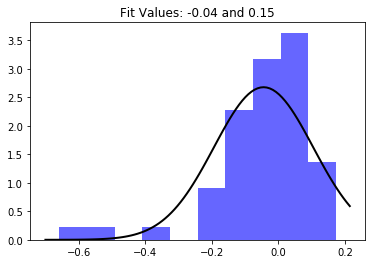

In [273]:
#mu = mean #std = standard deviation
mu, std = norm.fit(tickersig1df['mean'])
plt.hist(tickersig1df['mean'], bins=10, density=True, alpha=0.6, color='b')
xmin, xmax = plt.xlim()
x = np.linspace(xmin, xmax, 100)

p = norm.pdf(x, mu, std)
plt.plot(x, p, 'k', linewidth=2)
title = "Fit Values: {:.2f} and {:.2f}".format(mu, std)
plt.title(title)
  
plt.show() 

In [214]:
#signal2

In [274]:
tickersig2df= data.groupby(['ticker','industrySector'])['signal2'].describe() 

In [275]:
tickersig2df

,,count,mean,std,min,25%,50%,75%,max
ticker,industrySector,,,,,,,,
AIG,Financial,35.0,-0.086186,0.594115,-0.988155,-0.591535,-0.242622,0.461494,0.930927
AMGN,Consumer Non-cyclical,396.0,0.029231,0.573140,-0.995454,-0.442787,0.056651,0.528625,0.984049
BA,Industrial,329.0,0.012532,0.574519,-0.992003,-0.476368,0.005653,0.528749,0.999552
BAYNGR,Consumer Non-cyclical,51.0,0.032530,0.607472,-0.972367,-0.509833,0.026144,0.556949,0.979109
BK,Financial,354.0,-0.026395,0.578395,-0.991939,-0.521851,-0.056530,0.491073,0.999975
BNSF,Industrial,16.0,-0.176556,0.564781,-0.906699,-0.570552,-0.268016,0.287823,0.869287
CAG,Consumer Non-cyclical,289.0,0.013868,0.577804,-0.999649,-0.485859,0.000034,0.538182,0.997376
CAT,Industrial,39.0,0.132079,0.644171,-0.958656,-0.396193,0.312433,0.676579,0.969879
COST,Consumer Cyclical,485.0,0.055909,0.573992,-0.998318,-0.435618,0.082256,0.541013,0.997024


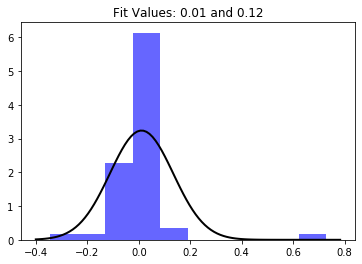

In [276]:
#mu = mean #std = standard deviation
mu, std = norm.fit(tickersig2df['mean'])
plt.hist(tickersig2df['mean'], bins=10, density=True, alpha=0.6, color='b')
xmin, xmax = plt.xlim()
x = np.linspace(xmin, xmax, 100)

p = norm.pdf(x, mu, std)
plt.plot(x, p, 'k', linewidth=2)
title = "Fit Values: {:.2f} and {:.2f}".format(mu, std)
plt.title(title)
  
plt.show() 

In [215]:
#signal3

In [33]:
tickersig3df= data.groupby(['ticker','industrySector'])['signal3'].describe() 

In [34]:
tickersig3df

,,count,mean,std,min,25%,50%,75%,max
ticker,industrySector,,,,,,,,
AIG,Financial,35.0,0.170860,0.597545,-1.000000,-0.240883,0.158276,0.644918,1.000000
AMGN,Consumer Non-cyclical,396.0,-0.112194,0.787201,-1.000000,-1.000000,-0.172441,0.689595,1.000000
BA,Industrial,329.0,-0.135953,0.678709,-1.000000,-0.819863,-0.179130,0.441849,1.000000
BAYNGR,Consumer Non-cyclical,51.0,-0.069106,0.637980,-1.000000,-0.574198,-0.088548,0.276330,1.000000
BK,Financial,354.0,-0.019844,0.521870,-1.000000,-0.366319,-0.029770,0.345712,1.000000
BNSF,Industrial,16.0,-0.183948,0.530573,-1.000000,-0.621594,-0.137761,0.278733,0.532548
CAG,Consumer Non-cyclical,289.0,-0.174607,0.715920,-1.000000,-0.898437,-0.298376,0.408034,1.000000
CAT,Industrial,39.0,-0.359975,0.520875,-1.000000,-0.827614,-0.399771,0.061468,0.601832
COST,Consumer Cyclical,485.0,0.032860,0.685144,-1.000000,-0.564616,0.073313,0.628039,1.000000


# COME BACK TO LOOK AT THIS BELOW!!!

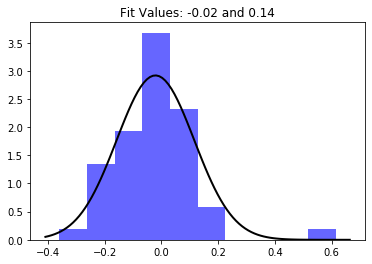

In [279]:
#mu = mean #std = standard deviation
mu, std = norm.fit(tickersig3df['mean'])
plt.hist(tickersig3df['mean'], bins=10, density=True, alpha=0.6, color='b')
xmin, xmax = plt.xlim()
x = np.linspace(xmin, xmax, 100)

p = norm.pdf(x, mu, std)
plt.plot(x, p, 'k', linewidth=2)
title = "Fit Values: {:.2f} and {:.2f}".format(mu, std)
plt.title(title)
  
plt.show() 

In [216]:
#move_1D

In [259]:
ticker1Ddf=data.groupby(['ticker','industrySector'])['move_1D'].describe() 

In [260]:
ticker1Ddf

,,count,mean,std,min,25%,50%,75%,max
ticker,industrySector,,,,,,,,
AIG,Financial,35.0,0.274194,0.821906,-1.451421,-0.122484,0.122780,0.355192,3.164213
AMGN,Consumer Non-cyclical,396.0,-0.147286,1.317218,-3.536925,-1.053987,-0.110200,0.665312,3.014975
BA,Industrial,329.0,-0.209481,1.029275,-4.418720,-0.810524,-0.082619,0.441485,4.156250
BAYNGR,Consumer Non-cyclical,51.0,0.150148,0.838262,-1.232700,-0.371769,-0.025230,0.354825,2.285323
BK,Financial,354.0,-0.060845,0.514596,-2.114560,-0.338073,-0.056776,0.204269,1.411591
BNSF,Industrial,16.0,-0.374144,0.484579,-1.190071,-0.624364,-0.375202,0.102568,0.230148
CAG,Consumer Non-cyclical,289.0,-0.217502,1.057606,-3.423250,-0.787837,-0.309499,0.373750,2.514000
CAT,Industrial,39.0,-0.555977,0.501093,-1.767370,-0.863259,-0.674900,-0.127587,0.313800
COST,Consumer Cyclical,485.0,0.025258,0.830132,-2.761775,-0.501550,0.044750,0.571725,2.025700


In [171]:
data.groupby(['ticker','industrySector'])['move_1D']

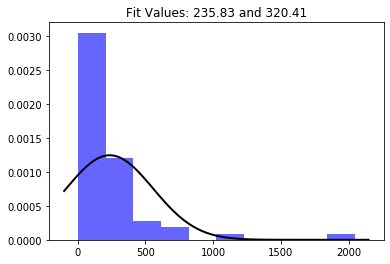

In [262]:
#mu = mean #std = standard deviation
mu, std = norm.fit(ticker1Ddf['count'])
plt.hist(ticker1Ddf['count'], bins=10, density=True, alpha=0.6, color='b')
xmin, xmax = plt.xlim()
x = np.linspace(xmin, xmax, 100)

p = norm.pdf(x, mu, std)
plt.plot(x, p, 'k', linewidth=2)
title = "Fit Values: {:.2f} and {:.2f}".format(mu, std)
plt.title(title)
  
plt.show() #count should be the same for move_3D as number of each ticker/industry sector isn't changing

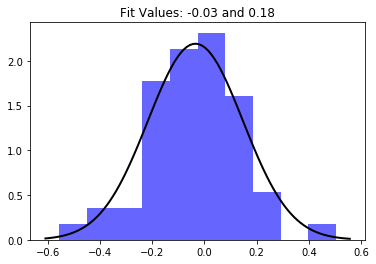

In [264]:
#mu = mean #std = standard deviation
mu, std = norm.fit(ticker1Ddf['mean'])
plt.hist(ticker1Ddf['mean'], bins=10, density=True, alpha=0.6, color='b')
xmin, xmax = plt.xlim()
x = np.linspace(xmin, xmax, 100)

p = norm.pdf(x, mu, std)
plt.plot(x, p, 'k', linewidth=2)
title = "Fit Values: {:.2f} and {:.2f}".format(mu, std)
plt.title(title)
  
plt.show() #looking at the mean move_1D of each ticker/industry sector?!

In [263]:
ticker1Ddf.groupby('industrySector').describe() #showing how many tickers are of each sector

count                                               \
                      count        mean         std    min    25%    50%   
industrySector                                                             
Basic Materials         3.0  175.666667   99.026932   78.0  125.5  173.0   
Consumer Cyclical       3.0  370.666667  122.132442  242.0  313.5  385.0   
Consumer Non-cyclical  12.0  361.750000  546.695548   41.0  122.0  190.5   
Energy                  3.0  115.333333  112.544806   43.0   50.5   58.0   
Financial              11.0  222.000000  238.880305    2.0   37.0  161.0   
Industrial             11.0  133.727273  107.682952    6.0   32.5  104.0   
Technology              5.0  323.800000  439.578434   73.0  102.0  146.0   
Utilities               5.0  128.200000  163.296356   34.0   48.0   67.0   

                                       mean            ...       75%  \
                          75%     max count      mean  ...       75%   
industrySector                                         ...             
Basic Materials        224.50   276.0   3.0 -0.184938  ...  0.395512   
Consumer Cyclical      435.00   485.0   3.0  0.003637  ...  0.605762   
Consumer Non-cyclical  335.25  2044.0  12.0 -0.042803  ...  0.526242   
Energy                 151.50   245.0   3.0 -0.028629  ...  0.387821   
Financial              298.00   691.0  11.0  0.107312  ...  0.384734   
Industrial             216.50   329.0  11.0 -0.145808  ...  0.400424   
Technology             192.00  1106.0   5.0  0.066136  ...  0.536895   
Utilities               73.00   419.0   5.0 -0.120420  ...  0.460301   

                                  max                                          \
                            max count      mean       std       min       25%   
industrySector                                                                  
Basic Materials        0.483447   3.0  2.754692  1.061122  1.532825  2.409663   
Consumer Cyclical      0.639800   3.0  3.591270  2.271354  2.025700  2.288725   
Consumer Non-cyclical  0.665312  12.0  2.970699  1.503354  0.617880  2.357456   
Energy                 0.423544   3.0  1.617828  0.872720  0.875198  1.137207   
Financial              0.555503  11.0  2.549242  2.047144  0.496251  1.314393   
Industrial             0.467446  11.0  1.564439  1.330731  0.230148  0.566162   
Technology             0.619890   5.0  2.557243  0.590961  1.662122  2.486000   
Utilities              0.532710   5.0  2.638841  1.234000  1.185607  1.631470   

                                                     
                            50%       75%       max  
industrySector                                       
Basic Materials        3.286500  3.365625  3.444750  
Consumer Cyclical      2.551750  4.374055  6.196359  
Consumer Non-cyclical  2.970413  3.368912  6.483256  
Energy                 1.399216  1.989144  2.579072  
Financial              1.807702  3.435319  7.652850  
Industrial             1.107750  2.066088  4.156250  
Technology             2.580757  2.758864  3.298471  
Utilities              2.983900  3.145479  4.247750  

[8 rows x 64 columns]

In [265]:
ticker3Ddf=data.groupby(['ticker','industrySector'])['move_3D'].describe() 

In [266]:
ticker3Ddf

,,count,mean,std,min,25%,50%,75%,max
ticker,industrySector,,,,,,,,
AIG,Financial,35.0,0.776447,1.304736,-0.741202,0.123906,0.560874,1.078470,5.493945
AMGN,Consumer Non-cyclical,396.0,-0.520094,2.488159,-6.736900,-2.537659,-0.553750,1.531025,4.952025
BA,Industrial,329.0,-0.476890,1.847115,-8.030499,-1.180250,-0.227738,0.594615,5.780000
BAYNGR,Consumer Non-cyclical,51.0,0.121293,1.182593,-1.749776,-0.570820,-0.030992,0.485420,6.235563
BK,Financial,354.0,-0.006951,0.875324,-2.156151,-0.656610,-0.021684,0.503970,2.636853
BNSF,Industrial,16.0,-1.143114,1.027111,-3.037840,-1.518623,-1.358025,-0.237605,0.464236
CAG,Consumer Non-cyclical,289.0,-0.410994,1.979497,-5.856000,-1.673000,-0.296250,0.952750,4.268500
CAT,Industrial,39.0,-1.165776,0.973052,-2.557123,-2.004137,-1.226308,-0.555246,0.961500
COST,Consumer Cyclical,485.0,0.059191,1.654453,-5.519525,-0.853300,0.009275,1.110875,3.668875


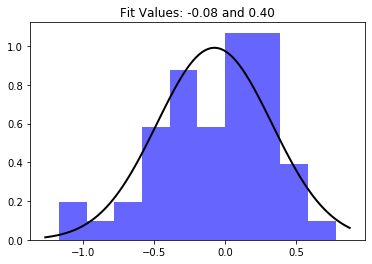

In [267]:
#mu = mean #std = standard deviation
mu, std = norm.fit(ticker3Ddf['mean'])
plt.hist(ticker3Ddf['mean'], bins=10, density=True, alpha=0.6, color='b')
xmin, xmax = plt.xlim()
x = np.linspace(xmin, xmax, 100)

p = norm.pdf(x, mu, std)
plt.plot(x, p, 'k', linewidth=2)
title = "Fit Values: {:.2f} and {:.2f}".format(mu, std)
plt.title(title)
  
plt.show()

# trying to see if ticker influences corr between move_1D and signals

In [275]:
data.ticker.unique()

array(['MSFT', 'GP', 'KSS', 'DOW', 'JPM', 'COST', 'RY', 'CVS', 'TFC',
       'RSG', 'BA', 'PNC', 'AMGN', 'PCG', 'GM', 'GLENLN', 'MRK', 'PYPL',
       'MS', 'PKI', 'VLO', 'BK', 'LMT', 'CAG', 'VMW', 'HUM', 'NEE',
       'KEYS', 'DE', 'CSX', 'ROP', 'MKL', 'UDR', 'PFE', 'WMB', 'KDP',
       'DXC', 'VST', 'TSN', 'NSC', 'GE', 'DUK', 'BAYNGR', 'SRC', 'KMI',
       'O', 'FBHS', 'QCOM', 'AIG', 'XEL', 'CAT', 'MCO', 'BNSF'],
      dtype=object)

In [318]:
ticker=['MSFT', 'GP', 'KSS', 'DOW', 'JPM', 'COST', 'RY', 'CVS', 'TFC',
       'RSG', 'BA', 'PNC', 'AMGN', 'PCG', 'GM', 'GLENLN', 'MRK', 'PYPL',
       'MS', 'PKI', 'VLO', 'BK', 'LMT', 'CAG', 'VMW', 'HUM', 'NEE',
       'KEYS', 'DE', 'CSX', 'ROP', 'MKL', 'UDR', 'PFE', 'WMB', 'KDP',
       'DXC', 'VST', 'TSN', 'NSC', 'GE', 'DUK', 'BAYNGR', 'SRC', 'KMI',
       'O', 'FBHS', 'QCOM', 'AIG', 'XEL', 'CAT', 'MCO', 'BNSF']
for t in ticker:
    print(t, data[data['ticker']== t]['move_1D'].corr(data[data['ticker']== t]['signal3']))

MSFT 0.869857512956818
GP 0.8423801028135409
KSS 0.8656441625318033
DOW 0.8967707617548087
JPM 0.6519606433284029
COST 0.8853681111035459
RY 0.7758984914443675
CVS 0.8838651009015546
TFC 0.8358325680299271
RSG 0.8745397347325695
BA 0.8382355168295399
PNC 0.8836356169504036
AMGN 0.8985027981009156
PCG 0.8506714267759801
GM 0.7884307994037035
GLENLN 0.8220802975411727
MRK 0.8923766415283627
PYPL 0.8850943104365062
MS 0.8209896529268601
PKI 0.8282775254449843
VLO 0.8610731262374993
BK 0.7882673516138182
LMT 0.8745262690289046
CAG 0.8865870734577624
VMW 0.8451214408187683
HUM 0.8552553951245866
NEE 0.8501692258791289
KEYS 0.8281379267585733
DE 0.8189599363569159
CSX 0.87125383221734
ROP 0.8389046838394146
MKL 0.7535346640773809
UDR 0.8067309838663376
PFE 0.7914053712036506
WMB 0.8306661979540241
KDP 0.8685211463031743
DXC 0.819413497380253
VST 0.7504347246709414
TSN 0.7114633497644985
NSC 0.7736476444982414
GE 0.7966495762419046
DUK 0.7780699484330571
BAYNGR 0.8852485367062958
SRC 1.0
KMI 

In [53]:
ticker=['MSFT', 'GP', 'KSS', 'DOW', 'JPM', 'COST', 'RY', 'CVS', 'TFC',
       'RSG', 'BA', 'PNC', 'AMGN', 'PCG', 'GM', 'GLENLN', 'MRK', 'PYPL',
       'MS', 'PKI', 'VLO', 'BK', 'LMT', 'CAG', 'VMW', 'HUM', 'NEE',
       'KEYS', 'DE', 'CSX', 'ROP', 'MKL', 'UDR', 'PFE', 'WMB', 'KDP',
       'DXC', 'VST', 'TSN', 'NSC', 'GE', 'DUK', 'BAYNGR', 'SRC', 'KMI',
       'O', 'FBHS', 'QCOM', 'AIG', 'XEL', 'CAT', 'MCO', 'BNSF']
d = {}
for t in ticker:
    d[t]=data[data['ticker']== t]['move_1D'].corr(data[data['ticker']== t]['signal3'])

In [54]:
d

{'MSFT': 0.869857512956818,
 'GP': 0.8423801028135409,
 'KSS': 0.8656441625318033,
 'DOW': 0.8967707617548087,
 'JPM': 0.6519606433284029,
 'COST': 0.8853681111035459,
 'RY': 0.7758984914443675,
 'CVS': 0.8838651009015546,
 'TFC': 0.8358325680299271,
 'RSG': 0.8745397347325695,
 'BA': 0.8382355168295399,
 'PNC': 0.8836356169504036,
 'AMGN': 0.8985027981009156,
 'PCG': 0.8506714267759801,
 'GM': 0.7884307994037035,
 'GLENLN': 0.8220802975411727,
 'MRK': 0.8923766415283627,
 'PYPL': 0.8850943104365062,
 'MS': 0.8209896529268601,
 'PKI': 0.8282775254449843,
 'VLO': 0.8610731262374993,
 'BK': 0.7882673516138182,
 'LMT': 0.8745262690289046,
 'CAG': 0.8865870734577624,
 'VMW': 0.8451214408187683,
 'HUM': 0.8552553951245866,
 'NEE': 0.8501692258791289,
 'KEYS': 0.8281379267585733,
 'DE': 0.8189599363569159,
 'CSX': 0.87125383221734,
 'ROP': 0.8389046838394146,
 'MKL': 0.7535346640773809,
 'UDR': 0.8067309838663376,
 'PFE': 0.7914053712036506,
 'WMB': 0.8306661979540241,
 'KDP': 0.868521146303

### signal3 is definitely better at predicting move_1D data for some tickers better than others. see values above

In [319]:
ticker=['MSFT', 'GP', 'KSS', 'DOW', 'JPM', 'COST', 'RY', 'CVS', 'TFC',
       'RSG', 'BA', 'PNC', 'AMGN', 'PCG', 'GM', 'GLENLN', 'MRK', 'PYPL',
       'MS', 'PKI', 'VLO', 'BK', 'LMT', 'CAG', 'VMW', 'HUM', 'NEE',
       'KEYS', 'DE', 'CSX', 'ROP', 'MKL', 'UDR', 'PFE', 'WMB', 'KDP',
       'DXC', 'VST', 'TSN', 'NSC', 'GE', 'DUK', 'BAYNGR', 'SRC', 'KMI',
       'O', 'FBHS', 'QCOM', 'AIG', 'XEL', 'CAT', 'MCO', 'BNSF']
for t in ticker:
    print(t, data[data['ticker']== t]['move_1D'].corr(data[data['ticker']== t]['signal2']))

MSFT 0.017612233890381055
GP 0.23755728936156478
KSS -0.04578519707433002
DOW 0.07024307872091173
JPM 0.06274089579926789
COST -0.030110850886122722
RY -0.006679767415333398
CVS 0.021390853505207495
TFC -0.09425287272753367
RSG -0.08573223092661235
BA -0.02920139641706027
PNC 0.0809886047750602
AMGN 0.007055760660778189
PCG 0.1522366050974688
GM 0.017985734605485738
GLENLN -0.08701604506465872
MRK 0.015252229548353646
PYPL 0.05992718145073199
MS -0.04063369613663845
PKI -0.075164846754829
VLO 0.012164875625097965
BK 0.05562823731245083
LMT -0.06674879549992782
CAG 0.04012531031465954
VMW 0.029053273105397882
HUM 0.05203309172358438
NEE -0.022054737808512113
KEYS -0.08228412898846368
DE 0.06562975343339682
CSX 0.005822826203021594
ROP 0.011779945492926778
MKL -0.04878393435983223
UDR -0.06570921949927626
PFE 0.08519305278834047
WMB 0.3102459320360027
KDP 0.030701395057922076
DXC 0.09433137753712516
VST 0.2862501272519837
TSN 0.0045761849941663825
NSC -0.8333623647387635
GE -0.1643080922

In [320]:
ticker=['MSFT', 'GP', 'KSS', 'DOW', 'JPM', 'COST', 'RY', 'CVS', 'TFC',
       'RSG', 'BA', 'PNC', 'AMGN', 'PCG', 'GM', 'GLENLN', 'MRK', 'PYPL',
       'MS', 'PKI', 'VLO', 'BK', 'LMT', 'CAG', 'VMW', 'HUM', 'NEE',
       'KEYS', 'DE', 'CSX', 'ROP', 'MKL', 'UDR', 'PFE', 'WMB', 'KDP',
       'DXC', 'VST', 'TSN', 'NSC', 'GE', 'DUK', 'BAYNGR', 'SRC', 'KMI',
       'O', 'FBHS', 'QCOM', 'AIG', 'XEL', 'CAT', 'MCO', 'BNSF']
for t in ticker:
    print(t, data[data['ticker']== t]['move_1D'].corr(data[data['ticker']== t]['signal1']))

MSFT -0.035443176727040976
GP 0.15475545891956805
KSS -0.010168699010775906
DOW 0.3396518459380559
JPM -0.13762880026297006
COST 0.2539530845165962
RY 0.14819110997988327
CVS 0.40579067693627563
TFC 0.20462752595251338
RSG 0.12188441018796896
BA 0.26328327375310046
PNC 0.3272358398921696
AMGN 0.43970957740715544
PCG 0.3533522559291754
GM 0.31380210225282823
GLENLN 0.42560604410701947
MRK 0.33442755067230906
PYPL 0.4379013539726725
MS 0.2294329697138386
PKI 0.16158696703205971
VLO 0.2892985333190061
BK 0.30614433605822705
LMT 0.42320263587698376
CAG 0.36315708098740435
VMW 0.3137723667593415
HUM 0.38806118563113035
NEE 0.20225694940390865
KEYS 0.1911692498067598
DE -0.01082344871444674
CSX 0.03891545549108642
ROP -0.00021088540453302715
MKL 0.04136707426354825
UDR 0.1151863072845907
PFE 0.05123317089458758
WMB -0.25964808113918036
KDP 0.4455860158632954
DXC 0.18063308116385315
VST 0.10427523715854611
TSN 0.33107291564701574
NSC -0.24411860264267218
GE 0.05081882140392725
DUK 0.369363759

# looking at liq_score

In [120]:
data['liq_score']

0         170
1         558
2         558
3         347
4         170
         ... 
12494      47
12495      13
12496      49
12497     181
12498    1676
Name: liq_score, Length: 12499, dtype: int64

In [134]:
data['liq_score'].describe()

count    12499.000000
mean       905.487399
std        824.095690
min          3.000000
25%        182.000000
50%        719.000000
75%       1394.000000
max       3000.000000
Name: liq_score, dtype: float64

In [62]:
from scipy.stats import norm

In [63]:
mu, std = norm.fit(data['liq_score'])

(array([1.69716614e-03, 7.38797843e-04, 5.49927211e-04, 5.69281445e-04,
        3.47708831e-04, 2.69624506e-04, 2.98322164e-04, 3.35028471e-04,
        4.81853697e-04, 4.58495138e-04, 3.31691534e-04, 2.87643966e-04,
        2.25576938e-04, 2.38257299e-04, 1.82196758e-04, 1.28805767e-04,
        9.20994600e-05, 1.87535857e-04, 1.48160001e-04, 9.67711718e-05,
        1.34144866e-04, 1.66846848e-04, 1.52831713e-04, 1.14123244e-04,
        1.08784145e-04]),
 array([   3.  ,  122.88,  242.76,  362.64,  482.52,  602.4 ,  722.28,
         842.16,  962.04, 1081.92, 1201.8 , 1321.68, 1441.56, 1561.44,
        1681.32, 1801.2 , 1921.08, 2040.96, 2160.84, 2280.72, 2400.6 ,
        2520.48, 2640.36, 2760.24, 2880.12, 3000.  ]),
 <a list of 25 Patch objects>)

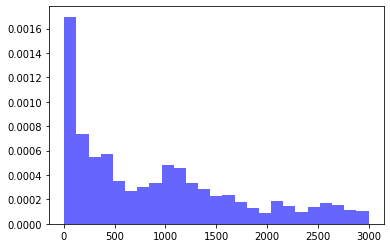

In [149]:
plt.hist(data['liq_score'], bins=25, density=True, alpha=0.6, color='b')

(-500, 3500)

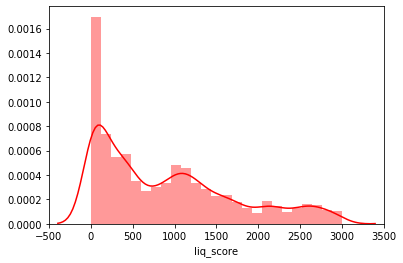

In [181]:
sns.distplot(data['liq_score'], color ='red', bins = 25)
plt.xlim(-500, 3500, 250) 

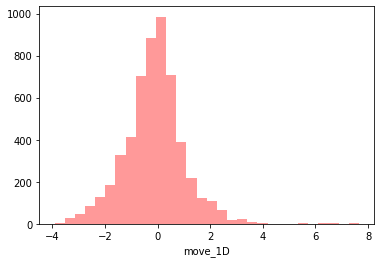

In [184]:
sns.distplot(data[(data['liq_score'] < 500)]['move_1D'], kde = False, color ='red', bins = 30)

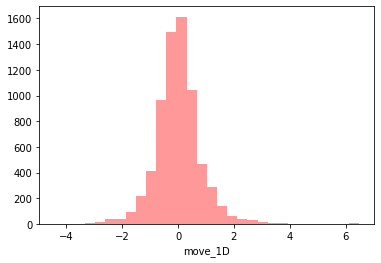

In [148]:
sns.distplot(data[(data['liq_score'] >500)]['move_1D'], kde = False, color ='red', bins = 30) 

In [160]:
data[data['liq_score'] < 500] #trying to see how many have a liq_score < 500 as graph is right skewed

,request_time,cusip,quantity_bonds,liq_score,mat_bucket,industrySector,ticker,move_1D,move_3D,signal1,...,month,day,hour,minute,move1Ddailyavg,move3Ddailyavg,month_day,bondlength,liq_percent,liq_decimal
0,1/4/2021 8:32,594918BY9,3000,170,B05,Technology,MSFT,0.139226,-1.705008,0.000000,...,1,04,8,32,0.906754,-0.052968,1-04,5,0.170,0.170
3,1/4/2021 13:07,500255AU8,50,347,B05,Consumer Cyclical,KSS,-1.917058,-2.578685,0.085106,...,1,04,13,7,0.906754,-0.052968,1-04,5,0.347,0.347
4,1/4/2021 13:14,594918BY9,80,170,B05,Technology,MSFT,0.190731,-1.134894,-0.708861,...,1,04,13,14,0.906754,-0.052968,1-04,5,0.170,0.170
5,1/4/2021 13:41,260543DD2,100,71,B30,Basic Materials,DOW,2.591040,1.853324,-0.430464,...,1,04,13,41,0.906754,-0.052968,1-04,30,0.071,0.071
8,1/4/2021 13:53,22160KAP0,200,297,B10,Consumer Cyclical,COST,1.020260,0.809400,0.221622,...,1,04,13,53,0.906754,-0.052968,1-04,10,0.297,0.297
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
12493,4/1/2021 19:38,126650CX6,2,13,B10,Consumer Non-cyclical,CVS,1.419900,3.291750,-0.618182,...,3,01,19,38,-0.184403,0.407363,3-01,10,0.013,0.013
12494,4/1/2021 19:39,031162CR9,1340,47,B30,Consumer Non-cyclical,AMGN,0.232550,1.455575,0.238095,...,3,01,19,39,-0.184403,0.407363,3-01,30,0.047,0.047
12495,4/1/2021 19:39,126650CX6,118,13,B10,Consumer Non-cyclical,CVS,1.419900,3.291750,-0.618182,...,3,01,19,39,-0.184403,0.407363,3-01,10,0.013,0.013
12496,4/1/2021 19:49,260543DD2,10,49,B30,Basic Materials,DOW,0.314750,2.243250,-0.777778,...,3,01,19,49,-0.184403,0.407363,3-01,30,0.049,0.049


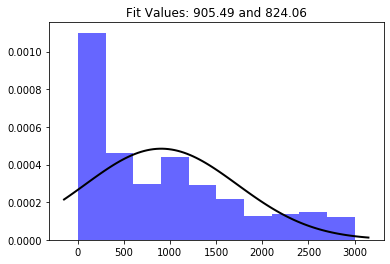

In [165]:
#mu = mean #std = standard deviation
mu, std = norm.fit(data['liq_score'])
plt.hist(data['liq_score'], bins=10, density=True, alpha=0.6, color='b')
xmin, xmax = plt.xlim()
x = np.linspace(xmin, xmax, 100)

p = norm.pdf(x, mu, std)
plt.plot(x, p, 'k', linewidth=2)
title = "Fit Values: {:.2f} and {:.2f}".format(mu, std)
plt.title(title)
  
plt.show() #first fit value is mean, second is std

### binning liq_score 

In [67]:
bins = [0, 605, 1500, 2000, 3000]
data['binnedliq_score'] = pd.cut(data['liq_score'], bins, labels = [1,2,3,4])
print (data)
data.head()

         request_time      cusip  quantity_bonds  liq_score mat_bucket  \
0       1/4/2021 8:32  594918BY9            3000        170        B05   
1      1/4/2021 12:58  37331NAK7              50        558        B10   
2      1/4/2021 12:58  37331NAK7              50        558        B10   
3      1/4/2021 13:07  500255AU8              50        347        B05   
4      1/4/2021 13:14  594918BY9              80        170        B05   
...               ...        ...             ...        ...        ...   
12494  4/1/2021 19:39  031162CR9            1340         47        B30   
12495  4/1/2021 19:39  126650CX6             118         13        B10   
12496  4/1/2021 19:49  260543DD2              10         49        B30   
12497  4/1/2021 20:36  378272AY4             130        181        B10   
12498  4/1/2021 20:51  05531FBH5             160       1676        B03   

              industrySector  ticker   move_1D   move_3D   signal1  ...  year  \
0                 Technology  

,request_time,cusip,quantity_bonds,liq_score,mat_bucket,industrySector,ticker,move_1D,move_3D,signal1,...,year,month,day,hour,minute,month_day,bondlength,binned_quantity,binnedliq_score1,binnedliq_score
0,1/4/2021 8:32,594918BY9,3000,170,B05,Technology,MSFT,0.139226,-1.705008,0.000000,...,2021,1,04,8,32,1-04,5,4,1,1
1,1/4/2021 12:58,37331NAK7,50,558,B10,Basic Materials,GP,0.169077,0.622054,0.790123,...,2021,1,04,12,58,1-04,10,1,1,1
2,1/4/2021 12:58,37331NAK7,50,558,B10,Basic Materials,GP,0.169077,0.622054,0.790123,...,2021,1,04,12,58,1-04,10,1,1,1
3,1/4/2021 13:07,500255AU8,50,347,B05,Consumer Cyclical,KSS,-1.917058,-2.578685,0.085106,...,2021,1,04,13,7,1-04,5,1,1,1
4,1/4/2021 13:14,594918BY9,80,170,B05,Technology,MSFT,0.190731,-1.134894,-0.708861,...,2021,1,04,13,14,1-04,5,1,1,1


In [68]:
binnedliq_score=[1,2,3,4] #1=(0, 605) 2= (605,1500) 3=(1500,2000) 4=(2000,3000)
for b in binnedliq_score:
    print(b, data[data['binnedliq_score']== b]['move_1D'].corr(data[data['binnedliq_score']== b]['signal3']))

1 0.8528968862274711
2 0.8313463529998044
3 0.8109751053132161
4 0.8226410537090161


In [69]:
binnedliq_score=[1,2,3,4] #1=(0, 605) 2= (605,1500) 3=(1500,2000) 4=(2000,3000)
for b in binnedliq_score:
    print(b, data[data['binnedliq_score']== b]['move_1D'].corr(data[data['binnedliq_score']== b]['signal1']))

1 0.2694460832527833
2 0.26158860584767557
3 0.227381007491518
4 0.14309625714015256


In [70]:
#i do not think liq_score has anything to do with how well signal perfroms in relation to move_1D info
#HOWEVER the corr is higher for bin 1 than bin2 for signal1

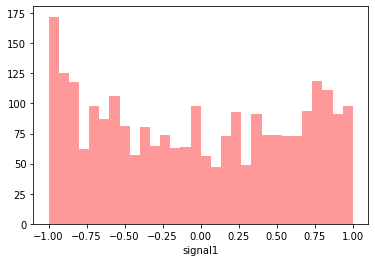

In [118]:
sns.distplot(data[(data['binnedliq_score'] == 1)]['signal1'], kde = False, color ='red', bins = 30) 

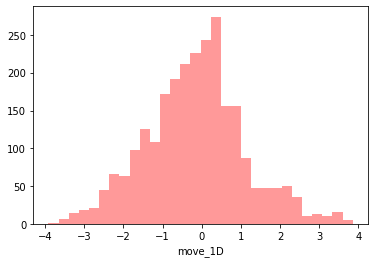

In [119]:
sns.distplot(data[(data['binnedliq_score'] == 1)]['move_1D'], kde = False, color ='red', bins = 30) 

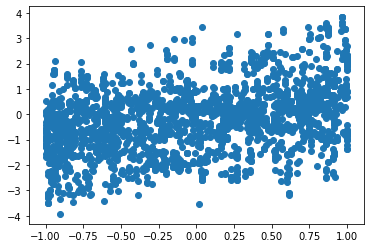

In [121]:
plt.scatter(data[(data['binnedliq_score'] == 1)]['signal1'],data[(data['binnedliq_score'] == 1)]['move_1D'])

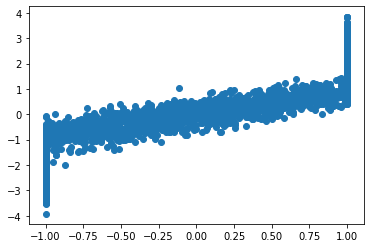

In [134]:
plt.scatter(data[(data['binnedliq_score'] == 1)]['signal3'],data[(data['binnedliq_score'] == 1)]['move_1D'])

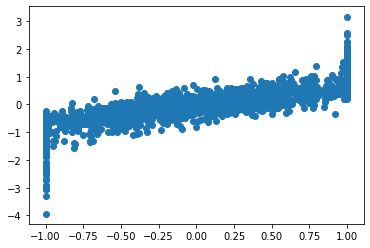

In [135]:
plt.scatter(data[(data['binnedliq_score'] == 4)]['signal3'],data[(data['binnedliq_score'] == 4)]['move_1D'])
#i do not think liq_score has anything to do with how well signal perfroms in relation to move_1D info(at least for signal3)

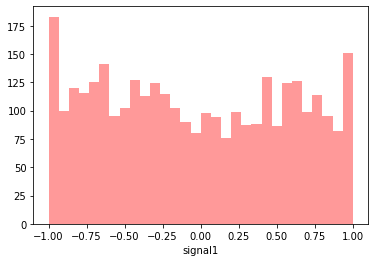

In [127]:
sns.distplot(data[(data['binnedliq_score'] == 2)]['signal1'], kde = False, color ='red', bins = 30) #start of bin 2 data

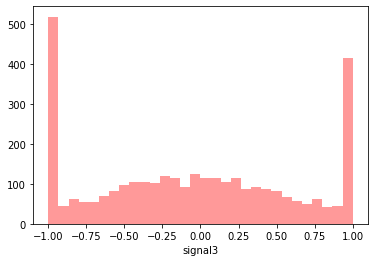

In [126]:
sns.distplot(data[(data['binnedliq_score'] == 2)]['signal3'], kde = False, color ='red', bins = 30) 

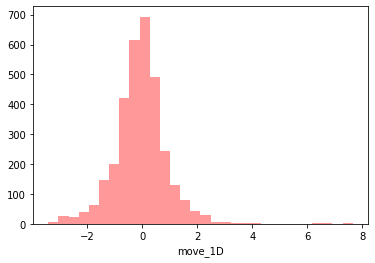

In [128]:
sns.distplot(data[(data['binnedliq_score'] == 2)]['move_1D'], kde = False, color ='red', bins = 30) 

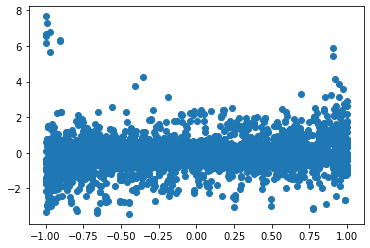

In [129]:
plt.scatter(data[(data['binnedliq_score'] == 2)]['signal1'],data[(data['binnedliq_score'] == 2)]['move_1D'])

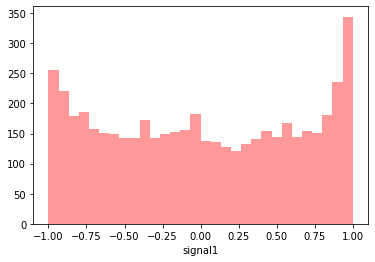

In [136]:
sns.distplot(data[(data['binnedliq_score'] == 3)]['signal1'], kde = False, color ='red', bins = 30) #start of bin 2 data

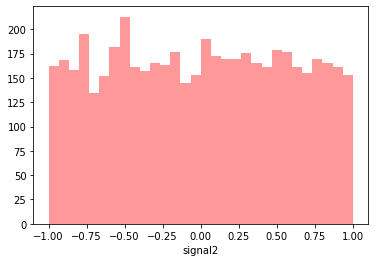

In [137]:
sns.distplot(data[(data['binnedliq_score'] == 3)]['signal2'], kde = False, color ='red', bins = 30) #start of bin 2 data

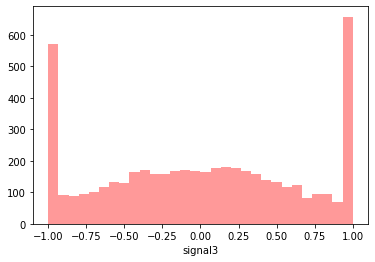

In [138]:
sns.distplot(data[(data['binnedliq_score'] == 3)]['signal3'], kde = False, color ='red', bins = 30) #start of bin 2 data

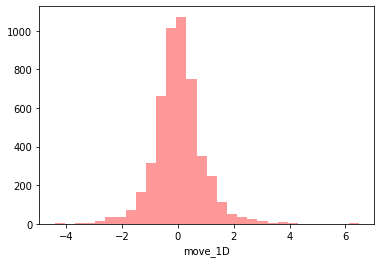

In [139]:
sns.distplot(data[(data['binnedliq_score'] == 3)]['move_1D'], kde = False, color ='red', bins = 30) #start of bin 2 data

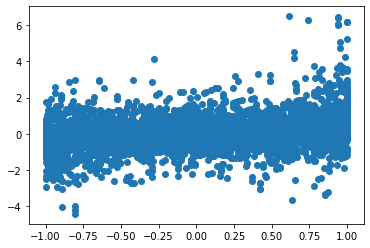

In [141]:
plt.scatter(data[(data['binnedliq_score'] == 3)]['signal1'],data[(data['binnedliq_score'] == 3)]['move_1D'])

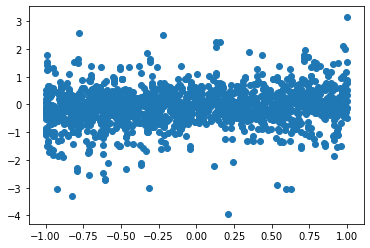

In [157]:
plt.scatter(data[(data['binnedliq_score'] == 4)]['signal1'],data[(data['binnedliq_score'] == 4)]['move_1D'])

# daily average calc 

In [71]:
data['move1Ddailyavg'] = data.groupby(['rfqdate'])['move_1D'].transform('mean')
data['move3Ddailyavg'] = data.groupby(['rfqdate'])['move_3D'].transform('mean')

In [72]:
data.head()

,request_time,cusip,quantity_bonds,liq_score,mat_bucket,industrySector,ticker,move_1D,move_3D,signal1,...,day,hour,minute,month_day,bondlength,binned_quantity,binnedliq_score1,binnedliq_score,move1Ddailyavg,move3Ddailyavg
0,1/4/2021 8:32,594918BY9,3000,170,B05,Technology,MSFT,0.139226,-1.705008,0.000000,...,04,8,32,1-04,5,4,1,1,0.906754,-0.052968
1,1/4/2021 12:58,37331NAK7,50,558,B10,Basic Materials,GP,0.169077,0.622054,0.790123,...,04,12,58,1-04,10,1,1,1,0.906754,-0.052968
2,1/4/2021 12:58,37331NAK7,50,558,B10,Basic Materials,GP,0.169077,0.622054,0.790123,...,04,12,58,1-04,10,1,1,1,0.906754,-0.052968
3,1/4/2021 13:07,500255AU8,50,347,B05,Consumer Cyclical,KSS,-1.917058,-2.578685,0.085106,...,04,13,7,1-04,5,1,1,1,0.906754,-0.052968
4,1/4/2021 13:14,594918BY9,80,170,B05,Technology,MSFT,0.190731,-1.134894,-0.708861,...,04,13,14,1-04,5,1,1,1,0.906754,-0.052968


In [73]:
dailyaverages = data[['month_day','signal1dailyavg','signal2dailyavg','signal3dailyavg','move1Ddailyavg','move3Ddailyavg']]

In [74]:
max_dailyaverages=dailyaverages.groupby(['month_day']).max()

In [75]:
max_dailyaverages.index

Index(['1-04', '1-05', '1-06', '1-07', '1-08', '1-11', '1-12', '1-13', '1-14',
       '1-15', '1-18', '1-19', '1-20', '1-21', '1-22', '1-25', '1-26', '1-27',
       '1-28', '1-29', '2-01', '2-02', '2-03', '2-04', '2-05', '2-08', '2-09',
       '2-10', '2-11', '2-12', '2-16', '2-17', '2-18', '2-19', '2-23', '2-24',
       '2-25', '2-26', '3-01', '3-02', '3-03', '3-04', '3-05', '3-08', '3-09',
       '3-10', '3-11', '3-12', '3-15', '3-16', '3-17', '3-18', '3-19', '3-22',
       '3-23', '3-24', '3-25', '3-26', '3-29', '3-30', '3-31', '4-01'],
      dtype='object', name='month_day')

In [76]:
month_day= ['1-04', '1-05', '1-06', '1-07', '1-08', '1-11', '1-12', '1-13', '1-14',
       '1-15', '1-18', '1-19', '1-20', '1-21', '1-22', '1-25', '1-26', '1-27',
       '1-28', '1-29', '2-01', '2-02', '2-03', '2-04', '2-05', '2-08', '2-09',
       '2-10', '2-11', '2-12', '2-16', '2-17', '2-18', '2-19', '2-23', '2-24',
       '2-25', '2-26', '3-01', '3-02', '3-03', '3-04', '3-05', '3-08', '3-09',
       '3-10', '3-11', '3-12', '3-15', '3-16', '3-17', '3-18', '3-19', '3-22',
       '3-23', '3-24', '3-25', '3-26', '3-29', '3-30', '3-31', '4-01']
for d in month_day:
    print(d, data[data['month_day']== d]['move_1D'].corr(data[data['month_day']== d]['signal3']))

1-04 0.7871532298496798
1-05 0.8518655268993943
1-06 0.7664288082234688
1-07 0.8289878947019156
1-08 0.8360320683219561
1-11 0.8181018531051214
1-12 0.8262137412265204
1-13 0.8057642702602469
1-14 0.8393665053986471
1-15 0.8382314304124018
1-18 nan
1-19 0.7997158522799028
1-20 0.7794837814465511
1-21 0.8143526358571914
1-22 0.7903939943118188
1-25 0.7592723164846432
1-26 0.82245398742274
1-27 0.8477210185837311
1-28 0.8741406340094876
1-29 0.8295723525220947
2-01 0.8767374417976497
2-02 0.7562662749530654
2-03 0.8022460153604196
2-04 0.7087822708215216
2-05 0.7730480936286364
2-08 0.8498742360151074
2-09 0.7735010517921429
2-10 0.7977402923609758
2-11 0.8201585530923313
2-12 0.8126530485867118
2-16 0.8817295543234271
2-17 0.793299518671429
2-18 0.8093057956234805
2-19 0.7241526436151493
2-23 0.8707811354932449
2-24 0.8298099411660235
2-25 0.8942324623046141
2-26 0.7678938655635357
3-01 0.8188556443602295
3-02 0.8289873352979763
3-03 0.813303781487039
3-04 0.6085733725453341
3-05 0.6570

In [58]:
dailyaverages.groupby(['month_day']).head(1)

,month_day,signal1dailyavg,signal2dailyavg,signal3dailyavg,move1Ddailyavg,move3Ddailyavg
0,1-04,0.387550,0.079645,0.513054,0.906754,-0.052968
236,1-05,0.503837,0.005251,0.070149,0.098580,-1.273227
493,1-06,-0.025972,0.049015,-0.595308,-1.039757,-1.448070
680,1-07,-0.535579,-0.011812,-0.351285,-0.482354,-0.444837
848,1-12,-0.028962,-0.046072,-0.380348,-0.542649,-0.860563
...,...,...,...,...,...,...
11412,3-26,-0.528217,-0.031879,-0.147832,-0.160786,-2.366552
11649,3-29,-0.223414,0.001346,-0.578079,-0.877145,-3.460549
11850,3-30,-0.455331,0.013578,-0.769752,-1.516271,-2.519484
12077,3-31,-0.813733,-0.041664,-0.647350,-1.056343,-0.664346


In [59]:
data['move3Ddailyavg'].corr(data['signal2dailyavg'])

0.053993023023593066

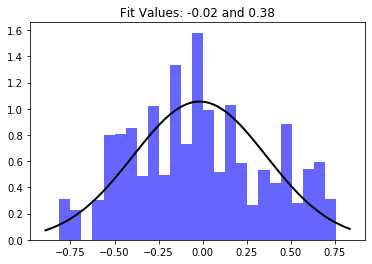

In [63]:
mu, std = norm.fit(data['signal1dailyavg'])
plt.hist(data['signal1dailyavg'], bins=25, density=True, alpha=0.6, color='b')
xmin, xmax = plt.xlim()
x = np.linspace(xmin, xmax, 100)

p = norm.pdf(x, mu, std)
plt.plot(x, p, 'k', linewidth=2)
title = "Fit Values: {:.2f} and {:.2f}".format(mu, std)
plt.title(title)
  
plt.show()

# box plots w avgs

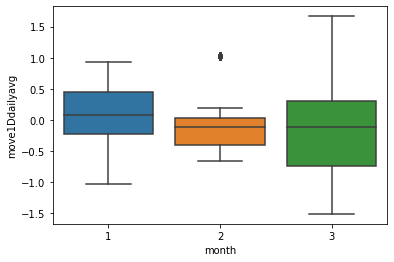

In [65]:
sns.boxplot(x=data['month'], y=data['move1Ddailyavg'])

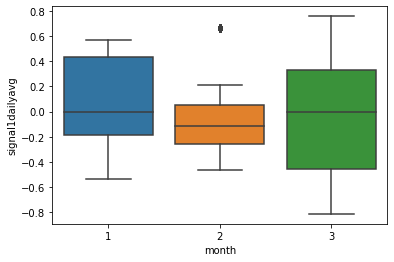

In [66]:
sns.boxplot(x=data['month'], y=data['signal1dailyavg'])

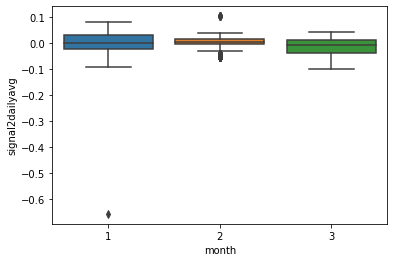

In [67]:
sns.boxplot(x=data['month'], y=data['signal2dailyavg'])

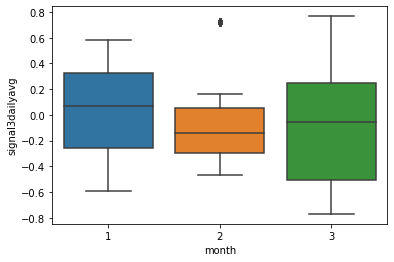

In [68]:
sns.boxplot(x=data['month'], y=data['signal3dailyavg'])

# explore

### looking at when all move and signals >= 0

In [296]:
data.loc[(data["move_3D"]>=0) & (data["move_1D"]>=0) & (data["signal1"]>=0) & (data["signal2"]>=0) & (data["signal3"]>=0), ["move_1D","signal1", "signal2", "signal3","move_3D", "month_day", "quantity_bonds", "liq_score"]]

,move_1D,signal1,signal2,signal3,move_3D,month_day,quantity_bonds,liq_score
9,1.020260,0.221622,0.285617,1.000000,0.809400,1-04,200,297
11,3.169975,0.473684,0.995629,1.000000,0.786500,1-04,11,3
15,3.169975,0.473684,0.129428,1.000000,0.786500,1-04,11,3
20,2.727575,0.473684,0.749029,1.000000,0.714875,1-04,57,3
23,2.558652,0.697297,0.022310,1.000000,3.166020,1-04,250,82
...,...,...,...,...,...,...,...,...
11433,0.646672,0.738676,0.137531,1.000000,0.111281,3-26,3,2087
11441,0.655370,1.000000,0.716137,0.703808,0.471531,3-26,35,1060
11456,0.630125,0.730038,0.484671,0.990840,0.302852,3-26,180,1060
11700,0.612825,0.602362,0.981945,0.584027,1.560850,3-29,250,1043


In [306]:
data_sorted = data.sort_values(['move_1D','signal3'], ascending=False)
data_sorted[['move_1D','signal3']].head()

,move_1D,signal3
8545,7.652850,1.0
8593,7.307525,1.0
8599,6.776525,1.0
8571,6.674625,1.0
8559,6.576725,1.0


In [ ]:
#%matplotlib inline
#data.hist(column="month_day",by="move_1D",bins=30) didnt work

In [ ]:
sns.distplot(data.move_1D, ax=ax_hist)

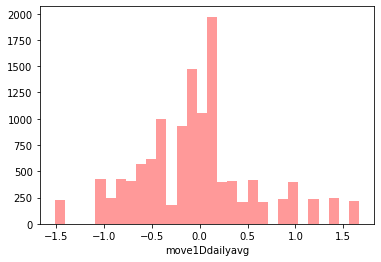

In [308]:
sns.distplot(data['move1Ddailyavg'], kde = False, color ='red', bins = 30)

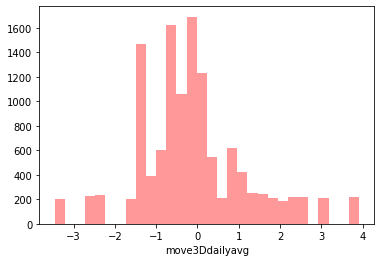

In [309]:
sns.distplot(data['move3Ddailyavg'], kde = False, color ='red', bins = 30)

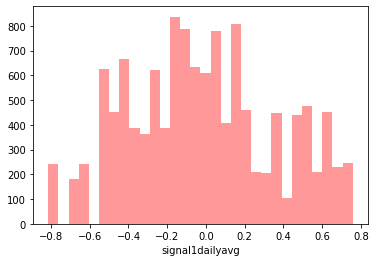

In [310]:
sns.distplot(data['signal1dailyavg'], kde = False, color ='red', bins = 30)

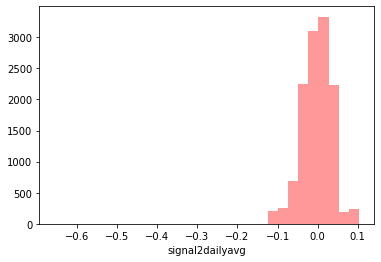

In [313]:
sns.distplot(data['signal2dailyavg'], kde = False, color ='red', bins = 30)

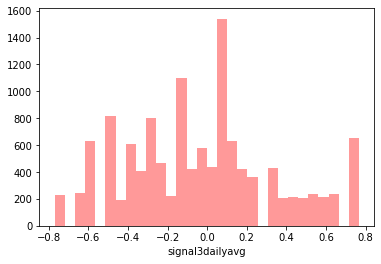

In [317]:
sns.distplot(data['signal3dailyavg'], kde = False, color ='red', bins = 30)

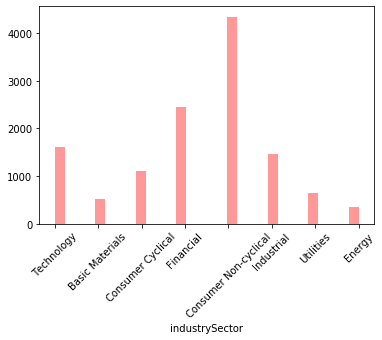

In [350]:
sns.distplot(data['industrySector'], kde = False, color ='red', bins = 30)
plt.tick_params(axis='x', which='major', labelsize=10, rotation=45)

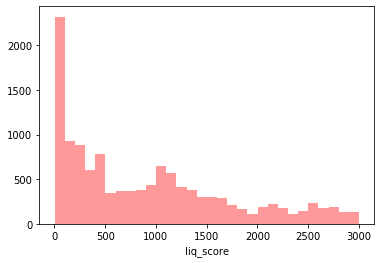

In [326]:
sns.distplot(data['liq_score'], kde = False, color ='red', bins = 30)

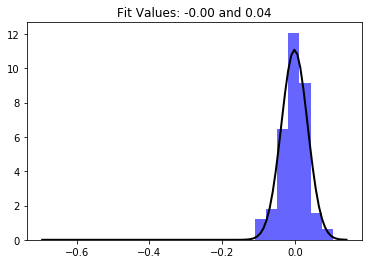

In [157]:
mu, std = norm.fit(data['signal2dailyavg'])
plt.hist(data['signal2dailyavg'], bins=25, density=True, alpha=0.6, color='b')
xmin, xmax = plt.xlim()
x = np.linspace(xmin, xmax, 100)

p = norm.pdf(x, mu, std)
plt.plot(x, p, 'k', linewidth=2)
title = "Fit Values: {:.2f} and {:.2f}".format(mu, std)
plt.title(title)
  
plt.show()

In [180]:
data.head()

,request_time,cusip,quantity_bonds,liq_score,mat_bucket,industrySector,ticker,move_1D,move_3D,signal1,...,signal3dailyavg,year,month,day,hour,minute,move1Ddailyavg,move3Ddailyavg,month_day,bondlength
0,1/4/2021 8:32,594918BY9,3000,170,B05,Technology,MSFT,0.139226,-1.705008,0.000000,...,0.513054,2021,1,04,8,32,0.906754,-0.052968,1-04,5
1,1/4/2021 12:58,37331NAK7,50,558,B10,Basic Materials,GP,0.169077,0.622054,0.790123,...,0.513054,2021,1,04,12,58,0.906754,-0.052968,1-04,10
2,1/4/2021 12:58,37331NAK7,50,558,B10,Basic Materials,GP,0.169077,0.622054,0.790123,...,0.513054,2021,1,04,12,58,0.906754,-0.052968,1-04,10
3,1/4/2021 13:07,500255AU8,50,347,B05,Consumer Cyclical,KSS,-1.917058,-2.578685,0.085106,...,0.513054,2021,1,04,13,7,0.906754,-0.052968,1-04,5
4,1/4/2021 13:14,594918BY9,80,170,B05,Technology,MSFT,0.190731,-1.134894,-0.708861,...,0.513054,2021,1,04,13,14,0.906754,-0.052968,1-04,5


# dist plots for move

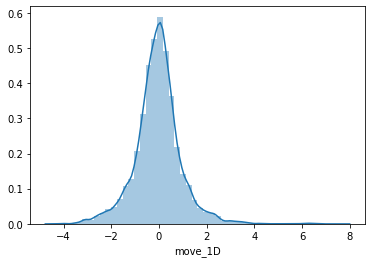

In [299]:
sns.distplot(data['move_1D']) #can filter data frame to get when sector is energy example AARON"S HELP!!!! see two graphs below this one

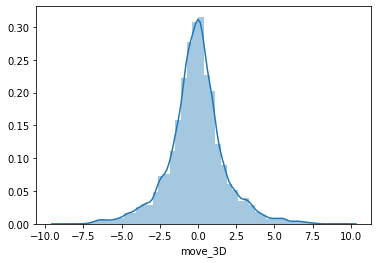

In [291]:
sns.distplot(data['move_3D'])

# dist plots for signals

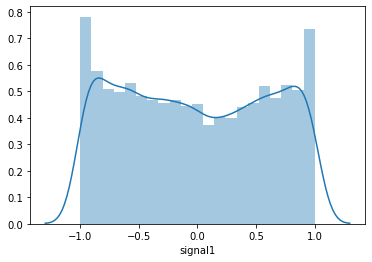

In [322]:
sns.distplot(data['signal1'])

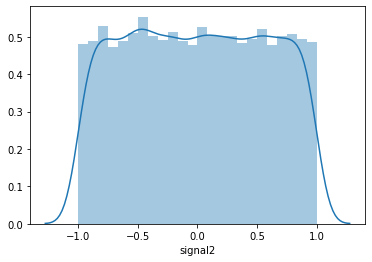

In [323]:
sns.distplot(data['signal2'])

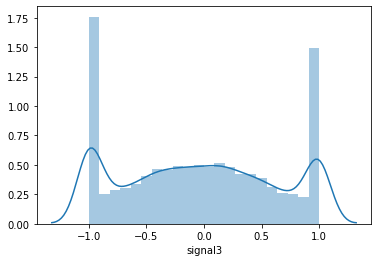

In [324]:
sns.distplot(data['signal3'])

### splitting  signal3 into 3 different bins to look at those humps seperately. is there a better correlation between the signal and that specific highly correlated bin?

In [77]:
bins = [-1.25, -0.75, 0.75, 1.25]
data['binnedsig3'] = pd.cut(data['signal3'], bins, labels = [1,2,3])
print(data)
data.head()

         request_time      cusip  quantity_bonds  liq_score mat_bucket  \
0       1/4/2021 8:32  594918BY9            3000        170        B05   
1      1/4/2021 12:58  37331NAK7              50        558        B10   
2      1/4/2021 12:58  37331NAK7              50        558        B10   
3      1/4/2021 13:07  500255AU8              50        347        B05   
4      1/4/2021 13:14  594918BY9              80        170        B05   
...               ...        ...             ...        ...        ...   
12494  4/1/2021 19:39  031162CR9            1340         47        B30   
12495  4/1/2021 19:39  126650CX6             118         13        B10   
12496  4/1/2021 19:49  260543DD2              10         49        B30   
12497  4/1/2021 20:36  378272AY4             130        181        B10   
12498  4/1/2021 20:51  05531FBH5             160       1676        B03   

              industrySector  ticker   move_1D   move_3D   signal1  ...  hour  \
0                 Technology  

,request_time,cusip,quantity_bonds,liq_score,mat_bucket,industrySector,ticker,move_1D,move_3D,signal1,...,hour,minute,month_day,bondlength,binned_quantity,binnedliq_score1,binnedliq_score,move1Ddailyavg,move3Ddailyavg,binnedsig3
0,1/4/2021 8:32,594918BY9,3000,170,B05,Technology,MSFT,0.139226,-1.705008,0.000000,...,8,32,1-04,5,4,1,1,0.906754,-0.052968,3
1,1/4/2021 12:58,37331NAK7,50,558,B10,Basic Materials,GP,0.169077,0.622054,0.790123,...,12,58,1-04,10,1,1,1,0.906754,-0.052968,2
2,1/4/2021 12:58,37331NAK7,50,558,B10,Basic Materials,GP,0.169077,0.622054,0.790123,...,12,58,1-04,10,1,1,1,0.906754,-0.052968,2
3,1/4/2021 13:07,500255AU8,50,347,B05,Consumer Cyclical,KSS,-1.917058,-2.578685,0.085106,...,13,7,1-04,5,1,1,1,0.906754,-0.052968,1
4,1/4/2021 13:14,594918BY9,80,170,B05,Technology,MSFT,0.190731,-1.134894,-0.708861,...,13,14,1-04,5,1,1,1,0.906754,-0.052968,2


In [264]:
data[(data['binnedsig3'] == 1)]

,request_time,cusip,quantity_bonds,liq_score,mat_bucket,industrySector,ticker,move_1D,move_3D,signal1,...,year,month,day,hour,minute,month_day,bondlength,binnedsig1,binnedsig3,binned_quantity
3,1/4/2021 13:07,500255AU8,50,347,B05,Consumer Cyclical,KSS,-1.917058,-2.578685,0.085106,...,2021,1,04,13,7,1-04,5,3,1,1
51,1/4/2021 15:27,500255AU8,150,347,B05,Consumer Cyclical,KSS,-1.298734,-3.347529,0.209790,...,2021,1,04,15,27,1-04,5,3,1,1
76,1/4/2021 16:10,06406RAE7,731,2167,B02,Financial,BK,-0.547723,-0.002719,-0.306723,...,2021,1,04,16,10,1-04,2,2,1,2
78,1/4/2021 16:10,06406RAE7,731,2167,B02,Financial,BK,-0.547723,-0.002719,-0.306723,...,2021,1,04,16,10,1-04,2,2,1,2
87,1/4/2021 16:11,500255AU8,4,347,B05,Consumer Cyclical,KSS,-0.665556,-2.702636,-0.160000,...,2021,1,04,16,11,1-04,5,2,1,1
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
12480,4/1/2021 18:51,22160KAP0,5,93,B10,Consumer Cyclical,COST,-0.340800,0.513650,0.056911,...,2021,3,01,18,51,4-01,10,3,1,1
12483,4/1/2021 18:58,05531FBH5,25,1676,B03,Financial,TFC,-0.852348,-1.446599,-0.501742,...,2021,3,01,18,58,4-01,3,1,1,1
12485,4/1/2021 19:03,61746BDJ2,18,417,B02,Financial,MS,-1.556978,-2.036486,-0.962825,...,2021,3,01,19,3,4-01,2,1,1,1
12492,4/1/2021 19:33,61746BDJ2,9,417,B02,Financial,MS,-1.314145,-1.992645,-0.962825,...,2021,3,01,19,33,4-01,2,1,1,1


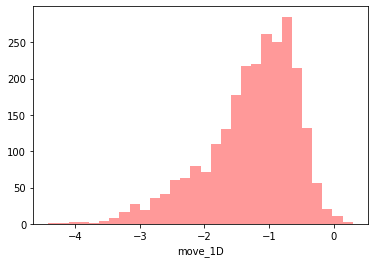

In [241]:
sns.distplot(data[(data['binnedsig3'] == 1)]['move_1D'], kde = False, color ='red', bins = 30) #(-1.25, -0.75]

In [242]:
data['move_1D'].corr(data['binnedsig3']==1)

-0.628979290407523

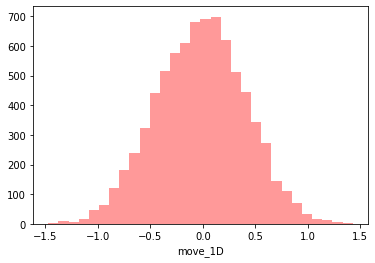

In [243]:
sns.distplot(data[(data['binnedsig3'] == 2)]['move_1D'], kde = False, color ='red', bins = 30) #(-0.75, 0.75]

In [244]:
data['move_1D'].corr(data['binnedsig3']==2)

0.030921153029121348

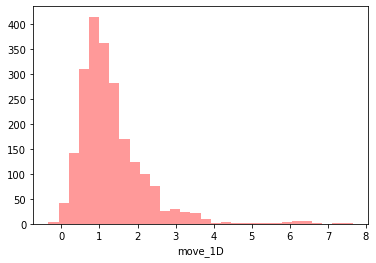

In [248]:
sns.distplot(data[(data['binnedsig3'] == 3)]['move_1D'], kde = False, color ='red', bins = 30) #(0.75, 1.25]

In [245]:
data['move_1D'].corr(data['binnedsig3']==3)

0.627298388370072

## ^What does this mean/do??? **found that in those humps, the corr between signal3 and move_1D is greater!

# look at dist plot for each sector

In [312]:
data['industrySector'].unique()

array(['Technology', 'Basic Materials', 'Consumer Cyclical', 'Financial',
       'Consumer Non-cyclical', 'Industrial', 'Utilities', 'Energy'],
      dtype=object)

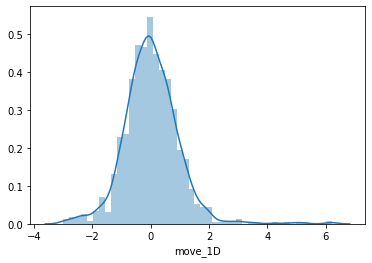

In [316]:
sns.distplot(data[data['industrySector'] == "Consumer Cyclical"]['move_1D']) #data set is now filtered by sector

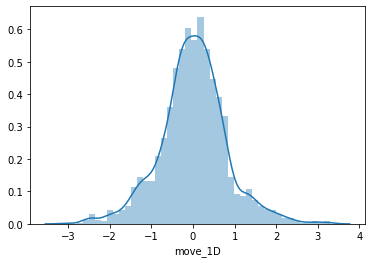

In [313]:
sns.distplot(data[data['industrySector'] == "Technology"]['move_1D']) #data set is now filtered by sector

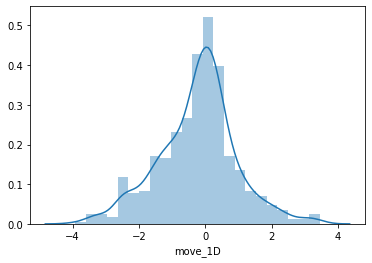

In [314]:
sns.distplot(data[data['industrySector'] == "Basic Materials"]['move_1D'])

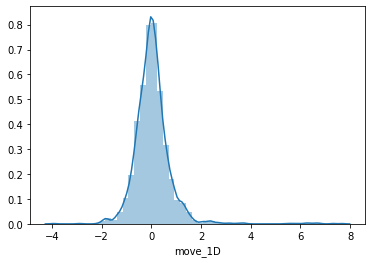

In [317]:
sns.distplot(data[data['industrySector'] == "Financial"]['move_1D'])

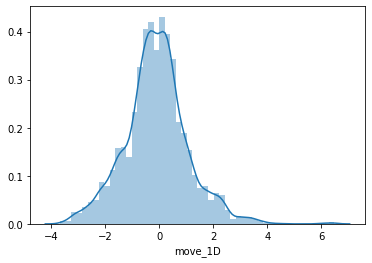

In [318]:
sns.distplot(data[data['industrySector'] == "Consumer Non-cyclical"]['move_1D'])

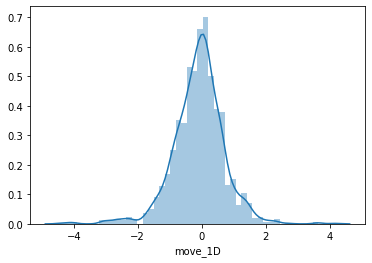

In [319]:
sns.distplot(data[data['industrySector'] == "Industrial"]['move_1D'])

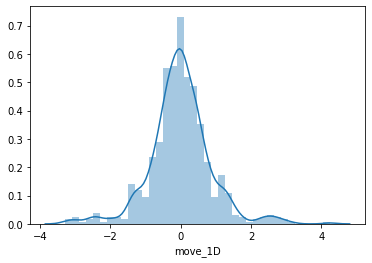

In [320]:
sns.distplot(data[data['industrySector'] == "Utilities"]['move_1D'])

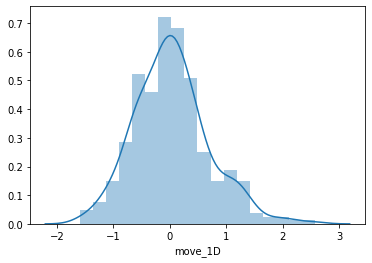

In [321]:
sns.distplot(data[data['industrySector'] == "Energy"]['move_1D']) 

In [332]:
data.head()

,request_time,cusip,quantity_bonds,liq_score,mat_bucket,industrySector,ticker,move_1D,move_3D,signal1,...,signal3dailyavg,year,month,day,hour,minute,move1Ddailyavg,move3Ddailyavg,month_day,bondlength
0,1/4/2021 8:32,594918BY9,3000,170,B05,Technology,MSFT,0.139226,-1.705008,0.000000,...,0.513054,2021,1,04,8,32,0.906754,-0.052968,1-04,5
1,1/4/2021 12:58,37331NAK7,50,558,B10,Basic Materials,GP,0.169077,0.622054,0.790123,...,0.513054,2021,1,04,12,58,0.906754,-0.052968,1-04,10
2,1/4/2021 12:58,37331NAK7,50,558,B10,Basic Materials,GP,0.169077,0.622054,0.790123,...,0.513054,2021,1,04,12,58,0.906754,-0.052968,1-04,10
3,1/4/2021 13:07,500255AU8,50,347,B05,Consumer Cyclical,KSS,-1.917058,-2.578685,0.085106,...,0.513054,2021,1,04,13,7,0.906754,-0.052968,1-04,5
4,1/4/2021 13:14,594918BY9,80,170,B05,Technology,MSFT,0.190731,-1.134894,-0.708861,...,0.513054,2021,1,04,13,14,0.906754,-0.052968,1-04,5


In [315]:
 #data[data["industrySector"] == "Financial"]["move_1D"].plot(kind="hist") #Histograms by sector

# look at dist plot for each bondlength

In [340]:
data['bondlength'].unique()

array([ 5, 10, 30,  2,  3], dtype=int64)

C:\ProgramData\Anaconda3\lib\site-packages\ipykernel_launcher.py:10: MatplotlibDeprecationWarning: 
The 'normed' kwarg was deprecated in Matplotlib 2.1 and will be removed in 3.1. Use 'density' instead.
  # Remove the CWD from sys.path while we load stuff.


Text(0.5, 1.0, 'Side-by-Side Histogram with Multiple bond maturities')

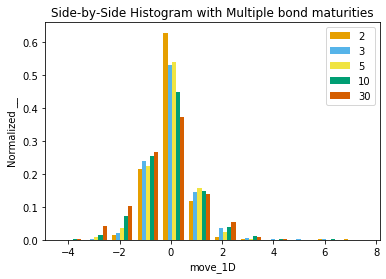

In [70]:
x1 = list(data[data['bondlength'] == 2]['move_1D'])
x2 = list(data[data['bondlength'] == 3]['move_1D'])
x3 = list(data[data['bondlength'] == 5]['move_1D'])
x4 = list(data[data['bondlength'] == 10]['move_1D'])
x5 = list(data[data['bondlength'] == 30]['move_1D'])

colors = ['#E69F00', '#56B4E9', '#F0E442', '#009E73', '#D55E00']
bondlengths = [2,3,5,10,30]
plt.hist([x1, x2, x3, x4, x5], bins = int(12/1), normed=True,
         color = colors, label=bondlengths)

plt.legend()
plt.xlabel('move_1D')
plt.ylabel('Normalized __')
plt.title('Side-by-Side Histogram with Multiple bond maturities')
# For the plot calls, we specify the binwidth by the number of bins. For this plot, I will use bins that are 5 minutes
#in length, which means that the number ofbins will be the range of the data (from -60 to 120 minutes) divided by the 
#binwidth, 5 minutes ( bins = int(180/5)).

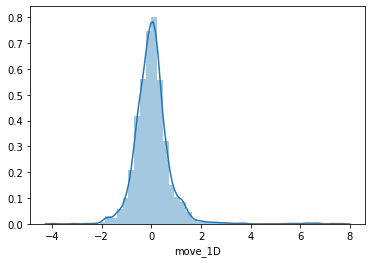

In [336]:
sns.distplot(data[data['bondlength'] == 2]['move_1D'])

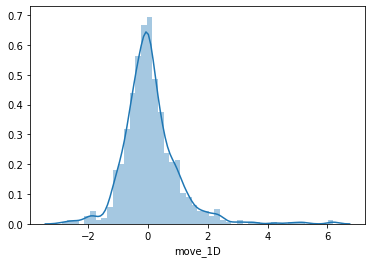

In [335]:
sns.distplot(data[data['bondlength'] == 3]['move_1D'])

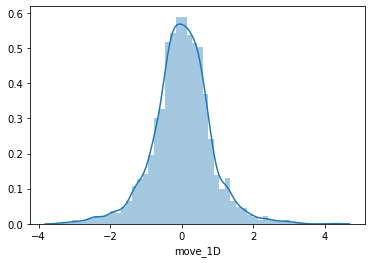

In [337]:
sns.distplot(data[data['bondlength'] == 5]['move_1D'])

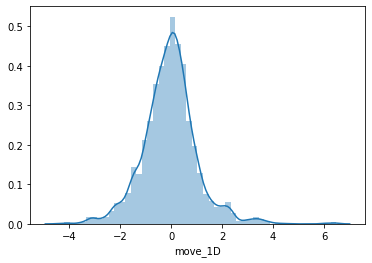

In [338]:
sns.distplot(data[data['bondlength'] == 10]['move_1D'])

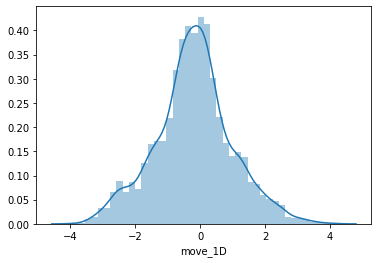

In [339]:
sns.distplot(data[data['bondlength'] == 30]['move_1D'])

In [ ]:
##!can repeat each of these bondlengt or insustry sectors for move_1D and move_3D but just focus on 1D and can always repeat the process with 3D later per Aaronh

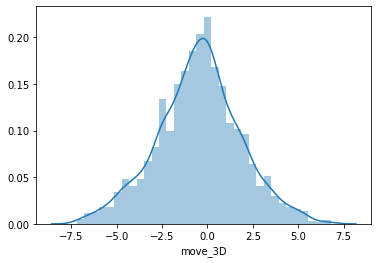

In [341]:
sns.distplot(data[data['bondlength'] == 30]['move_3D'])

# binning/buckets

In [78]:
bins = [-1, -0.5, 0, 0.5, 1]
data['binnedsig1'] = pd.cut(data['signal1'], bins, labels = [1,2,3,4])
print (data)
data.head()

         request_time      cusip  quantity_bonds  liq_score mat_bucket  \
0       1/4/2021 8:32  594918BY9            3000        170        B05   
1      1/4/2021 12:58  37331NAK7              50        558        B10   
2      1/4/2021 12:58  37331NAK7              50        558        B10   
3      1/4/2021 13:07  500255AU8              50        347        B05   
4      1/4/2021 13:14  594918BY9              80        170        B05   
...               ...        ...             ...        ...        ...   
12494  4/1/2021 19:39  031162CR9            1340         47        B30   
12495  4/1/2021 19:39  126650CX6             118         13        B10   
12496  4/1/2021 19:49  260543DD2              10         49        B30   
12497  4/1/2021 20:36  378272AY4             130        181        B10   
12498  4/1/2021 20:51  05531FBH5             160       1676        B03   

              industrySector  ticker   move_1D   move_3D   signal1  ...  \
0                 Technology    MSFT

,request_time,cusip,quantity_bonds,liq_score,mat_bucket,industrySector,ticker,move_1D,move_3D,signal1,...,minute,month_day,bondlength,binned_quantity,binnedliq_score1,binnedliq_score,move1Ddailyavg,move3Ddailyavg,binnedsig3,binnedsig1
0,1/4/2021 8:32,594918BY9,3000,170,B05,Technology,MSFT,0.139226,-1.705008,0.000000,...,32,1-04,5,4,1,1,0.906754,-0.052968,3,2
1,1/4/2021 12:58,37331NAK7,50,558,B10,Basic Materials,GP,0.169077,0.622054,0.790123,...,58,1-04,10,1,1,1,0.906754,-0.052968,2,4
2,1/4/2021 12:58,37331NAK7,50,558,B10,Basic Materials,GP,0.169077,0.622054,0.790123,...,58,1-04,10,1,1,1,0.906754,-0.052968,2,4
3,1/4/2021 13:07,500255AU8,50,347,B05,Consumer Cyclical,KSS,-1.917058,-2.578685,0.085106,...,7,1-04,5,1,1,1,0.906754,-0.052968,1,3
4,1/4/2021 13:14,594918BY9,80,170,B05,Technology,MSFT,0.190731,-1.134894,-0.708861,...,14,1-04,5,1,1,1,0.906754,-0.052968,2,1


In [199]:
data['binnedsig1'].dtypes

CategoricalDtype(categories=[1, 2, 3, 4], ordered=True)

In [101]:
data[(data['binnedsig1'] == 1)] 

,request_time,cusip,quantity_bonds,liq_score,mat_bucket,industrySector,ticker,move_1D,move_3D,signal1,...,signal2dailyavg,signal3dailyavg,year,month,day,hour,minute,month_day,bondlength,binnedsig1
4,1/4/2021 13:14,594918BY9,80,170,B05,Technology,MSFT,0.190731,-1.134894,-0.708861,...,0.079645,0.513054,2021,1,04,13,14,1-04,5,1
10,1/4/2021 13:54,78015K7D0,200,2758,B02,Financial,RY,0.262199,0.450798,-0.969027,...,0.079645,0.513054,2021,1,04,13,54,1-04,2,1
25,1/4/2021 14:36,46625HJH4,396,548,B02,Financial,JPM,-0.053200,-0.427475,-0.597786,...,0.079645,0.513054,2021,1,04,14,36,1-04,2,1
26,1/4/2021 14:36,46625HJH4,396,548,B02,Financial,JPM,-0.053200,-0.427475,-0.597786,...,0.079645,0.513054,2021,1,04,14,36,1-04,2,1
30,1/4/2021 14:51,594918BY9,500,170,B05,Technology,MSFT,0.332827,-1.264738,-0.743697,...,0.079645,0.513054,2021,1,04,14,51,1-04,5,1
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
12493,4/1/2021 19:38,126650CX6,2,13,B10,Consumer Non-cyclical,CVS,1.419900,3.291750,-0.618182,...,-0.013671,-0.134084,2021,3,01,19,38,4-01,10,1
12495,4/1/2021 19:39,126650CX6,118,13,B10,Consumer Non-cyclical,CVS,1.419900,3.291750,-0.618182,...,-0.013671,-0.134084,2021,3,01,19,39,4-01,10,1
12496,4/1/2021 19:49,260543DD2,10,49,B30,Basic Materials,DOW,0.314750,2.243250,-0.777778,...,-0.013671,-0.134084,2021,3,01,19,49,4-01,30,1
12497,4/1/2021 20:36,378272AY4,130,181,B10,Basic Materials,GLENLN,0.071282,0.770356,-0.996364,...,-0.013671,-0.134084,2021,3,01,20,36,4-01,10,1


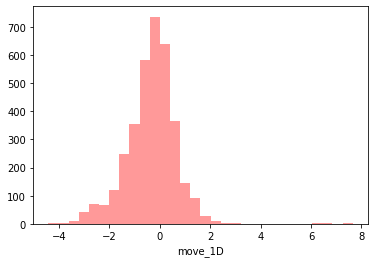

In [200]:
sns.distplot(data[(data['binnedsig1'] == 1)]['move_1D'], kde = False, color ='red', bins = 30) #(-1.0, -0.5]

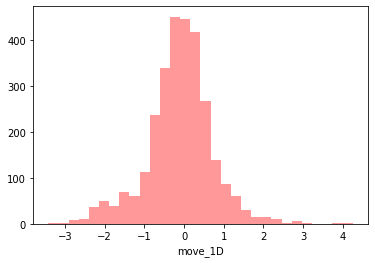

In [106]:
sns.distplot(data[(data['binnedsig1'] == 2)]['move_1D'], kde = False, color ='red', bins = 30) #(-0.5, 0.0]

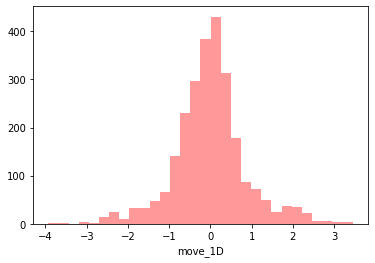

In [134]:
sns.distplot(data[(data['binnedsig1'] == 3)]['move_1D'], kde = False, color ='red', bins = 30) #(0.0, 0.5]

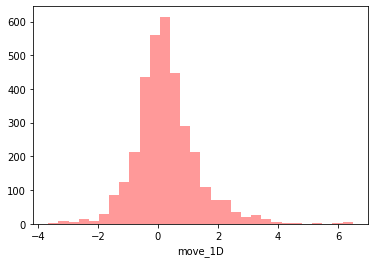

In [135]:
sns.distplot(data[(data['binnedsig1'] == 4)]['move_1D'], kde = False, color ='red', bins = 30) #(0.5, 1.0]

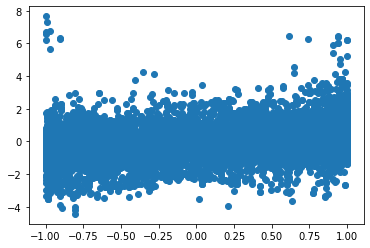

In [97]:
plt.scatter(data['signal1'], data['move_1D'])

In [137]:
#fig,ax=plt.subplots()
#sns.lineplot(x=data['binnedsig1'], y=data['move_1D'])
## sns.lineplot(x=data['signal1'], y=data['signal2'])
#plt.show()

### looking at what sector is the highest in that signal category

In [222]:
data['industrySector'].unique()

array(['Technology', 'Basic Materials', 'Consumer Cyclical', 'Financial',
       'Consumer Non-cyclical', 'Industrial', 'Utilities', 'Energy'],
      dtype=object)

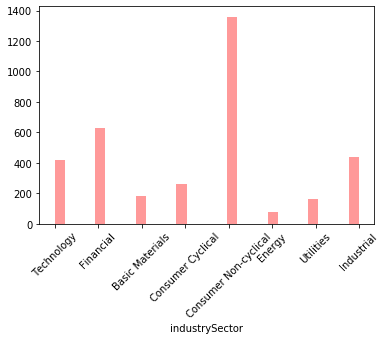

In [345]:
sns.distplot(data[(data['binnedsig1'] == 1)]['industrySector'], kde = False, color ='red', bins = 30) #(-1.0, -0.5]
plt.tick_params(axis='x', which='major', labelsize=10, rotation=45) #consumer non-cyclical = highest

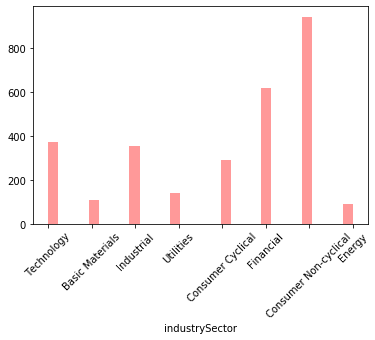

In [346]:
sns.distplot(data[(data['binnedsig1'] == 2)]['industrySector'], kde = False, color ='red', bins = 30)
plt.tick_params(axis='x', which='major', labelsize=10, rotation=45) #consumer non-cyclical = highest

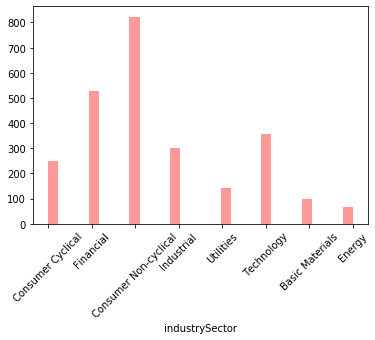

In [348]:
sns.distplot(data[(data['binnedsig1'] == 3)]['industrySector'], kde = False, color ='red', bins = 30)
plt.tick_params(axis='x', which='major', labelsize=10, rotation=45) #consumer non-cyclical = highest

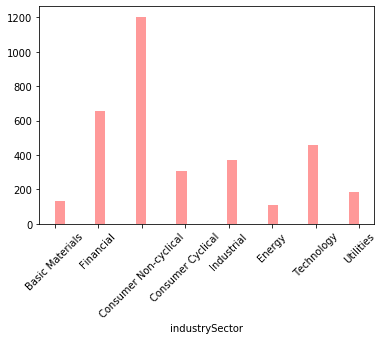

In [349]:
sns.distplot(data[(data['binnedsig1'] == 4)]['industrySector'], kde = False, color ='red', bins = 30)
plt.tick_params(axis='x', which='major', labelsize=10, rotation=45)

In [286]:
data['industrySector'].unique()

array(['Technology', 'Basic Materials', 'Consumer Cyclical', 'Financial',
       'Consumer Non-cyclical', 'Industrial', 'Utilities', 'Energy'],
      dtype=object)

# correlation matrix/heat map

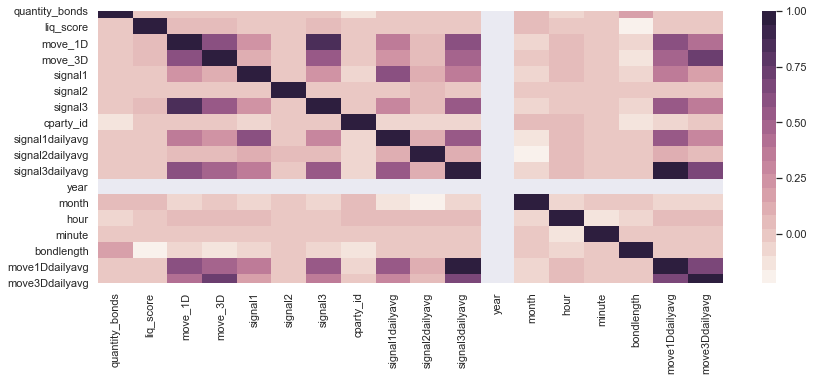

In [287]:
# Finding and plotting the correlation for
# the independent variables

# adjust plot
sns.set(rc={'figure.figsize': (14, 5)})

# assign data
ind_var = ['Technology', 'Basic Materials', 'Consumer Cyclical', 'Financial',
       'Consumer Non-cyclical', 'Industrial', 'Utilities', 'Energy']

# illustrate heat map.
sns.heatmap(data.select_dtypes(include='number').corr(), cmap=sns.cubehelix_palette(20, light=0.95, dark=0.15))


# Machine Modeling

In [226]:
data.head()

,request_time,cusip,quantity_bonds,liq_score,mat_bucket,industrySector,ticker,move_1D,move_3D,signal1,...,signal2dailyavg,signal3dailyavg,year,month,day,hour,minute,month_day,bondlength,binnedsig1
0,1/4/2021 8:32,594918BY9,3000,170,B05,Technology,MSFT,0.139226,-1.705008,0.000000,...,0.079645,0.513054,2021,1,04,8,32,1-04,5,2
1,1/4/2021 12:58,37331NAK7,50,558,B10,Basic Materials,GP,0.169077,0.622054,0.790123,...,0.079645,0.513054,2021,1,04,12,58,1-04,10,4
2,1/4/2021 12:58,37331NAK7,50,558,B10,Basic Materials,GP,0.169077,0.622054,0.790123,...,0.079645,0.513054,2021,1,04,12,58,1-04,10,4
3,1/4/2021 13:07,500255AU8,50,347,B05,Consumer Cyclical,KSS,-1.917058,-2.578685,0.085106,...,0.079645,0.513054,2021,1,04,13,7,1-04,5,3
4,1/4/2021 13:14,594918BY9,80,170,B05,Technology,MSFT,0.190731,-1.134894,-0.708861,...,0.079645,0.513054,2021,1,04,13,14,1-04,5,1


C:\ProgramData\Anaconda3\lib\site-packages\numpy\lib\histograms.py:824: RuntimeWarning: invalid value encountered in greater_equal
  keep = (tmp_a >= first_edge)
C:\ProgramData\Anaconda3\lib\site-packages\numpy\lib\histograms.py:825: RuntimeWarning: invalid value encountered in less_equal
  keep &= (tmp_a <= last_edge)


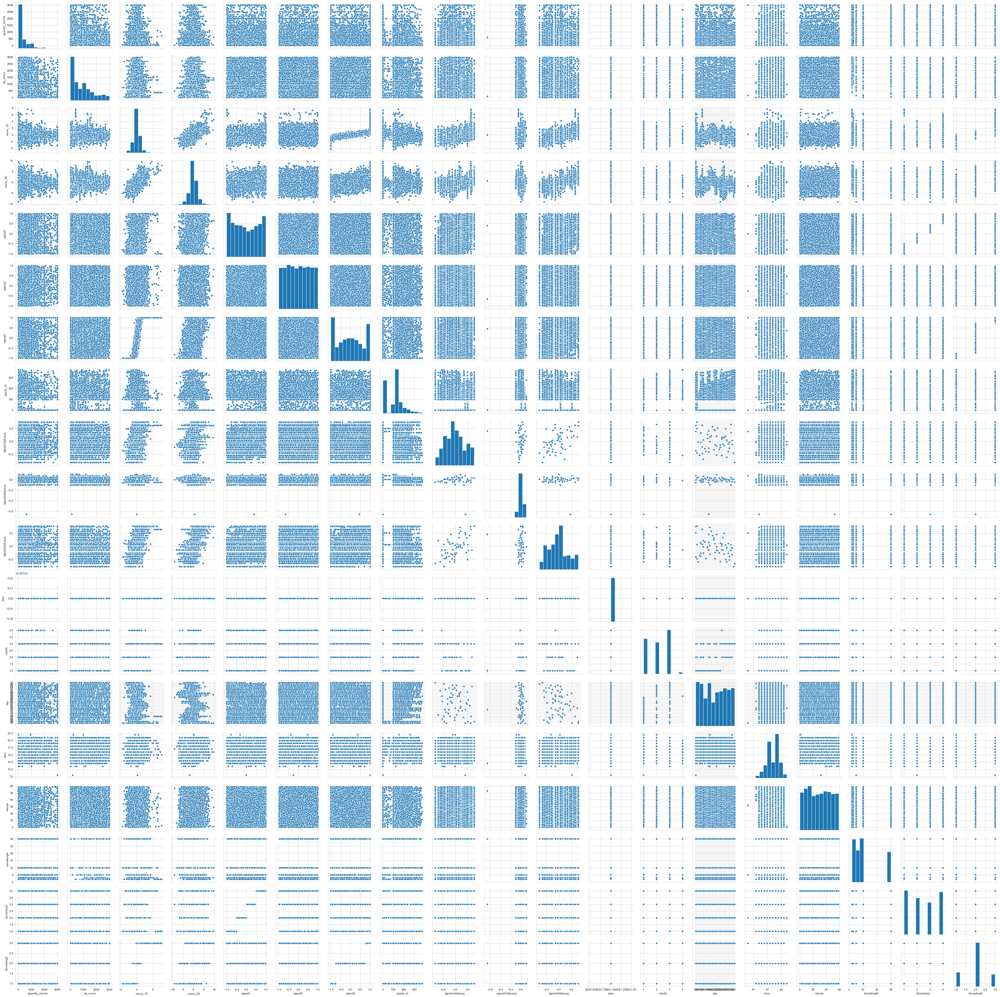

In [236]:
sns.pairplot(data)

In [108]:
data.columns.values.tolist()

['request_time',
 'cusip',
 'quantity_bonds',
 'liq_score',
 'mat_bucket',
 'industrySector',
 'ticker',
 'move_1D',
 'move_3D',
 'signal1',
 'signal2',
 'signal3',
 'cparty_id',
 'rqdatetime',
 'rfqdate',
 'signal1dailyavg',
 'signal2dailyavg',
 'signal3dailyavg',
 'year',
 'month',
 'day',
 'hour',
 'minute',
 'month_day',
 'bondlength',
 'binnedsig1']

In [63]:
#cfm = columns for modeling
cfm = data[['cusip','industrySector','ticker','bondlength', 'quantity_bonds','liq_score','move_1D','move_3D','signal1', 'signal2', 'signal3','rqdatetime','month']]

In [64]:
cfm.head()

,cusip,industrySector,ticker,bondlength,quantity_bonds,liq_score,move_1D,move_3D,signal1,signal2,signal3,rqdatetime,month
0,594918BY9,Technology,MSFT,5,3000,170,0.139226,-1.705008,0.000000,-0.255871,1.000000,2021-01-04 08:32:00,1
1,37331NAK7,Basic Materials,GP,10,50,558,0.169077,0.622054,0.790123,0.842762,-0.208001,2021-01-04 12:58:00,1
2,37331NAK7,Basic Materials,GP,10,50,558,0.169077,0.622054,0.790123,0.820288,-0.469933,2021-01-04 12:58:00,1
3,500255AU8,Consumer Cyclical,KSS,5,50,347,-1.917058,-2.578685,0.085106,0.506236,-1.000000,2021-01-04 13:07:00,1
4,594918BY9,Technology,MSFT,5,80,170,0.190731,-1.134894,-0.708861,-0.751947,-0.260192,2021-01-04 13:14:00,1


In [81]:
cfm_withavgs = data[['cusip','industrySector','ticker','bondlength', 'quantity_bonds','liq_score','move_1D','move_3D','signal1', 'signal1dailyavg', 'signal2', 'signal2dailyavg','signal3','signal3dailyavg','rqdatetime','month']]

In [73]:
import statsmodels.api as sm
import statsmodels.formula.api as smf

In [65]:
%matplotlib inline
rcParams['figure.figsize']= 5, 4
sns.set_style('whitegrid')

NameError: name 'rcParams' is not defined

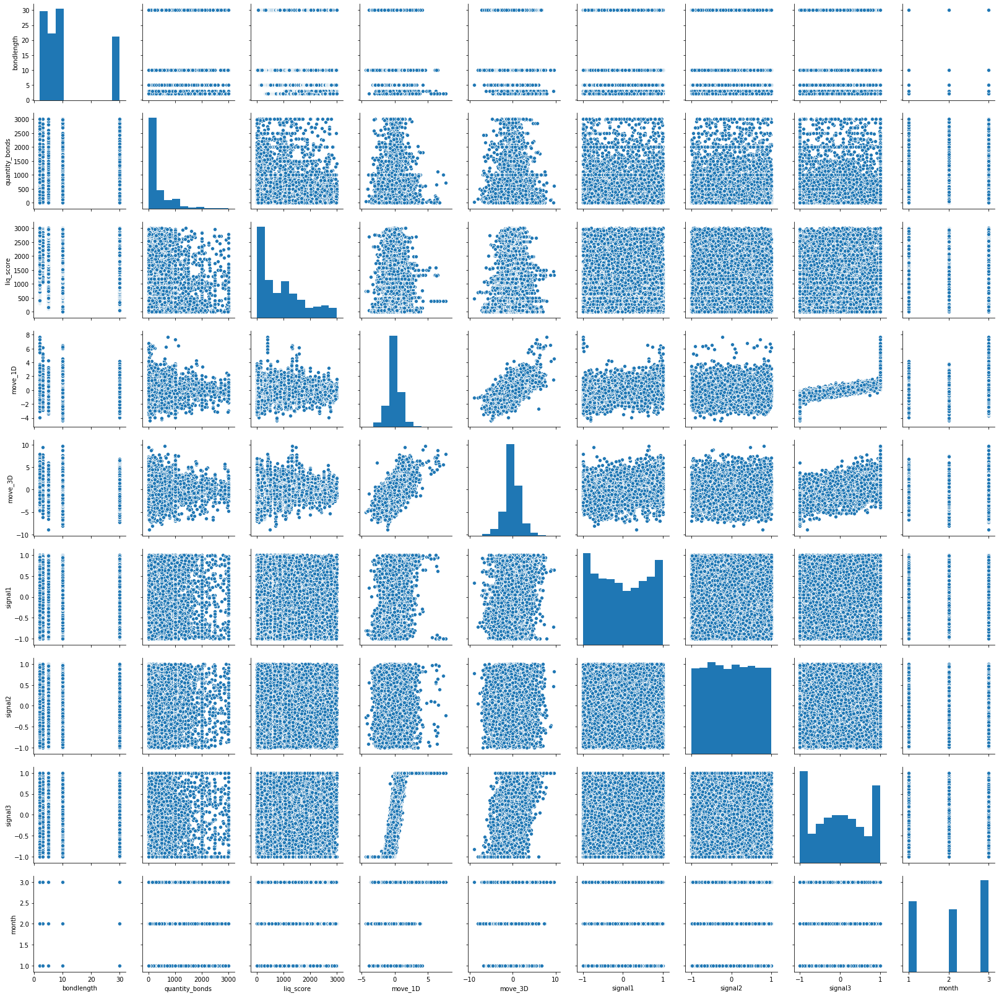

In [233]:
sns.pairplot(cfm)

In [234]:
cfm.corr()

,bondlength,quantity_bonds,liq_score,move_1D,move_3D,signal1,signal2,signal3,month
bondlength,1.000000,0.164093,-0.219010,-0.086678,-0.115108,-0.058467,0.003192,-0.075809,0.005389
quantity_bonds,0.164093,1.000000,-0.008980,-0.008773,-0.006839,-0.002547,0.019368,-0.000418,0.036166
liq_score,-0.219010,-0.008980,1.000000,0.038583,0.070908,0.003921,-0.004713,0.043908,0.025743
move_1D,-0.086678,-0.008773,0.038583,1.000000,0.632001,0.251032,0.010462,0.838313,-0.037000
move_3D,-0.115108,-0.006839,0.070908,0.632001,1.000000,0.125685,-0.002943,0.536652,-0.028875
signal1,-0.058467,-0.002547,0.003921,0.251032,0.125685,1.000000,0.005255,0.223244,-0.074694
signal2,0.003192,0.019368,-0.004713,0.010462,-0.002943,0.005255,1.000000,0.008928,-0.011116
signal3,-0.075809,-0.000418,0.043908,0.838313,0.536652,0.223244,0.008928,1.000000,-0.037381
month,0.005389,0.036166,0.025743,-0.037000,-0.028875,-0.074694,-0.011116,-0.037381,1.000000


In [294]:
cfm['signal3']

0        1.000000
1       -0.208001
2       -0.469933
3       -1.000000
4       -0.260192
           ...   
12494   -0.247929
12495    1.000000
12496    0.091794
12497    0.541421
12498   -1.000000
Name: signal3, Length: 12499, dtype: float64

## wanting to look at linear regression of signal3 & move_1D when signal3 = -1 or 1


In [ ]:
box plot

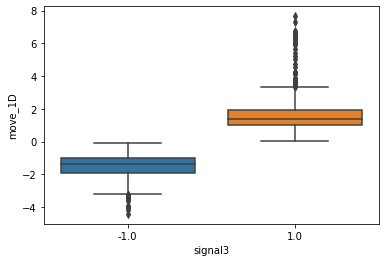

In [94]:
sns.boxplot(x=sig3atposandneg['signal3'], y=sig3atposandneg['move_1D'])

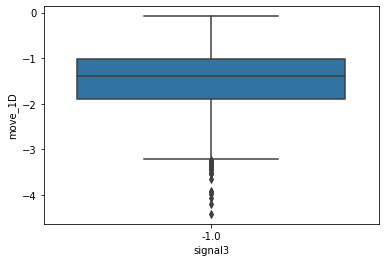

In [95]:
sns.boxplot(x=sig3negone['signal3'], y=sig3negone['move_1D'])

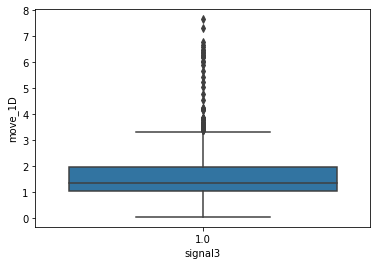

In [96]:
sns.boxplot(x=sig3posone['signal3'], y=sig3posone['move_1D'])

In [69]:
cfm[(cfm['signal3'] == -1) | (cfm['signal3'] == 1)].sort_values('signal3')

,cusip,industrySector,ticker,bondlength,quantity_bonds,liq_score,move_1D,move_3D,signal1,signal2,signal3,rqdatetime,month
7273,031162CR9,Consumer Non-cyclical,AMGN,30,65,46,-1.552125,-0.002500,-0.968085,0.339081,-1.0,2021-02-25 17:05:00,2
8974,341081FZ5,Utilities,NEE,5,774,699,-3.199223,-2.388995,0.875000,0.509204,-1.0,2021-03-09 21:02:00,3
8972,126650CX6,Consumer Non-cyclical,CVS,10,80,12,-1.392025,-1.148950,0.625850,0.620899,-1.0,2021-03-09 20:55:00,3
8971,594918BB9,Technology,MSFT,5,170,1027,-1.956875,-0.737625,-0.122951,0.588426,-1.0,2021-03-09 20:55:00,3
8968,61746BDJ2,Financial,MS,2,70,503,-0.935209,-2.190264,0.919414,-0.512587,-1.0,2021-03-09 20:54:00,3
...,...,...,...,...,...,...,...,...,...,...,...,...,...
8345,341081FQ5,Utilities,NEE,30,1000,869,1.433150,1.415000,0.791489,-0.501310,1.0,2021-03-05 16:39:00,3
8344,126650CN8,Consumer Non-cyclical,CVS,30,1000,206,2.474250,0.769500,0.567901,0.664834,1.0,2021-03-05 16:39:00,3
8343,031162CR9,Consumer Non-cyclical,AMGN,30,1000,57,1.029750,0.316500,-0.128205,-0.832401,1.0,2021-03-05 16:39:00,3
8341,776743AD8,Technology,ROP,5,8,1711,2.502018,4.068114,0.245552,-0.919902,1.0,2021-03-05 16:32:00,3


In [90]:
sig3atposandneg = cfm[(cfm['signal3'] == -1) | (cfm['signal3'] == 1)]

In [71]:
sig3atposandneg

,cusip,industrySector,ticker,bondlength,quantity_bonds,liq_score,move_1D,move_3D,signal1,signal2,signal3,rqdatetime,month
0,594918BY9,Technology,MSFT,5,3000,170,0.139226,-1.705008,0.000000,-0.255871,1.0,2021-01-04 08:32:00,1
3,500255AU8,Consumer Cyclical,KSS,5,50,347,-1.917058,-2.578685,0.085106,0.506236,-1.0,2021-01-04 13:07:00,1
5,260543DD2,Basic Materials,DOW,30,100,71,2.591040,1.853324,-0.430464,-0.239511,1.0,2021-01-04 13:41:00,1
8,22160KAP0,Consumer Cyclical,COST,10,200,297,1.020260,0.809400,0.221622,-0.333363,1.0,2021-01-04 13:53:00,1
9,22160KAP0,Consumer Cyclical,COST,10,200,297,1.020260,0.809400,0.221622,0.285617,1.0,2021-01-04 13:53:00,1
...,...,...,...,...,...,...,...,...,...,...,...,...,...
12491,126650CX6,Consumer Non-cyclical,CVS,10,20,13,1.300825,3.196100,-0.618182,0.102180,1.0,2021-04-01 19:28:00,3
12492,61746BDJ2,Financial,MS,2,9,417,-1.314145,-1.992645,-0.962825,-0.886175,-1.0,2021-04-01 19:33:00,3
12493,126650CX6,Consumer Non-cyclical,CVS,10,2,13,1.419900,3.291750,-0.618182,0.086420,1.0,2021-04-01 19:38:00,3
12495,126650CX6,Consumer Non-cyclical,CVS,10,118,13,1.419900,3.291750,-0.618182,0.641902,1.0,2021-04-01 19:39:00,3


In [74]:
x = sig3atposandneg['signal3']
y = sig3atposandneg['move_1D']

x = sm.add_constant(x)

model = sm.OLS(y, x).fit()
predictions = model.predict(x) 

print_model = model.summary()
print(print_model) #the variation of move_1D is explained 70.3% of the time by signal3

                            OLS Regression Results                            
Dep. Variable:                move_1D   R-squared:                       0.791
Model:                            OLS   Adj. R-squared:                  0.791
Method:                 Least Squares   F-statistic:                 1.213e+04
Date:                Mon, 27 Jun 2022   Prob (F-statistic):               0.00
Time:                        13:25:16   Log-Likelihood:                -3818.1
No. Observations:                3209   AIC:                             7640.
Df Residuals:                    3207   BIC:                             7652.
Df Model:                           1                                         
Covariance Type:            nonrobust                                         
                 coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------
const          0.0348      0.014      2.471      0.0

C:\ProgramData\Anaconda3\lib\site-packages\numpy\core\fromnumeric.py:2389: FutureWarning: Method .ptp is deprecated and will be removed in a future version. Use numpy.ptp instead.
  return ptp(axis=axis, out=out, **kwargs)


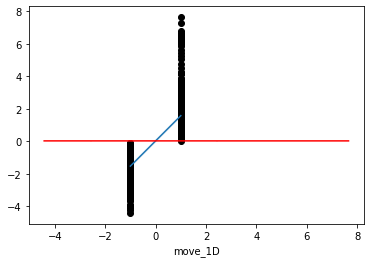

In [75]:
sns.lineplot(x=sig3atposandneg['signal3'], y=predictions)
sns.lineplot(x=sig3atposandneg['move_1D'], y=0.0348, color = 'red')
plt.scatter(sig3atposandneg['signal3'], sig3atposandneg['move_1D'], color = 'black')

In [85]:
sig3negone = cfm[(cfm['signal3'] == -1)]
sig3negone 

,cusip,industrySector,ticker,bondlength,quantity_bonds,liq_score,move_1D,move_3D,signal1,signal2,signal3,rqdatetime,month
3,500255AU8,Consumer Cyclical,KSS,5,50,347,-1.917058,-2.578685,0.085106,0.506236,-1.0,2021-01-04 13:07:00,1
51,500255AU8,Consumer Cyclical,KSS,5,150,347,-1.298734,-3.347529,0.209790,0.040200,-1.0,2021-01-04 15:27:00,1
87,500255AU8,Consumer Cyclical,KSS,5,4,347,-0.665556,-2.702636,-0.160000,0.280242,-1.0,2021-01-04 16:11:00,1
334,500255AU8,Consumer Cyclical,KSS,5,2,352,-0.745515,-0.618107,-0.070234,0.966675,-1.0,2021-01-05 17:05:00,1
366,244199BH7,Industrial,DE,5,31,655,-0.595832,-1.387349,0.148148,-0.452865,-1.0,2021-01-05 18:10:00,1
...,...,...,...,...,...,...,...,...,...,...,...,...,...
12470,61746BDJ2,Financial,MS,2,21,417,-1.374325,-1.735400,-0.940299,-0.467280,-1.0,2021-04-01 18:14:00,3
12483,05531FBH5,Financial,TFC,3,25,1676,-0.852348,-1.446599,-0.501742,-0.560018,-1.0,2021-04-01 18:58:00,3
12485,61746BDJ2,Financial,MS,2,18,417,-1.556978,-2.036486,-0.962825,-0.037614,-1.0,2021-04-01 19:03:00,3
12492,61746BDJ2,Financial,MS,2,9,417,-1.314145,-1.992645,-0.962825,-0.886175,-1.0,2021-04-01 19:33:00,3


In [84]:
 sig3posone= cfm[(cfm['signal3'] == 1)]

In [86]:
x = sig3negone['signal3']
y = sig3negone['move_1D']

x = sm.add_constant(x)

model = sm.OLS(y, x).fit()
predictions = model.predict(x) 

print_model = model.summary()
print(print_model) #the variation of move_1D is explained 70.3% of the time by signal3

                            OLS Regression Results                            
Dep. Variable:                move_1D   R-squared:                       0.000
Model:                            OLS   Adj. R-squared:                  0.000
Method:                 Least Squares   F-statistic:                       inf
Date:                Mon, 27 Jun 2022   Prob (F-statistic):                nan
Time:                        13:55:17   Log-Likelihood:                -1793.7
No. Observations:                1738   AIC:                             3589.
Df Residuals:                    1737   BIC:                             3595.
Df Model:                           0                                         
Covariance Type:            nonrobust                                         
                 coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------
signal3        1.5170      0.016     93.092      0.0

C:\ProgramData\Anaconda3\lib\site-packages\statsmodels\regression\linear_model.py:1657: RuntimeWarning: divide by zero encountered in double_scalars
  return self.ess/self.df_model


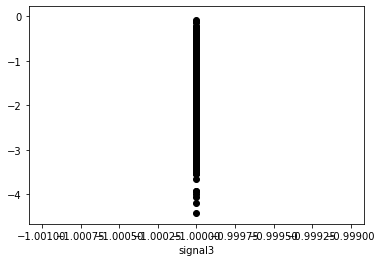

In [87]:
sns.lineplot(x=sig3negone['signal3'], y=predictions)
sns.lineplot(x=sig3negone['signal3'], y=0, color = 'red')
plt.scatter(sig3negone['signal3'], y = sig3negone['move_1D'], color = 'black')

In [88]:
x = sig3posone['signal3']
y = sig3posone['move_1D']

x = sm.add_constant(x)

model = sm.OLS(y, x).fit()
predictions = model.predict(x) 

print_model = model.summary()
print(print_model) #the variation of move_1D is explained 70.3% of the time by signal3

                            OLS Regression Results                            
Dep. Variable:                move_1D   R-squared:                      -0.000
Model:                            OLS   Adj. R-squared:                 -0.000
Method:                 Least Squares   F-statistic:                      -inf
Date:                Mon, 27 Jun 2022   Prob (F-statistic):                nan
Time:                        13:56:44   Log-Likelihood:                -1954.2
No. Observations:                1471   AIC:                             3910.
Df Residuals:                    1470   BIC:                             3916.
Df Model:                           0                                         
Covariance Type:            nonrobust                                         
                 coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------
signal3        1.5867      0.024     66.591      0.0

## wanting to look at linear regression of signal3 & move_1D but not when signal3 = -1 or 1

In [302]:
type(cfm)

pandas.core.frame.DataFrame

In [77]:
cfm[(cfm['signal3'] != -1) & (cfm['signal3'] != 1)].sort_values('signal3') #deleted rows when signal3 = -1 or 1

,cusip,industrySector,ticker,bondlength,quantity_bonds,liq_score,move_1D,move_3D,signal1,signal2,signal3,rqdatetime,month
3600,500255AU8,Consumer Cyclical,KSS,5,494,379,-0.426973,-0.526764,-0.135314,-0.592803,-0.999453,2021-01-28 18:13:00,1
1391,126650CX6,Consumer Non-cyclical,CVS,10,500,5,-1.315875,-0.801200,-0.292135,-0.001681,-0.999358,2021-01-12 17:52:00,1
11958,341081FZ5,Utilities,NEE,5,20,860,-1.202350,-0.253150,0.189831,0.822684,-0.999184,2021-03-30 16:37:00,3
4168,260543DD2,Basic Materials,DOW,30,50,60,-0.983500,-6.720500,0.340426,-0.117955,-0.999179,2021-02-02 15:56:00,2
4132,594918BC7,Technology,MSFT,10,150,2321,-0.892929,-1.536666,0.497942,-0.081282,-0.998811,2021-02-02 14:36:00,2
...,...,...,...,...,...,...,...,...,...,...,...,...,...
1376,776743AD8,Technology,ROP,5,500,1873,0.975694,2.060395,-0.949821,0.067754,0.999345,2021-01-12 17:31:00,1
5096,46625HJH4,Financial,JPM,2,24,503,0.669878,1.009234,-0.850847,-0.872078,0.999503,2021-02-08 19:55:00,2
2052,444859BF8,Consumer Non-cyclical,HUM,5,700,950,1.300600,0.214650,-0.066667,0.661280,0.999568,2021-01-15 19:50:00,1
3108,539830BB4,Industrial,LMT,30,1000,1101,0.682475,-0.972050,0.365741,0.885092,0.999609,2021-01-26 15:26:00,1


In [78]:
sig3betweenposandneg1 = cfm[(cfm['signal3'] != -1) & (cfm['signal3'] != 1)]

In [79]:
sig3betweenposandneg1 

,cusip,industrySector,ticker,bondlength,quantity_bonds,liq_score,move_1D,move_3D,signal1,signal2,signal3,rqdatetime,month
1,37331NAK7,Basic Materials,GP,10,50,558,0.169077,0.622054,0.790123,0.842762,-0.208001,2021-01-04 12:58:00,1
2,37331NAK7,Basic Materials,GP,10,50,558,0.169077,0.622054,0.790123,0.820288,-0.469933,2021-01-04 12:58:00,1
4,594918BY9,Technology,MSFT,5,80,170,0.190731,-1.134894,-0.708861,-0.751947,-0.260192,2021-01-04 13:14:00,1
6,46625HJH4,Financial,JPM,2,300,548,-0.220722,-0.515511,0.250000,0.545287,-0.305029,2021-01-04 13:52:00,1
7,46625HJH4,Financial,JPM,2,300,548,-0.220722,-0.515511,0.250000,0.679457,0.020637,2021-01-04 13:52:00,1
...,...,...,...,...,...,...,...,...,...,...,...,...,...
12489,539830BB4,Industrial,LMT,30,2000,1023,0.813404,2.205136,-0.953642,0.541605,0.597274,2021-04-01 19:10:00,3
12490,594918BY9,Technology,MSFT,5,5,156,-0.109675,-0.012402,-0.358650,0.953921,0.075365,2021-04-01 19:19:00,3
12494,031162CR9,Consumer Non-cyclical,AMGN,30,1340,47,0.232550,1.455575,0.238095,-0.961889,-0.247929,2021-04-01 19:39:00,3
12496,260543DD2,Basic Materials,DOW,30,10,49,0.314750,2.243250,-0.777778,0.875334,0.091794,2021-04-01 19:49:00,3


In [88]:
#first LinReg below but the one below this one is better!

In [289]:
x = sig3betweenposandneg1['signal3']
y = sig3betweenposandneg1['move_1D']

x = sm.add_constant(x)

model = sm.OLS(y, x).fit()
predictions = model.predict(x) 

print_model = model.summary()
print(print_model) #the variation of move_1D is explained 70.3% of the time by signal3

                            OLS Regression Results                            
Dep. Variable:                move_1D   R-squared:                       0.660
Model:                            OLS   Adj. R-squared:                  0.660
Method:                 Least Squares   F-statistic:                 1.805e+04
Date:                Fri, 24 Jun 2022   Prob (F-statistic):               0.00
Time:                        15:21:21   Log-Likelihood:                -1657.8
No. Observations:                9290   AIC:                             3320.
Df Residuals:                    9288   BIC:                             3334.
Df Model:                           1                                         
Covariance Type:            nonrobust                                         
                 coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------
const         -0.0090      0.003     -2.991      0.0

C:\ProgramData\Anaconda3\lib\site-packages\numpy\core\fromnumeric.py:2389: FutureWarning: Method .ptp is deprecated and will be removed in a future version. Use numpy.ptp instead.
  return ptp(axis=axis, out=out, **kwargs)


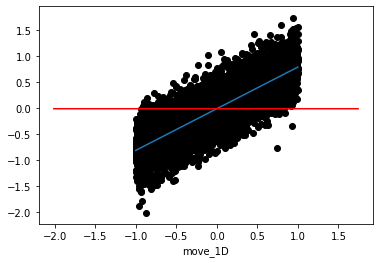

In [340]:
sns.lineplot(x=sig3betweenposandneg1['signal3'], y=predictions)
sns.lineplot(x=sig3betweenposandneg1['move_1D'], y=-0.0090, color = 'red')
plt.scatter(sig3betweenposandneg1['signal3'], sig3betweenposandneg1['move_1D'], color = 'black')

### linear regression of signal3 and move_1D 

In [309]:
X = cfm['signal3']
Y = cfm['move_1D']

X = sm.add_constant(X)

model = sm.OLS(Y, X).fit()
predictions = model.predict(X) 

print_model = model.summary()
print(print_model) #the variation of move_1D is explained 70.3% of the time by signal3

                            OLS Regression Results                            
Dep. Variable:                move_1D   R-squared:                       0.703
Model:                            OLS   Adj. R-squared:                  0.703
Method:                 Least Squares   F-statistic:                 2.955e+04
Date:                Thu, 23 Jun 2022   Prob (F-statistic):               0.00
Time:                        15:14:41   Log-Likelihood:                -9900.1
No. Observations:               12499   AIC:                         1.980e+04
Df Residuals:                   12497   BIC:                         1.982e+04
Df Model:                           1                                         
Covariance Type:            nonrobust                                         
                 coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------
const          0.0017      0.005      0.364      0.7

In [ ]:
#formula from above LinReg: move_1D = 1.2333 * signal3 +0.0017

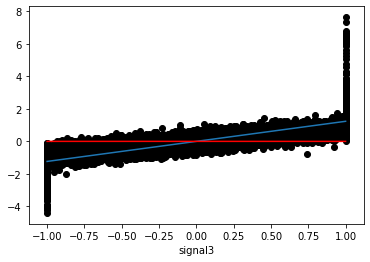

In [280]:
sns.lineplot(x=data['signal3'], y=predictions)
sns.lineplot(x=data['signal3'], y=.0017, color = 'red')
plt.scatter(data['signal3'], data['move_1D'], color = 'black')

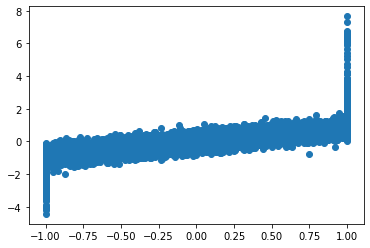

In [277]:
plt.scatter(data['signal3'], data['move_1D'])

In [278]:
predictions #signal 3 vs predict and signal3 vs actual move_1D

0        1.234999
1       -0.254776
2       -0.577806
3       -1.231514
4       -0.319141
           ...   
12494   -0.304018
12495    1.234999
12496    0.114948
12497    0.669453
12498   -1.231514
Length: 12499, dtype: float64

In [231]:
#Adj.R-squared = reflects the fit of the model. R-squared values range from 0 to 1, where a higher value
#generally indicates a better fit, assuming certain conditions are met.

In [232]:
#const coefficient is your Y-intercept.
#signal3 coeff prepresents the change in the ouput Y due to a change of one unit in the signal3

In [233]:
#std err reflects the level of accuracy of the coefficients. The lower it is, the higher is the level of accuracy
#P >|t| is your p-value. A p-value of less than 0.05 is considered to be statistically significant
#Confidence Interval represents the range in which our coefficients are likely to fall (with a likelihood of 95%)

In [234]:
cfm_withavgs.corr()

,bondlength,quantity_bonds,liq_score,move_1D,move_3D,signal1,signal1dailyavg,signal2,signal2dailyavg,signal3,signal3dailyavg,month
bondlength,1.000000,0.164093,-0.219010,-0.086678,-0.115108,-0.058467,-0.013661,0.003192,-0.027759,-0.075809,-0.022695,0.007534
quantity_bonds,0.164093,1.000000,-0.008980,-0.008773,-0.006839,-0.002547,0.011172,0.019368,-0.006292,-0.000418,0.010490,0.034370
liq_score,-0.219010,-0.008980,1.000000,0.038583,0.070908,0.003921,-0.029454,-0.004713,-0.032644,0.043908,-0.012879,0.027163
move_1D,-0.086678,-0.008773,0.038583,1.000000,0.632001,0.251032,0.355403,0.010462,0.077414,0.838313,0.610014,-0.038390
move_3D,-0.115108,-0.006839,0.070908,0.632001,1.000000,0.125685,0.212728,-0.002943,0.038298,0.536652,0.491533,-0.023560
signal1,-0.058467,-0.002547,0.003921,0.251032,0.125685,1.000000,0.610413,0.005255,0.089003,0.223244,0.330171,-0.086891
signal1dailyavg,-0.013661,0.011172,-0.029454,0.355403,0.212728,0.610413,1.000000,0.009113,0.145807,0.304599,0.540898,-0.142348
signal2,0.003192,0.019368,-0.004713,0.010462,-0.002943,0.005255,0.009113,1.000000,0.062502,0.008928,0.007420,-0.011163
signal2dailyavg,-0.027759,-0.006292,-0.032644,0.077414,0.038298,0.089003,0.145807,0.062502,1.000000,0.066852,0.118714,-0.178597
signal3,-0.075809,-0.000418,0.043908,0.838313,0.536652,0.223244,0.304599,0.008928,0.066852,1.000000,0.563135,-0.038805


In [237]:
X = cfm[['signal1', 'signal2', 'signal3']]
Y = cfm['move_1D']

X = sm.add_constant(X)

model = sm.OLS(Y, X).fit()
predictions = model.predict(X) 

print_model = model.summary()
print(print_model)

                            OLS Regression Results                            
Dep. Variable:                move_1D   R-squared:                       0.707
Model:                            OLS   Adj. R-squared:                  0.707
Method:                 Least Squares   F-statistic:                 1.005e+04
Date:                Tue, 21 Jun 2022   Prob (F-statistic):               0.00
Time:                        16:40:19   Log-Likelihood:                -9809.0
No. Observations:               12499   AIC:                         1.963e+04
Df Residuals:                   12495   BIC:                         1.966e+04
Df Model:                           3                                         
Covariance Type:            nonrobust                                         
                 coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------
const          0.0028      0.005      0.579      0.5

In [ ]:
#signal1 coeff prepresents the change in the ouput Y due to a change of one unit in the signal1 
#signal2 coeff prepresents the change in the ouput Y due to a change of one unit in the signal2
#signal3 coeff prepresents the change in the ouput Y due to a change of one unit in the signal3
#output Y = move_1D

## regression (linear, poly, cublic spline)

In [155]:
#linear regression

In [110]:
A = cfm[['signal3']]
b = cfm[['move_1D']]

In [111]:
from sklearn.model_selection import train_test_split
A_train, A_test, b_train, b_test = train_test_split(A, b, test_size=0.2, random_state = 1)

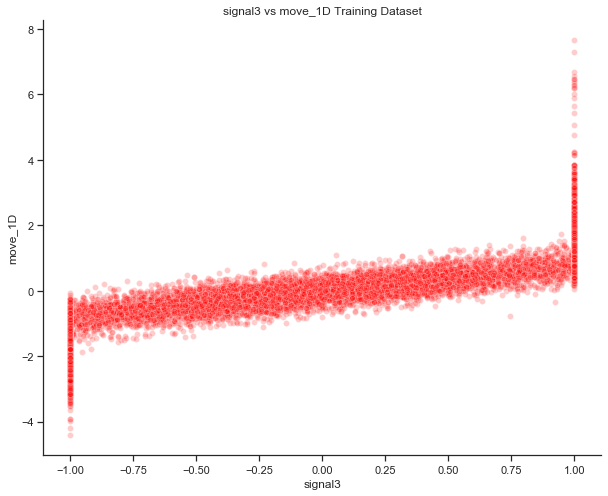

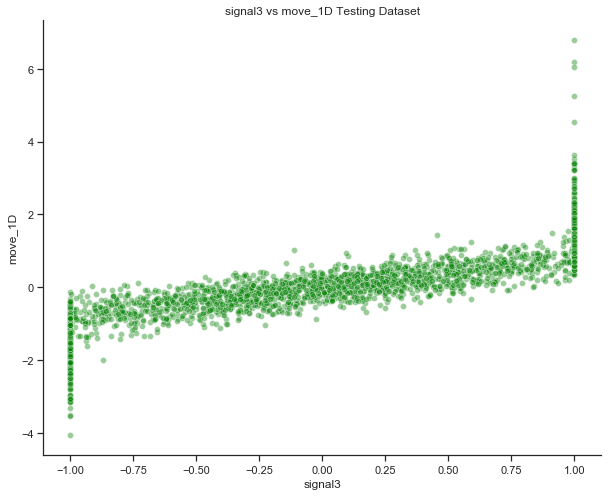

In [112]:
sns.set(style="ticks", rc={"axes.spines.right": False, "axes.spines.top": False})
 
plt.figure(figsize=(10,8))
sns.scatterplot(x=A_train['signal3'], y=b_train['move_1D'], color="red",alpha=0.2)
plt.title("signal3 vs move_1D Training Dataset")
 
plt.figure(figsize=(10,8))
sns.scatterplot(x=A_test['signal3'], y=b_test['move_1D'], color="green",alpha=0.4)
plt.title("signal3 vs move_1D Testing Dataset")
 
plt.show()

In [113]:
from sklearn.linear_model import LinearRegression
lm = LinearRegression()
lm.fit(A_train,b_train)
 
print("Slope of the Regression Line is : ", lm.coef_)
print("Intercept of Regression Line is : ",lm.intercept_)
 
from sklearn.metrics import mean_squared_error
pred_test = lm.predict(A_test)
rmse_test = mean_squared_error(b_test, pred_test)
from math import sqrt
rmse_test = sqrt(mean_squared_error(b_test, pred_test))
 
print("Accuracy of Linear Regression on testing data is : ", rmse_test)

Slope of the Regression Line is :  [[1.23461269]]
Intercept of Regression Line is :  [0.0021773]
Accuracy of Linear Regression on testing data is :  0.520491605029395


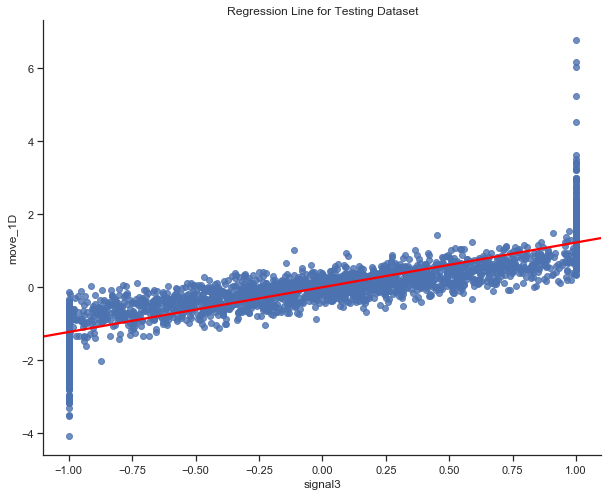

In [114]:
plt.figure(figsize=(10,8))
sns.regplot(x=A_test['signal3'], y=b_test['move_1D'], ci=None, line_kws={"color": "red"})
plt.title("Regression Line for Testing Dataset")
plt.show()

In [115]:
#polynomial regression

In [116]:
from sklearn.preprocessing import PolynomialFeatures
poly = PolynomialFeatures(2)
 
A_train_poly = poly.fit_transform(A_train)
A_test_poly = poly.fit_transform(A_test)
pm = LinearRegression()
pm.fit(A_train_poly,b_train)
 
pred_test = pm.predict(A_test_poly)
rmse_test = mean_squared_error(b_test, pred_test)
from math import sqrt
rmse_test = sqrt(mean_squared_error(b_test, pred_test))
 
print("Accuracy of Polynomial Regression on testing data is : ",rmse_test)


Accuracy of Polynomial Regression on testing data is :  0.5204028474291124


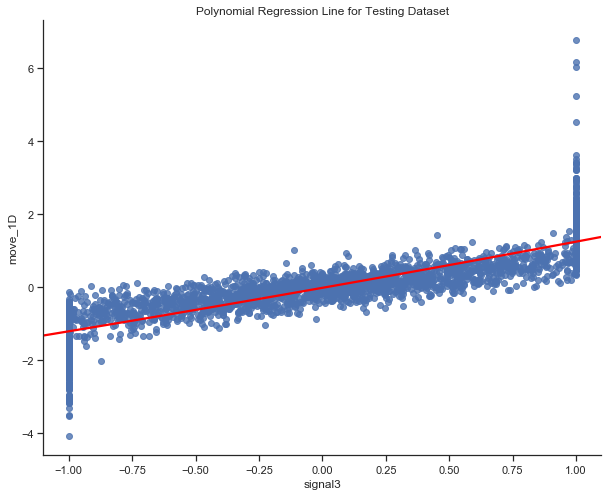

In [117]:
plt.figure(figsize=(10,8))
sns.regplot(x=A_test['signal3'], y=b_test['move_1D'], ci=None, line_kws={"color": "red"},order=2)
plt.title("Polynomial Regression Line for Testing Dataset")
plt.show()

In [118]:
#cubic spline

Accuracy for Cubic Spline on testing data is :  0.4654644616061885


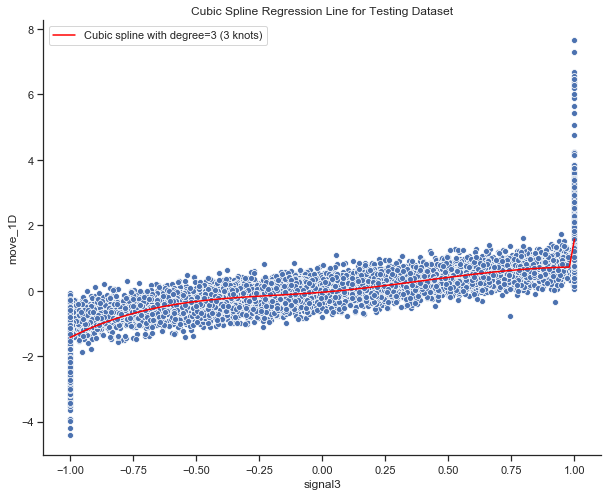

In [119]:
from patsy import dmatrix
transformed_x = dmatrix("bs(train, knots=(-1,0,1), degree=3, include_intercept=False)",
                        {"train": A_train},return_type='dataframe')
import statsmodels.api as sm
cs = sm.GLM(b_train, transformed_x).fit()
pred_test = cs.predict(dmatrix("bs(test, knots=(-1,0,1), include_intercept=False)",
                               {"test": A_test}, return_type='dataframe'))
rmse_test =mean_squared_error(b_test, pred_test)
from math import sqrt
rmse_test = sqrt(mean_squared_error(b_test, pred_test))
print("Accuracy for Cubic Spline on testing data is : ",rmse_test)
 
import numpy as np
plt.figure(figsize=(10,8))
xp = np.linspace(A_test.min(),A_test.max(), 100)
pred = cs.predict(dmatrix("bs(xp, knots=(-1,0,1), include_intercept=False)", 
                          {"xp": xp}, return_type='dataframe'))
sns.scatterplot(x=A_train['signal3'], y=b_train['move_1D'])
plt.plot(xp, pred, label='Cubic spline with degree=3 (3 knots)', color='red')
plt.legend()
plt.title("Cubic Spline Regression Line for Testing Dataset")
plt.show()

In [120]:
#lasso regression--not sure how to do this

In [222]:
# from sklearn.linear_model import Lasso, LassoCV


# x, y = (cfm['signal3'], cfm['liq_score'], cfm['bondlength'], cfm['move_1D']

# model = Lasso.(fit(x, y))
# print(model)
# score = model.score(x, y)
# ypred = model.predict(xtest)
# mse = mean_squared_error(ytest,ypred)
# print("Alpha:{0:.2f}, R2:{1:.2f}, MSE:{2:.2f}, RMSE:{3:.2f}"
#     .format(model.alpha, score, mse, np.sqrt(mse)))

# x_ax = range(len(ypred))
# plt.scatter(x_ax, ytest, s=5, color="blue", label="original")
# plt.plot(x_ax, ypred, lw=0.8, color="red", label="predicted")
# plt.legend()
# plt.show()

# alphas = [-1,-0.50,0, 0.5, 1]
# lassocv = LassoCV(alphas=alphas, cv=5).fit(x,y)
# print(lassocv)
# score = lassocv.score(x,y)
# ypred = lassocv.predict(xtest)
# mse = mean_squared_error(ytest,ypred)
# print("Alpha:{0:.2f}, R2:{1:.3f}, MSE:{2:.2f}, RMSE:{3:.2f}"
#     .format(lassocv.alpha_, score, mse, np.sqrt(mse)))

# x_ax = range(len(xtest))
# plt.scatter(x_ax, ytest, s=5, color="blue", label="original")
# plt.plot(x_ax, ypred, lw=0.8, color="red", label="predicted")
# plt.legend()
# plt.show() 

SyntaxError: invalid syntax (<ipython-input-222-5b0d8ca824e4>, line 9)